In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

from rliable import library as rly
from rliable import metrics
from rliable import plot_utils

In [2]:
def plot_matrix(matrix, title=None, save=None):
    
    # Plot the matrix
    plt.imshow(matrix, 
               cmap='viridis',  # Colormap
               aspect='auto')   # Aspect ratio

    # Add a colorbar
    cbar = plt.colorbar()  # Store the colorbar object
    cbar.ax.tick_params(labelsize=18)  # Set the fontsize of colorbar tick labels

    # Set axis labels
    plt.xlabel('Target task', fontsize=18)
    plt.ylabel('Source task', fontsize=18)

    # Set font size for x and y axis tick labels
    plt.tick_params(axis='x', labelsize=18)  # Set x-axis tick label font size
    plt.tick_params(axis='y', labelsize=18)  # Set y-axis tick label font size

    # Set title if provided
    if title:
        plt.title(title, fontsize=16)
    
    plt.tight_layout()  # Adjust layout to prevent overlap
    # Save the figure if a filename is provided
    if save:
        plt.savefig(save, bbox_inches='tight', dpi=300)

    # Show the plot
    plt.show()
    
def plot_subfigure(matrix, ax, title=None):
    ax.imshow(matrix,
              cmap='viridis',
              aspect='auto')
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    if title:
        ax.set_title(title, fontsize=16)
    
def plot_matrices(matrices, titles=None):
    n = len(matrices)
    fig, axs = plt.subplots(1, n, figsize=(5*n, 5))
    if n == 1:
        plot_subfigure(matrices[0], axs, titles[0] if titles else None)
    else:
        for i in range(n):
            plot_subfigure(matrices[i], axs[i], titles[i] if titles else None)
    plt.show()
    

def column_norm(matrix):
    return matrix / np.sum(matrix, axis=1)[np.newaxis, :]

In [3]:
def plot_matrix_for_dims(matrix, context_range):
    '''
    context_range: from small to large
    '''
    n1, n2, n3 = context_range
    mean_matrix = np.zeros([n1, n1])
    i = (n2//2) * (n3//2)+8
    mean_matrix = matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    # for i in range(n2*n3):
    #     mean_matrix+=matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    # mean_matrix/=(n2*n3)
    plot_matrix(mean_matrix)
    diag = np.diag(mean_matrix)
    print(diag)
    print(np.mean(diag))
    print(np.std(diag))

    mean_matrix = np.zeros([n2, n2])
    i = (n1//2) * (n3//2)
    ii = i%n1 + (i//n1) * (n1*n2)
    mean_matrix=matrix[ii:ii+(n1*n2):n1,ii:ii+(n1*n2):n1]
    # for i in range(n1*n3):
    #     ii = i%n1 + (i//n1) * (n1*n2)
    #     mean_matrix+=matrix[ii:ii+(n1*n2):n1,ii:ii+(n1*n2):n1]
    # mean_matrix/=(n1*n3)
    plot_matrix(mean_matrix)
    diag = np.diag(mean_matrix)
    print(diag)
    print(np.mean(diag))
    print(np.std(diag))

    mean_matrix = np.zeros([n3, n3])
    i = (n1//2) * (n2//2)
    mean_matrix=matrix[i:i+(n1*n2*n3):(n1*n2), i:i+(n1*n2*n3):(n1*n2)]
    # for i in range(n1*n2):
    #     mean_matrix+=matrix[i:i+(n1*n2*n3):(n1*n2), i:i+(n1*n2*n3):(n1*n2)]
    # mean_matrix/=n1*n2
    plot_matrix(mean_matrix)
    diag = np.diag(mean_matrix)
    print(diag)
    print(np.mean(diag))
    print(np.std(diag))
    
def plot_matrix_for_dims_average(matrix, context_range):
    # matrix = column_norm(matrix)
    '''
    context_range: from small to large
    '''
    n1, n2, n3 = context_range
    mean_matrix = np.zeros([n1, n1])
    # i = (n2//2) * (n3//2)+8
    # mean_matrix = matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    n = 3
    fig, axs = plt.subplots(1, n, figsize=(5*n, 5))
    for i in range(n2*n3):
        mean_matrix+=matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    mean_matrix/=(n2*n3)
    plot_subfigure(mean_matrix, axs[0])

    mean_matrix = np.zeros([n2, n2])
    for i in range(n1*n3):
        ii = i%n1 + (i//n1) * (n1*n2)
        mean_matrix+=matrix[ii:ii+(n1*n2):n1,ii:ii+(n1*n2):n1]
    mean_matrix/=(n1*n3)
    plot_subfigure(mean_matrix, axs[1])

    mean_matrix = np.zeros([n3, n3])
    for i in range(n1*n2):
        mean_matrix+=matrix[i:i+(n1*n2*n3):(n1*n2), i:i+(n1*n2*n3):(n1*n2)]
    mean_matrix/=n1*n2
    plot_subfigure(mean_matrix, axs[2])
    plt.show()
    
def plot_matrix_for_dims_average(matrix, context_range):
    # matrix = column_norm(matrix)
    '''
    context_range: from small to large
    '''
    n1, n2, n3 = context_range
    mean_matrix = np.zeros([n1, n1])
    # i = (n2//2) * (n3//2)+8
    # mean_matrix = matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    for i in range(n2*n3):
        mean_matrix+=matrix[i*n1:(i+1)*n1, i*n1:(i+1)*n1]
    mean_matrix/=(n2*n3)
    plot_matrix(mean_matrix)

    mean_matrix = np.zeros([n2, n2])
    for i in range(n1*n3):
        ii = i%n1 + (i//n1) * (n1*n2)
        mean_matrix+=matrix[ii:ii+(n1*n2):n1,ii:ii+(n1*n2):n1]
    mean_matrix/=(n1*n3)
    plot_matrix(mean_matrix)

    mean_matrix = np.zeros([n3, n3])
    for i in range(n1*n2):
        mean_matrix+=matrix[i:i+(n1*n2*n3):(n1*n2), i:i+(n1*n2*n3):(n1*n2)]
    mean_matrix/=n1*n2
    plot_matrix(mean_matrix)

### Transfer matrix for synthetic data

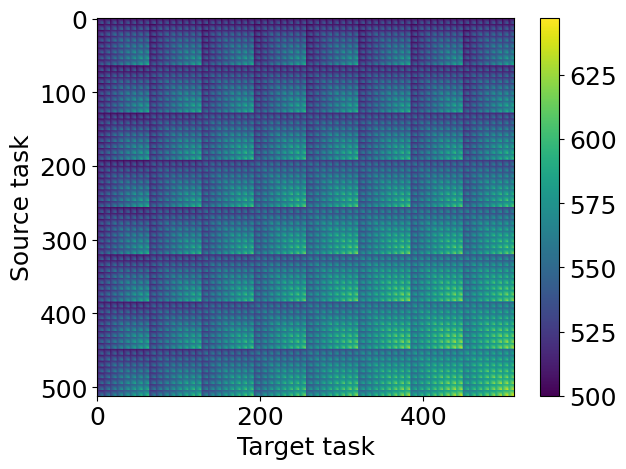

In [4]:
matrix_path = "data/transfer_reward_matrix_synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_trial0.npy"
matrix = np.load(matrix_path)

plot_matrix(matrix, save="figures/transfer_matrix_synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_trial0.png")
matrix = np.where(np.isnan(matrix), np.nanmean(matrix), matrix)
context_dims=[8, 8, 8]

# plot_matrix_for_dims_average(matrix, context_dims)

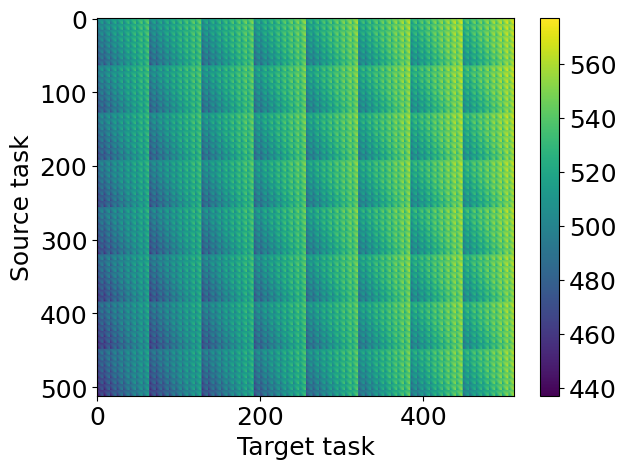

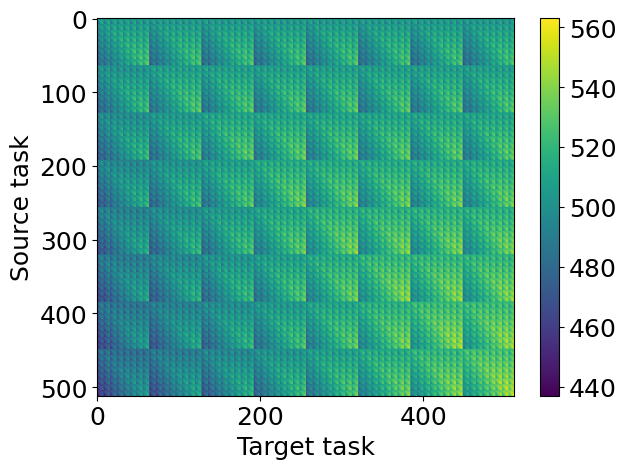

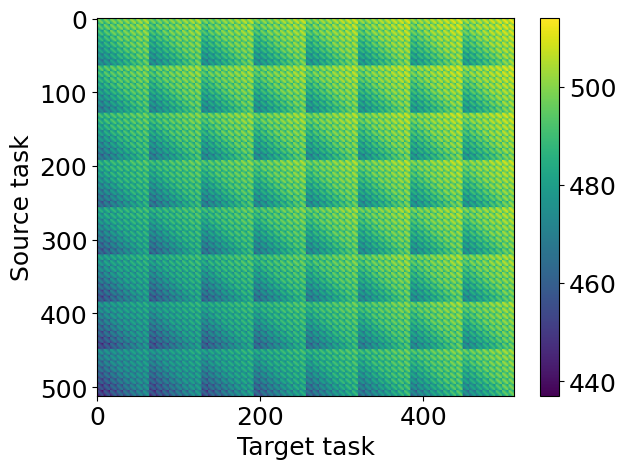

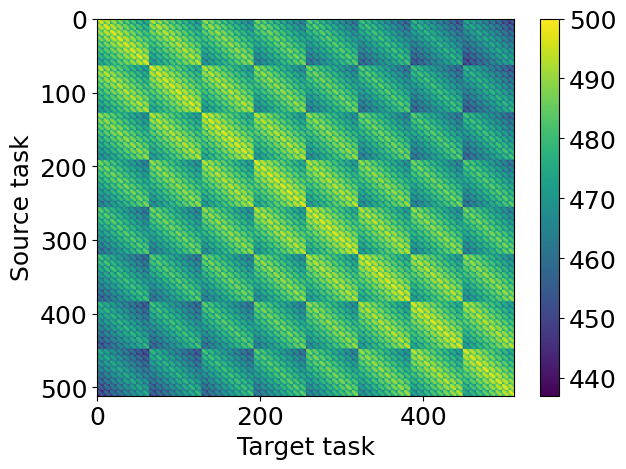

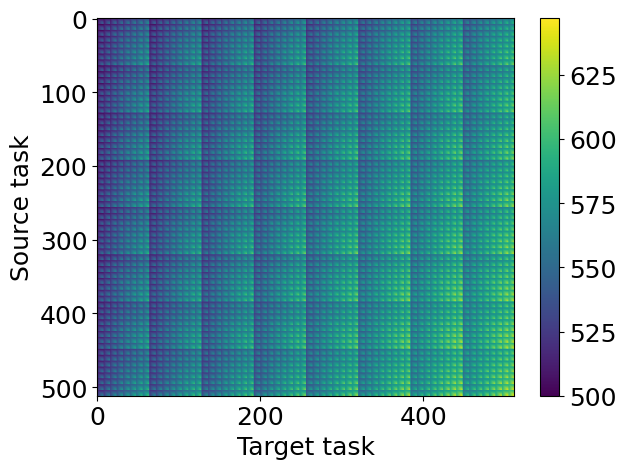

...

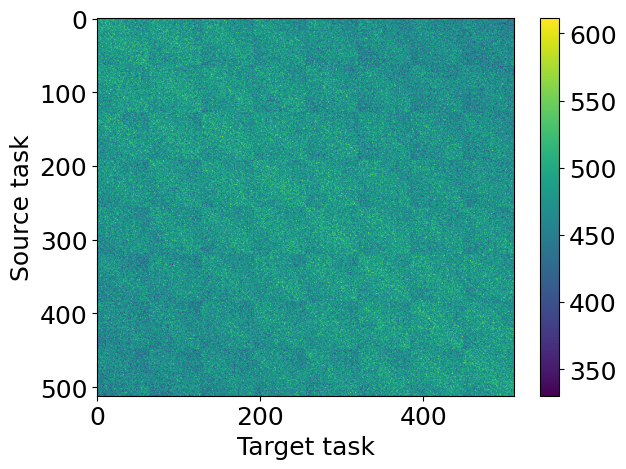

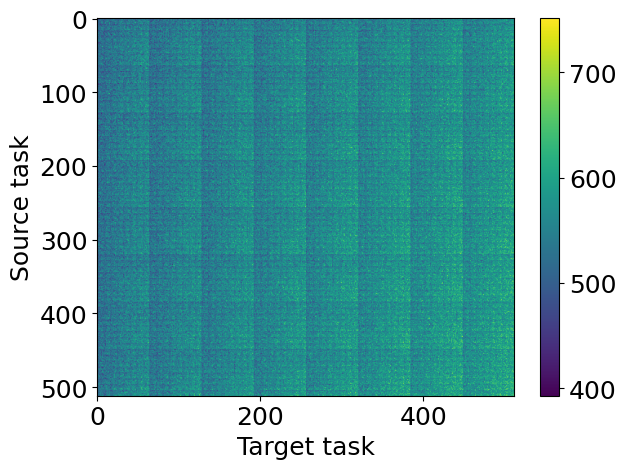

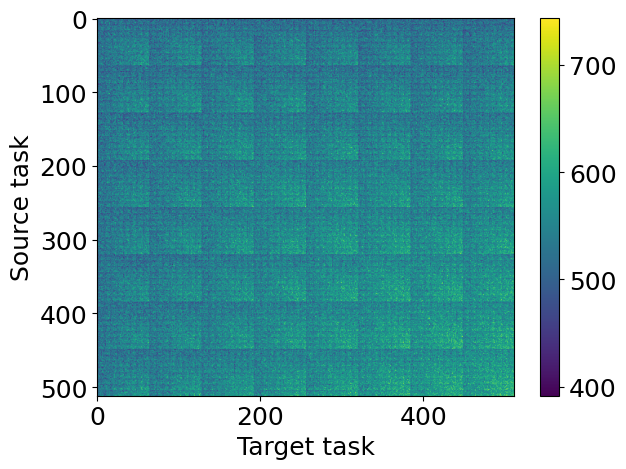

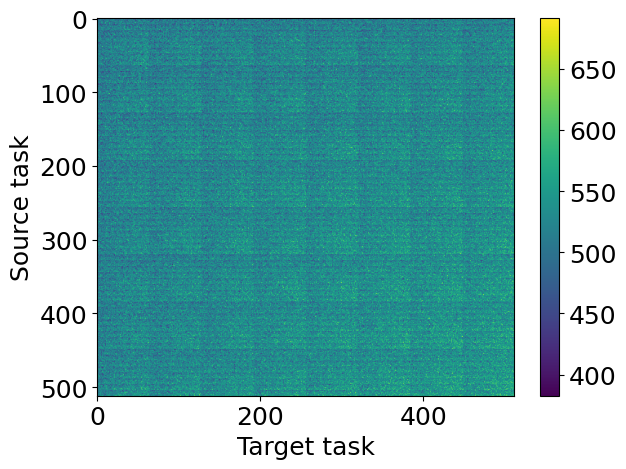

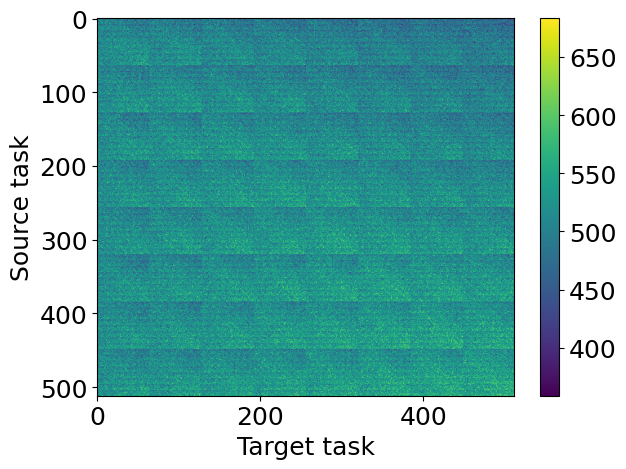

In [5]:
noise_list = [0, 5, 30]
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for noise in noise_list
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

for name in synthetic_combinations:
    # matrix_path = "data/transfer_reward_matrix_synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_trial0.npy"
    matrix_path = f"data/transfer_reward_matrix_{name}_trial0.npy"
    matrix = np.load(matrix_path)

    plot_matrix(matrix, save=f"figures/transfer_matrix_{name}_trial0.png")

### Transfer Matrix of Crop

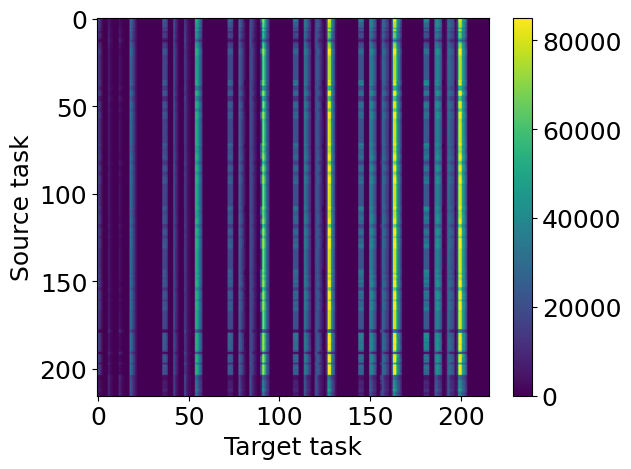

In [6]:
matrix_path = "data/transfer_reward_matrix_crop_trial2.npy"
matrix = np.load(matrix_path)

plot_matrix(matrix)
matrix = np.where(np.isnan(matrix), np.nanmean(matrix), matrix)
context_dims=[6, 6, 6]

# plot_matrix_for_dims_average(matrix, context_dims)

In [7]:
for trial in range(3):
    matrix_path = f"data/transfer_reward_matrix_crop_trial{trial}.npy"
    matrix = np.load(matrix_path)
    print(matrix.shape)
    solvable_indices = np.where(np.sum(matrix, axis=0)!=0)[0]
    print(solvable_indices.shape)
    matrix_solvable = matrix[solvable_indices, :]
    matrix_solvable = matrix_solvable[:, solvable_indices]
    print(matrix_solvable.shape)
    np.save(f"data/transfer_reward_matrix_crop_solvable_trial{trial}.npy", matrix_solvable)

    

(216, 216)
(144,)
(144, 144)
(216, 216)
(144,)
(144, 144)
(216, 216)
(144,)
(144, 144)


### Transfer Matrix of Bipedal Walker

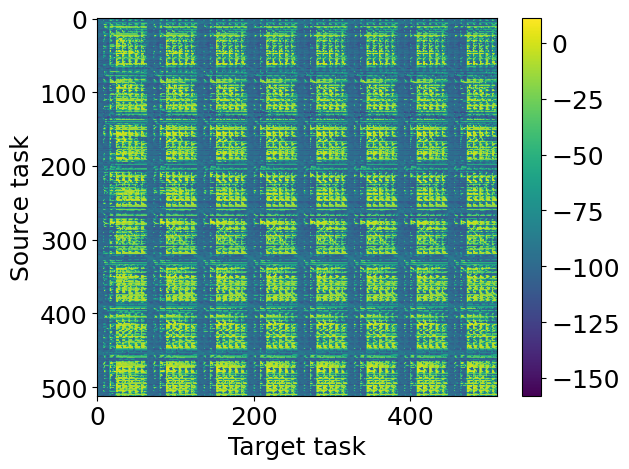

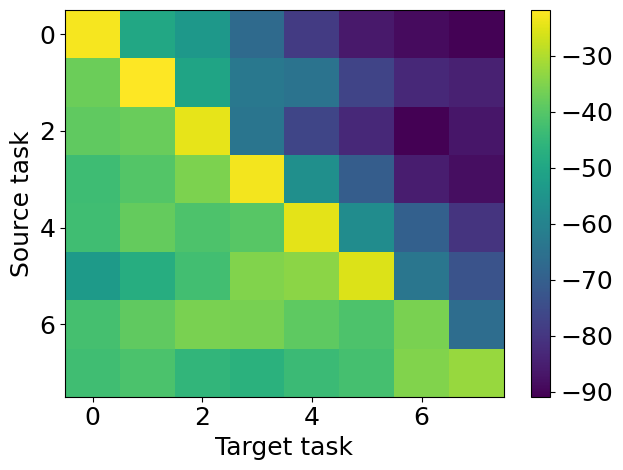

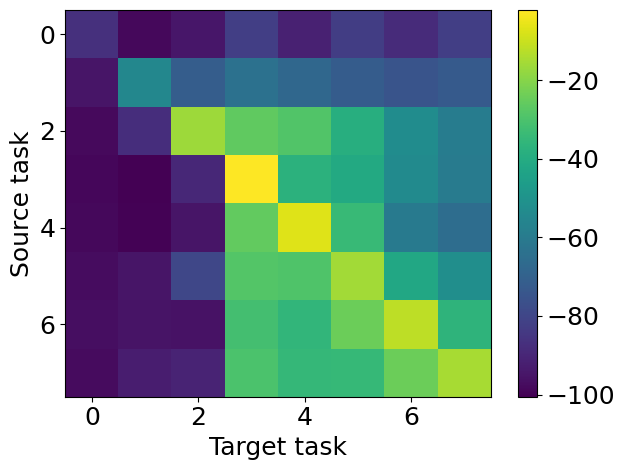

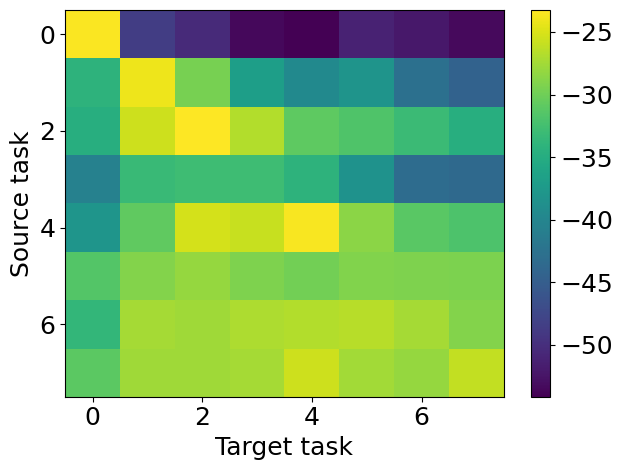

In [8]:
matrix_path = "data/transfer_reward_bipedalwalker_matrix_8_trial0.npy"
matrix = np.load(matrix_path)
# matrix = np.where(np.isnan(matrix), np.nanmean(matrix), matrix)
plot_matrix(matrix)
context_dims=[8, 8, 8]
plot_matrix_for_dims_average(matrix, context_dims)
# plot_matrices(matrix)

### Transfer Matrix: Cart-pole

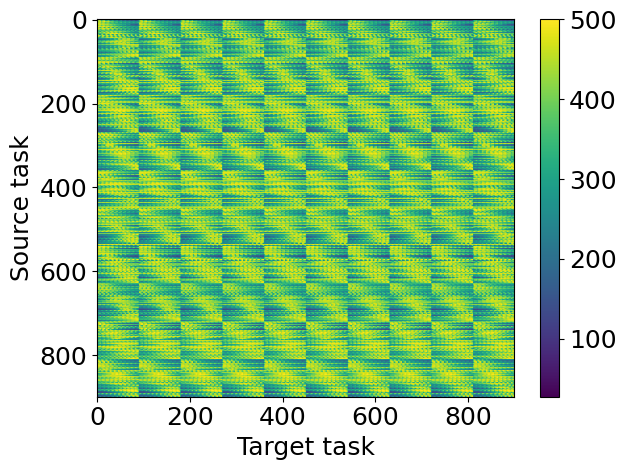

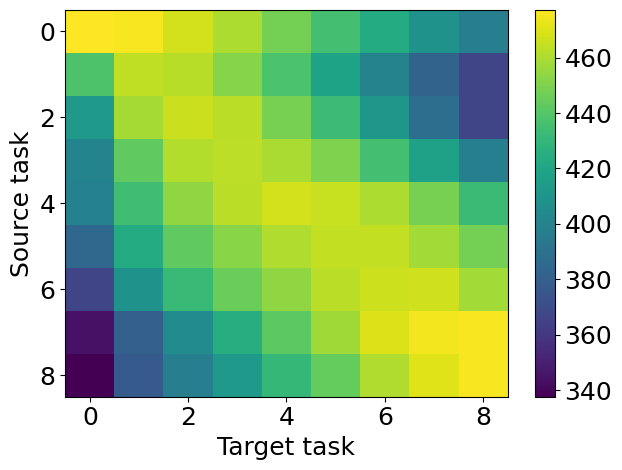

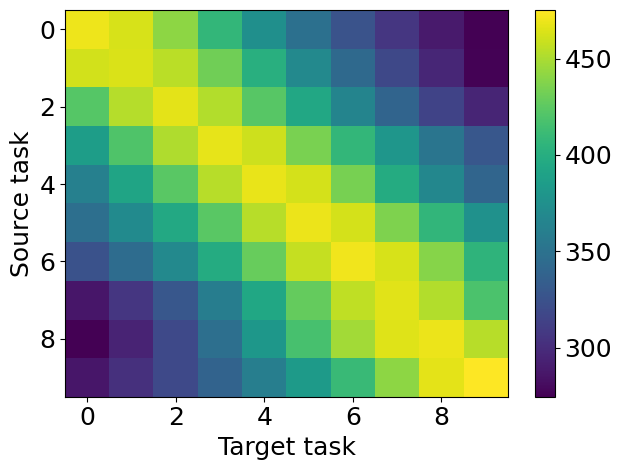

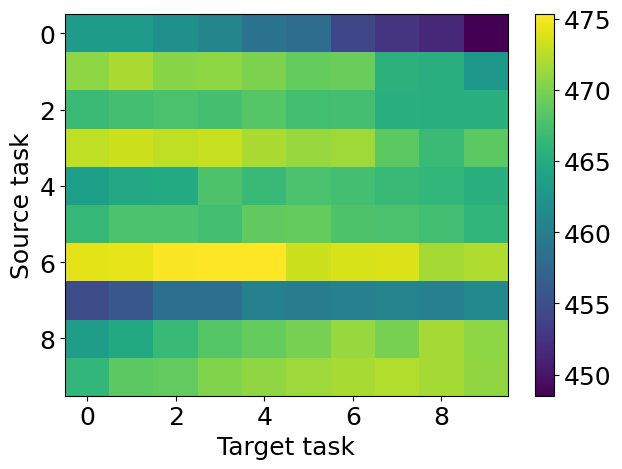

In [9]:
matrix_path = "data/transfer_reward_matrix_trial0.npy"
matrix = np.load(matrix_path)
plot_matrix(matrix)
context_dims=[9, 10, 10]
plot_matrix_for_dims_average(matrix, context_dims)

### Transfer Matrix: IntersectionZoo

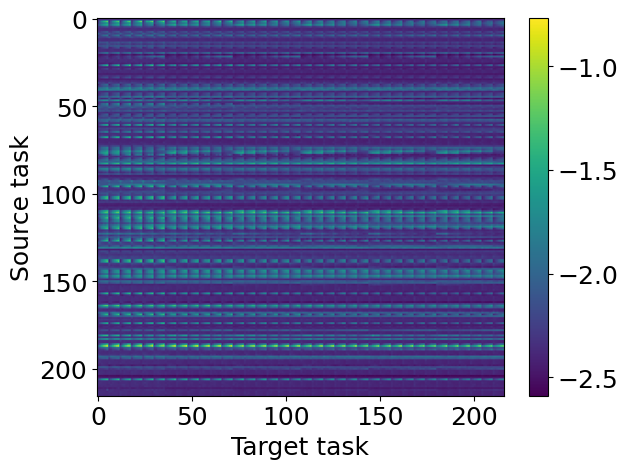

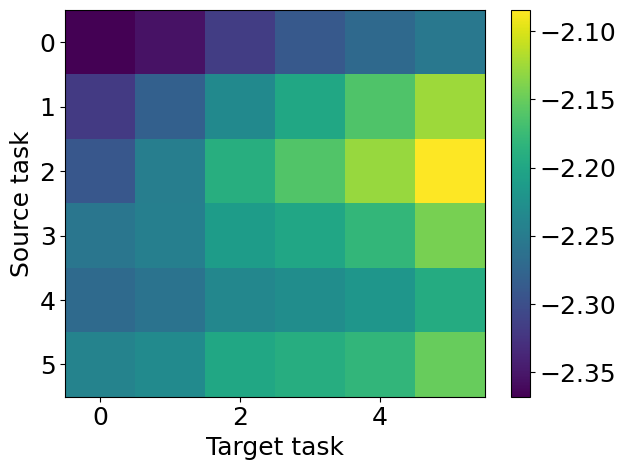

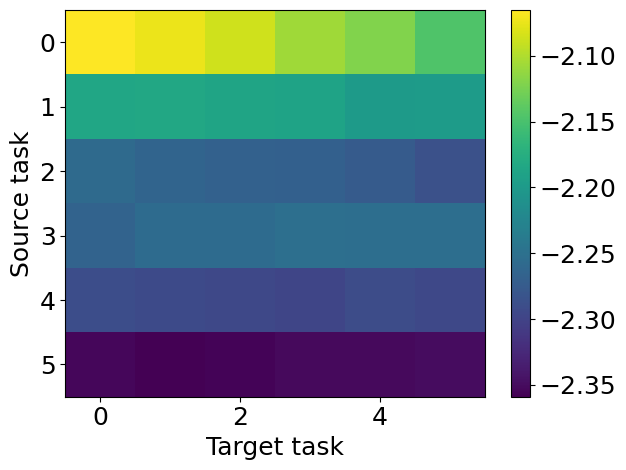

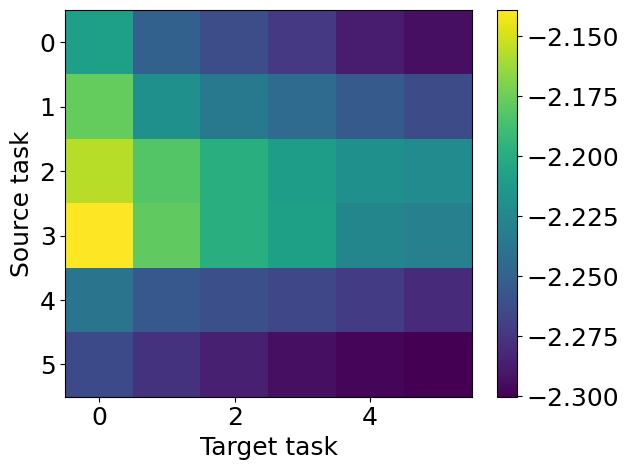

In [10]:
matrix_path = "data/transfer_reward_array_intersectionzoo_trial0.npy"
matrix = np.load(matrix_path)
# matrix[matrix==0]=np.mean(matrix)
plot_matrix(matrix)
context_dims=[6, 6, 6]
plot_matrix_for_dims_average(matrix, context_dims)

### Transfer Matrix: Crop

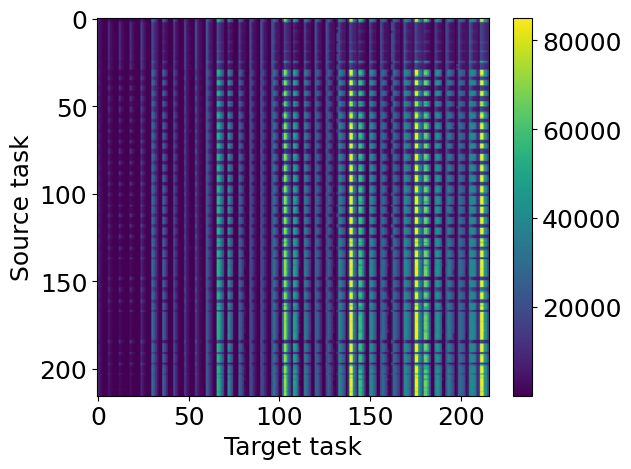

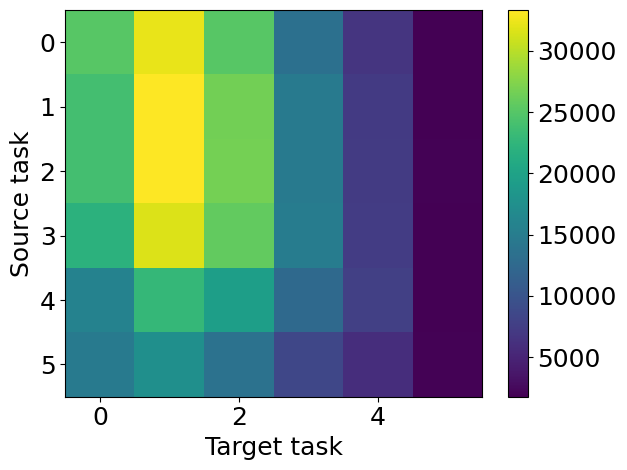

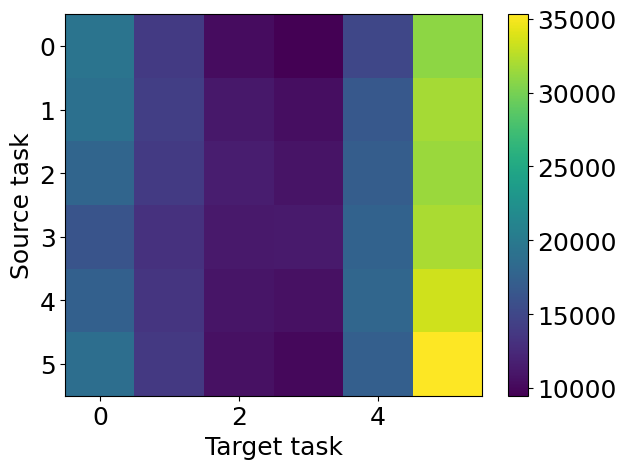

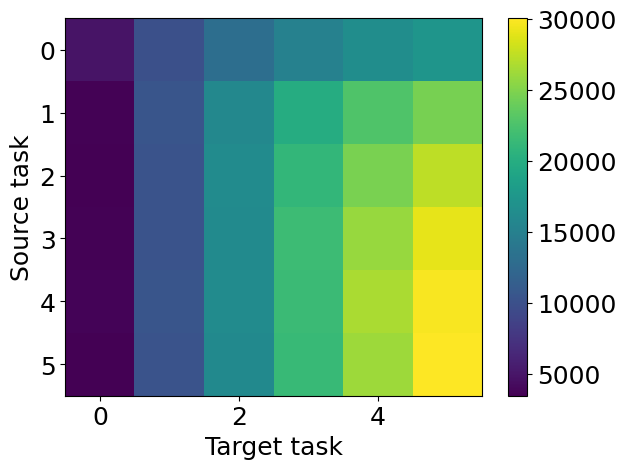

In [11]:
matrix_path = "data/transfer_reward_matrix_crop_new_trial0.npy"
matrix = np.load(matrix_path)
# matrix[matrix==0]=np.mean(matrix)
plot_matrix(matrix)
context_dims=[6, 6, 6]
plot_matrix_for_dims_average(matrix, context_dims)

# Plot Performance

In [ ]:
def plot(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None, plot_title=False, legend=False):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))

    for alg_name in name_plot.keys():
        if alg_name == "multi_task":
            if len(multi_task_performance) == K:
                mean_vals = np.mean(multi_task_performance, axis=1)
                std_vals  = np.std(multi_task_performance, axis=1)
            else:
                mean_vals = np.mean(multi_task_performance) * np.ones(K)
                std_vals  = np.std(multi_task_performance) * np.ones(K)
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.05, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Normalized Performance", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.xscale("log")
    if legend:
        plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if plot_title:
        plt.title(plot_title, fontsize=18)
    if save_name:
        plt.savefig(f"figures/result_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [ ]:
def plot_time(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))
    for alg_name in name_plot.keys():
        if alg_name == "multi_task":
            data_array = multi_task_performance
            mean_vals = np.mean(data_array, axis=1)
            std_vals  = np.std(data_array, axis=1)
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.1, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Runtime", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.yscale("log")
    plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if save_name:
        plt.savefig(f"figures/result_time_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [ ]:
def plot_ablation(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None, plot_title=False, legend=False):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))

    for alg_name in name_plot.keys():
        # print(alg_name)
        if alg_name == "multi_task":
            if len(multi_task_performance) == K:
                mean_vals = np.mean(multi_task_performance, axis=1)
                std_vals  = np.std(multi_task_performance, axis=1)
            else:
                mean_vals = np.mean(multi_task_performance) * np.ones(K)
                std_vals  = np.std(multi_task_performance) * np.ones(K)
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.05, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Normalized Performance", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.xscale("log")
    if legend:
        plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if plot_title:
        plt.title(plot_title, fontsize=18)
    if save_name:
        plt.savefig(f"figures/result_ablation_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

In [ ]:
multi_task_performance = None
name_plot = {
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    "random_select": "Random",
    "GPMBTL": "GP-MBTL",
    "MMBTL": "M-MBTL",
    "SDMBTL": "M/GP-MBTL (Ours)",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
}
linestyle = {
    "SDMBTL": "-",
    "multi_task": "--",
    "random_select":"-",
    "MMBTL": "-",
    "independent_training": "--", 
    "stochastic_oracle": "--",
    "myopic_oracle": "--",
    "oracle": "--",
    "MBTL": "-",
    "random_mountain": "--",
    "random_GP": "--",
}
cmap = plt.get_cmap('Accent').colors
# cmap = plt.get_cmap('tab10').colors
color = {
    "SDMBTL": cmap[4],
    "multi_task":         cmap[1],
    "random_select":      cmap[0],
    "MMBTL": cmap[5],
    "independent_training":    cmap[2],
    "stochastic_oracle":  cmap[3],
    "MBTL":               cmap[6],
    "myopic_oracle":      cmap[7],
    "random_mountain": cmap[5],
    "random_GP": cmap[6],
}
ablation_name_plot = {
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    "random_select": "Random",
    "MBTL": "GP-MBTL",
    "MMBTL": "M-MBTL",
    "random_mountain": "M-MBTL + Random",
    "random_GP": "GP-MBTL + Random",
    "SDMBTL": "M/GP-MBTL (Ours)",
    "myopic_oracle": "Myopic Oracle",
}
time_name_plot = {
    "SDMBTL": "M/GP-MBTL (Ours)",
    "MMBTL": "M-MBTL",
    "MBTL": "GP-MBTL",
}
y_lim = None
log_scale = True

### Cartpole

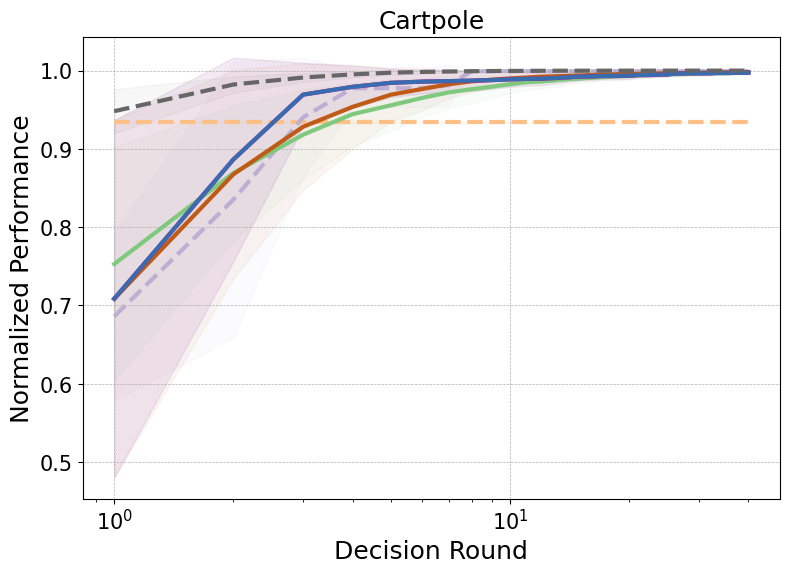

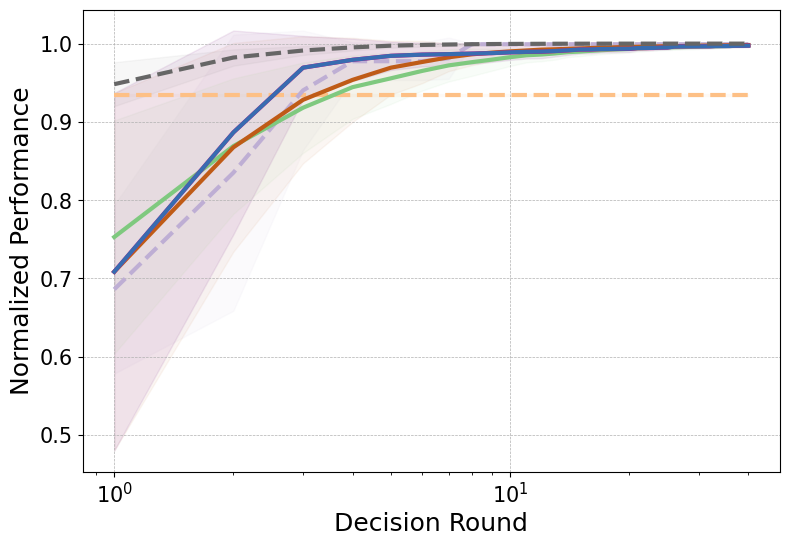

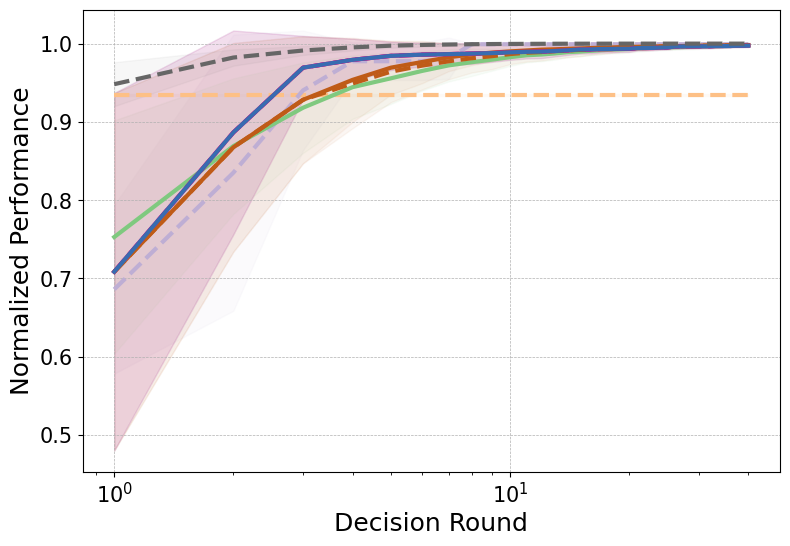

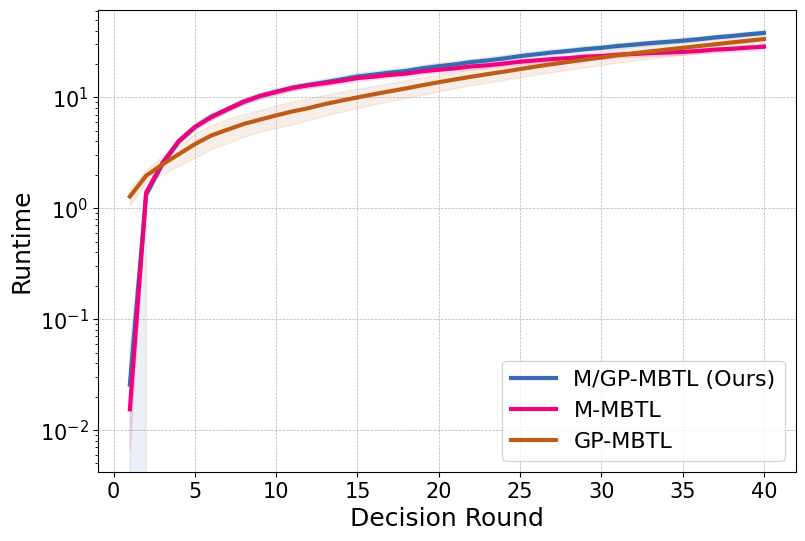

In [16]:
# Process multitask data
K=30
K=40 # temporal
# K=100
min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)

multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_transfer_reward_matrix_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    multi_task_list.append(np.mean(indep_reward, axis=1))
multi_task_list_best = np.zeros_like(multi_task_list)
for i in range(len(multi_task_list)):
    for j in range(len(multi_task_list[i])):
        multi_task_list_best[i][j] = np.maximum(multi_task_list[i][j], multi_task_list_best[i][j-1]) if j>0 else multi_task_list[i][j]
    multi_task_performance = np.concatenate([multi_task_list_best[i][:,np.newaxis] for i in range(3)], axis=1)
for _ in range(K-len(multi_task_performance)):
    multi_task_performance = np.concatenate([multi_task_performance, multi_task_performance[-1][np.newaxis]], axis=0)
multi_task_performance_cartpole = multi_task_performance.copy()
data_path=f"results/cartpole_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, plot_title="Cartpole")
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"cartpole_boot{K}")
plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"cartpole_boot{K}")
data_path=f"results/cartpole_boot_new_time_{K}_slope=0.01.npz"
plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"cartpole_boot{K}")

### IntersectionZoo

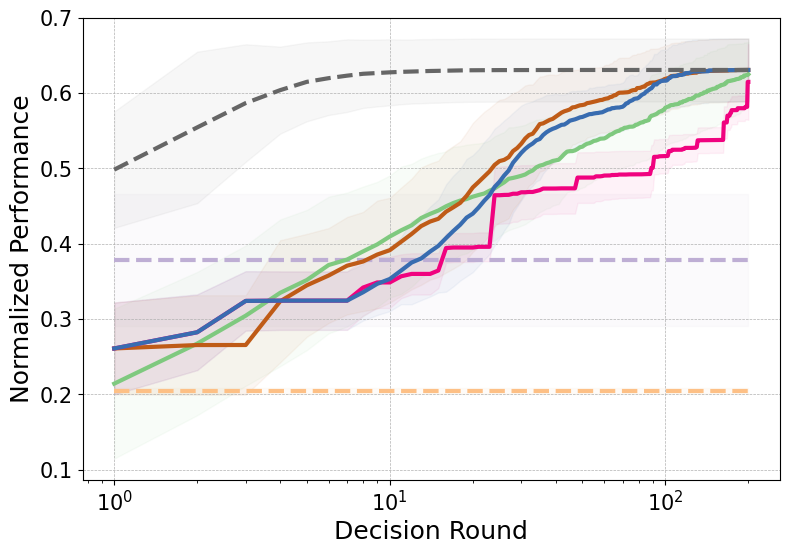

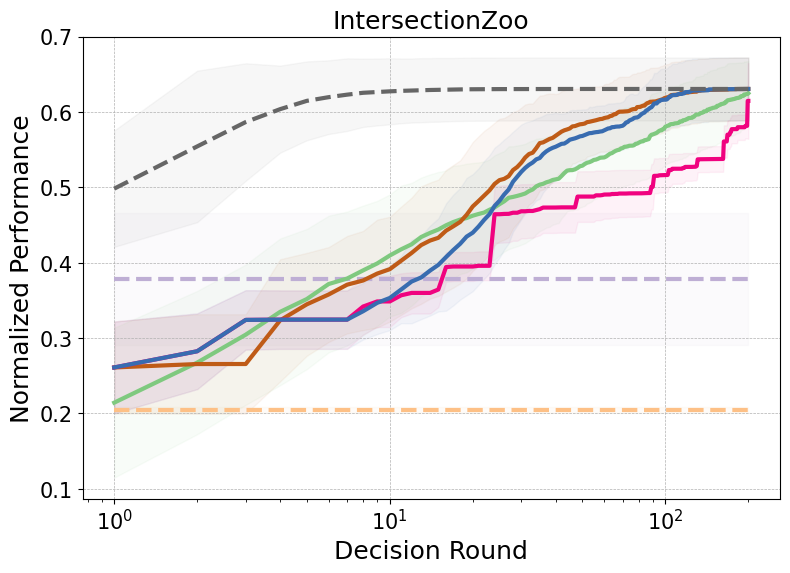

KeyError: 'random_mountain'

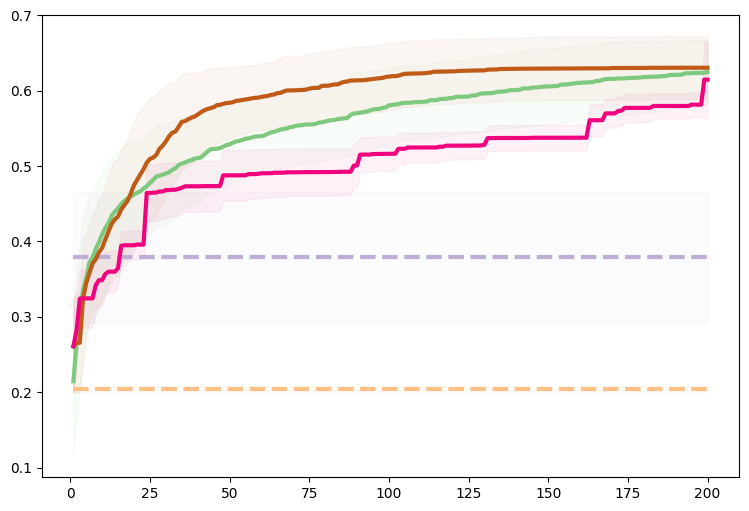

In [17]:
# K=216
K=200
# K=50 # temporal
min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)
multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_reward_array_intersectionzoo_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    multi_task_list.append(np.mean(indep_reward))
multi_task_performance_intersectionzoo = multi_task_list.copy()
data_path=f"results/intersectionZoo_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"intersectionZoo_boot{K}")
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, plot_title="IntersectionZoo")
plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"intersectionZoo_boot{K}")
data_path=f"results/intersectionZoo_boot_new_time_{K}_slope=0.01.npz"
plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"intersectionZoo_boot{K}")

### BipedalWalker

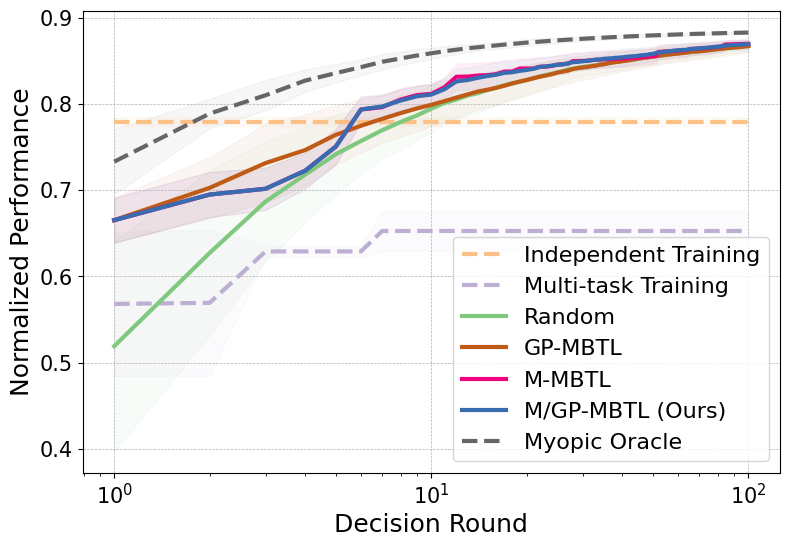

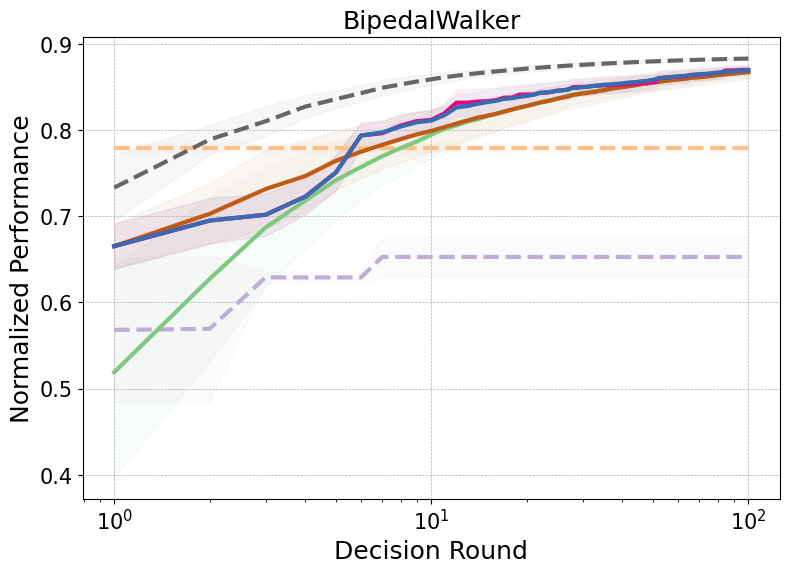

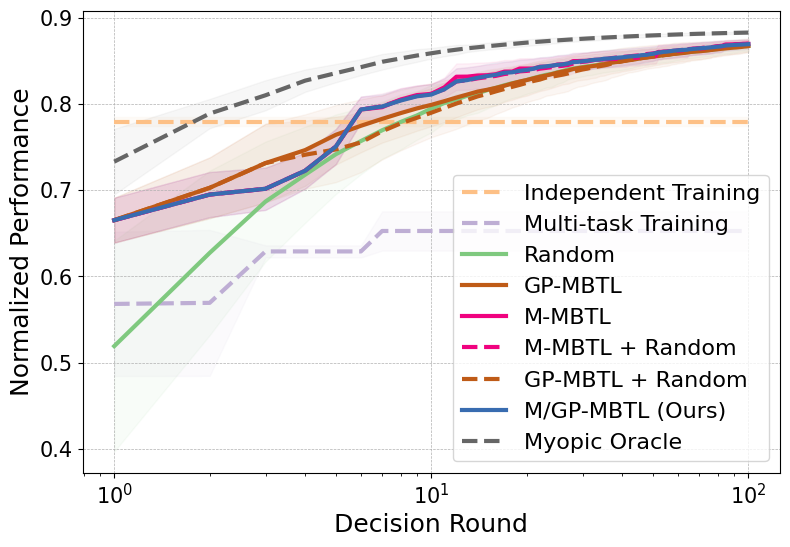

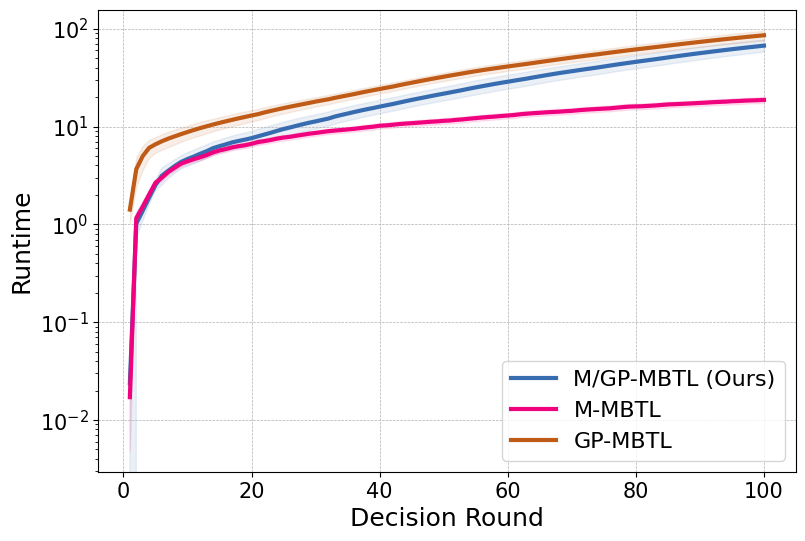

In [ ]:
# K=256
K=80
K=100
min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)

multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_transfer_reward_bipedalwalker_matrix_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    multi_task_list.append(np.mean(indep_reward, axis=1))

multi_task_list_best = np.zeros_like(multi_task_list)
for i in range(len(multi_task_list)):
    for j in range(len(multi_task_list[i])):
        multi_task_list_best[i][j] = np.maximum(multi_task_list[i][j], multi_task_list_best[i][j-1]) if j>0 else multi_task_list[i][j]
    multi_task_performance = np.concatenate([multi_task_list_best[i][:,np.newaxis] for i in range(3)], axis=1)
for _ in range(K-len(multi_task_performance)):
    multi_task_performance = np.concatenate([multi_task_performance, multi_task_performance[-1][np.newaxis]], axis=0)
multi_task_performance_walker = multi_task_performance.copy()
data_path=f"results/walker_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"walker_boot{K}", legend=True)
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, plot_title="BipedalWalker")
plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"walker_boot{K}", legend=True)
data_path=f"results/walker_boot_new_time_{K}_slope=0.01.npz"
plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_performance, save_name=f"walker_boot{K}")

### Crop management

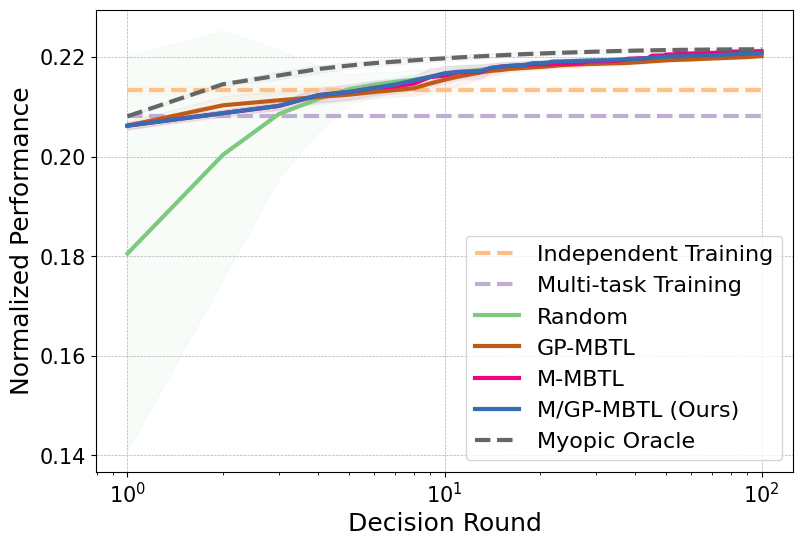

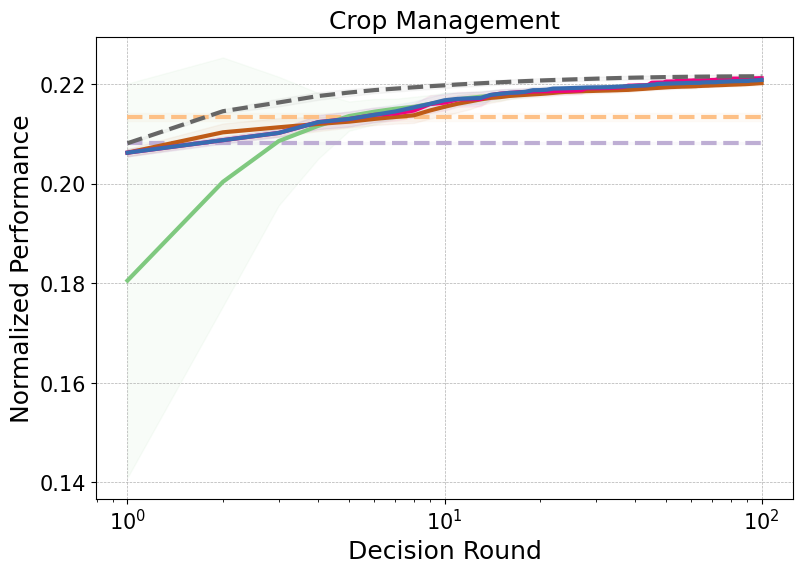

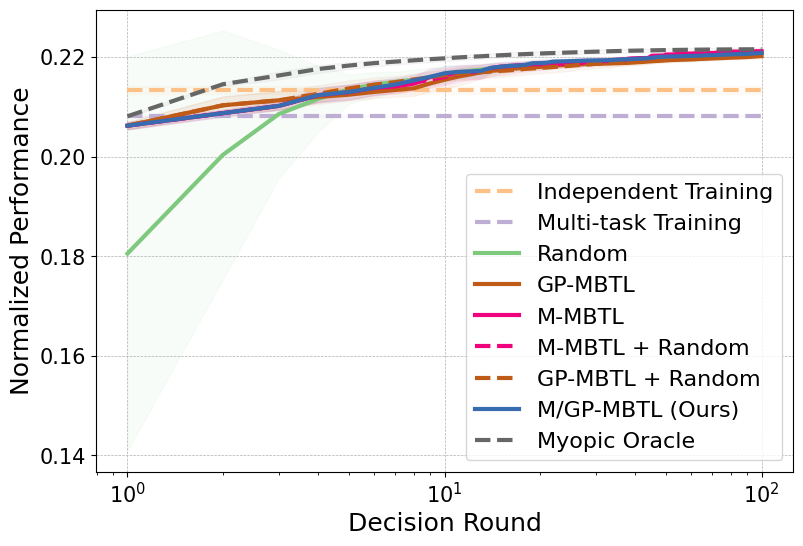

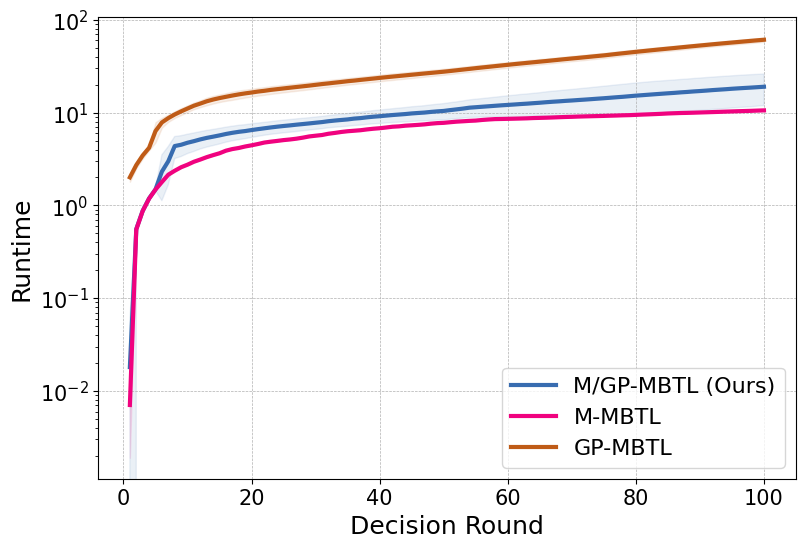

In [ ]:
K=50
# K=216
K=100

min_value = np.inf
max_value = -np.inf
# Assume that we already known the max and min value of the environment
for trial in range(3):
    matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
    matrix = np.load(matrix_path)
    max_value_trial = np.max(matrix)
    min_value_trial = np.min(matrix)
    max_value = np.maximum(max_value, max_value_trial)
    min_value = np.minimum(min_value, min_value_trial)
multi_task_list = []
for trial in range(3):
    indep_reward = np.load(f"data/multitask_transfer_reward_matrix_crop_new_trial{trial}.npy")
    indep_reward = (indep_reward - min_value)/(max_value-min_value)
    multi_task_list.append(np.mean(indep_reward))
    
multi_task_performance_crop = multi_task_list.copy()

data_path=f"results/crop_boot_new_{K}_slope=0.01.npz"
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"crop_boot{K}", legend=True)
plot(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, plot_title="Crop Management")
plot_ablation(data_path, K, ablation_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"crop_boot{K}", legend=True)
data_path=f"results/crop_boot_new_time_{K}_slope=0.01.npz"
plot_time(data_path, K, time_name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=multi_task_list, save_name=f"crop_boot{K}")


### Synthetic data

In [11]:
def plot_synthetic(data_path, K, name_plot, y_lim=None, linestyle=None, color=None, log_scale=False, multi_task_performance=None, save_name=None, plot_title=False, legend=False):
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    # Plotting
    steps = np.arange(1, K + 1)
    plt.figure(figsize=(9, 6))
    # plt.figure(figsize=(12, 9))

    for alg_name in name_plot.keys():
        # print(alg_name)
        if alg_name == "multi_task":
            continue
        else:
            data_array = np.array(perf_data[alg_name])[:, :K]
            mean_vals = np.mean(data_array, axis=0)
            std_vals  = np.std(data_array, axis=0)

        # Plot mean
        plt.plot(steps, mean_vals, label=name_plot[alg_name], linestyle=linestyle[alg_name], color=color[alg_name], linewidth=3)
        # Plot shaded region for std
        plt.fill_between(steps, mean_vals - std_vals, mean_vals + std_vals, alpha=0.05, color=color[alg_name])

    plt.xlabel("Decision Round", fontsize=18)
    plt.ylabel("Normalized Performance", fontsize=18)
    if y_lim:
        plt.ylim(y_lim[0], y_lim[1])
    plt.xticks(fontsize=15)  # X-axis font size
    plt.yticks(fontsize=15)  # Y-axis font size
    if log_scale:
        plt.xscale("log")
    if legend:
        plt.legend(fontsize=16, loc='lower right')
    plt.grid(True, linestyle='--', linewidth=0.5)
    if plot_title:
        plt.title(plot_title, fontsize=18)
    if save_name:
        plt.savefig(f"figures/result_{save_name}.svg", format="svg", dpi=300, bbox_inches='tight')
    else:
        plt.show()

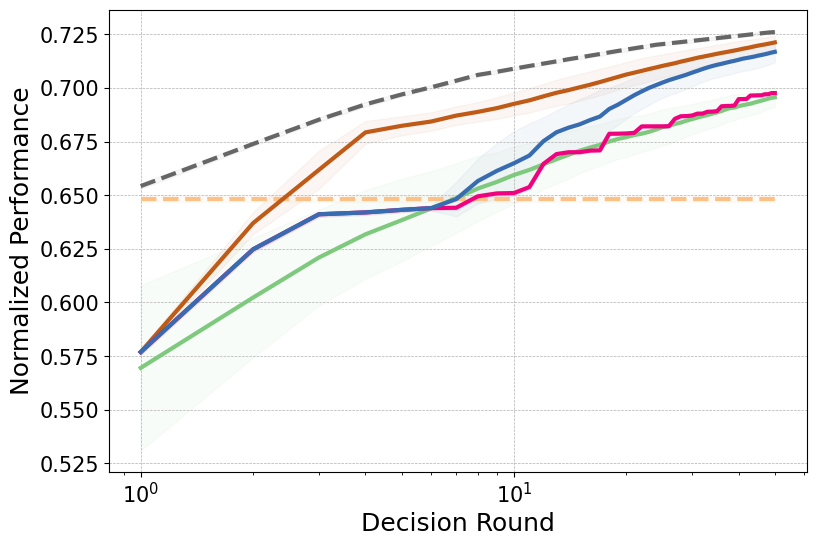

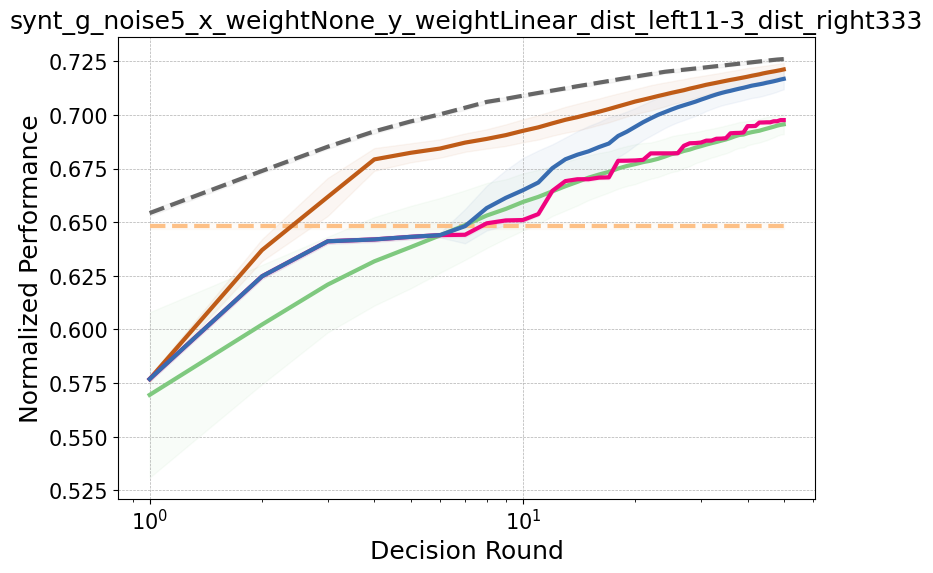

synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333


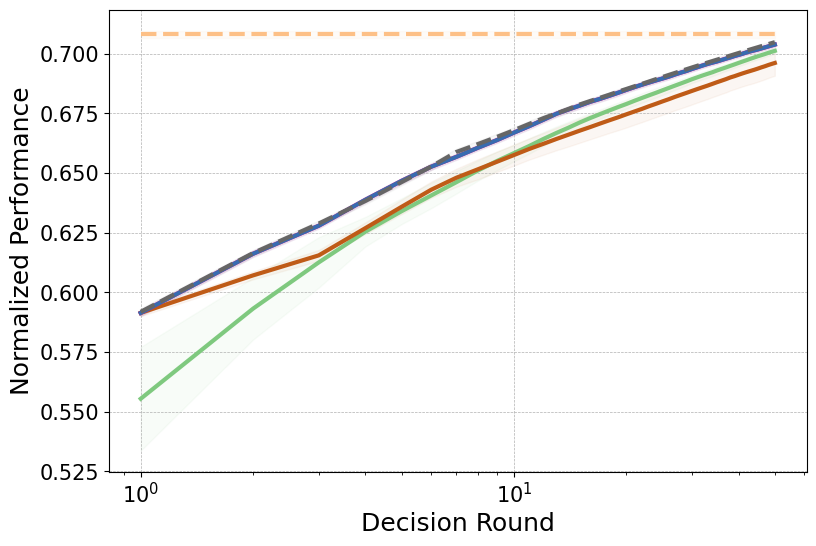

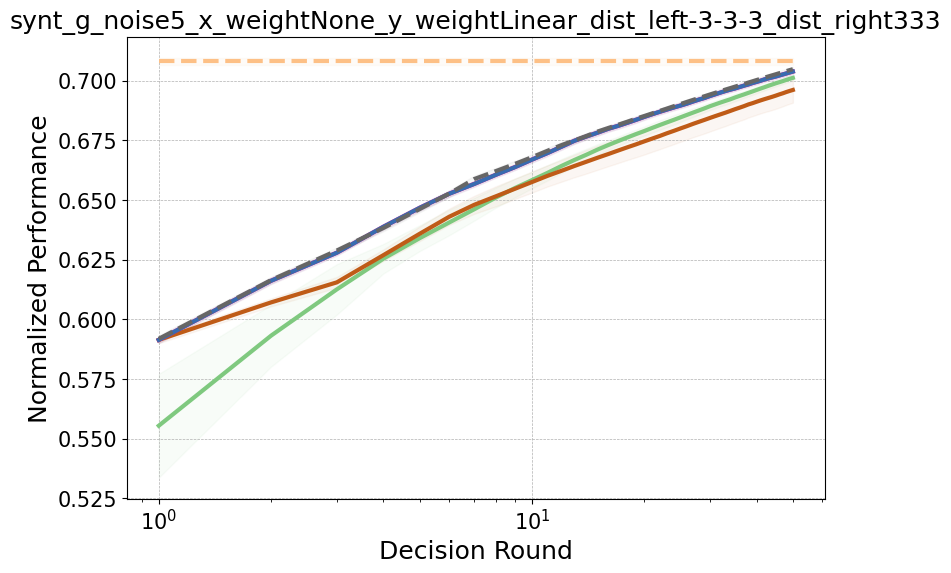

synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333


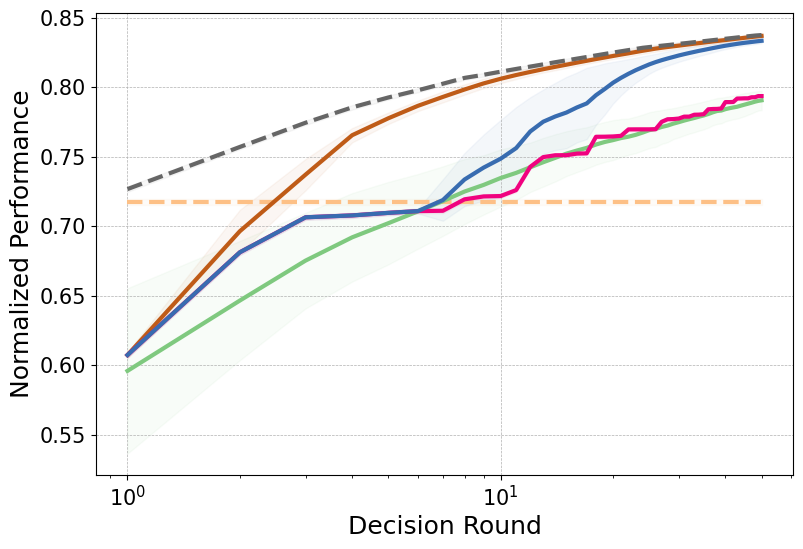

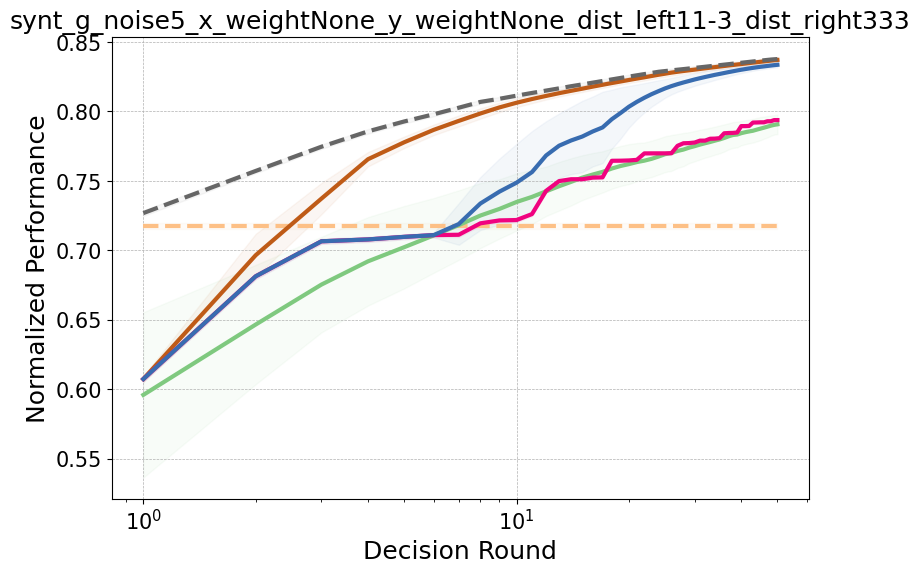

synt_g_noise5_x_weightNone_y_weightNone_dist_left11-3_dist_right333


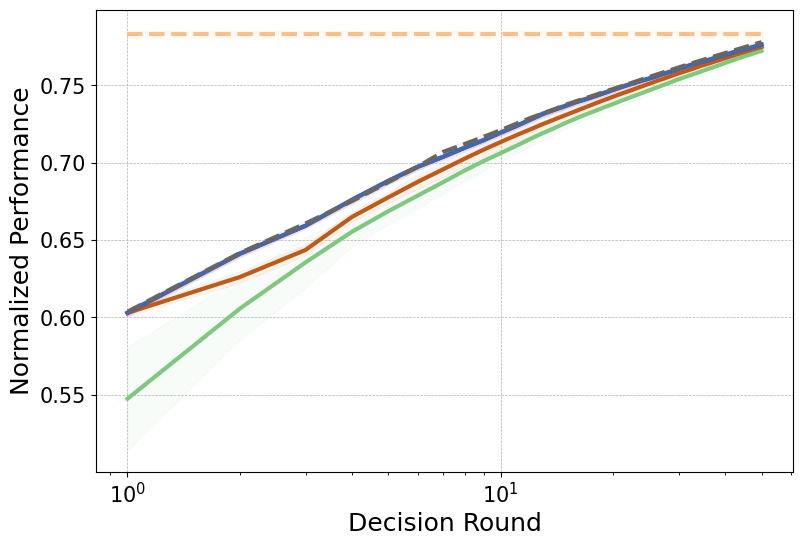

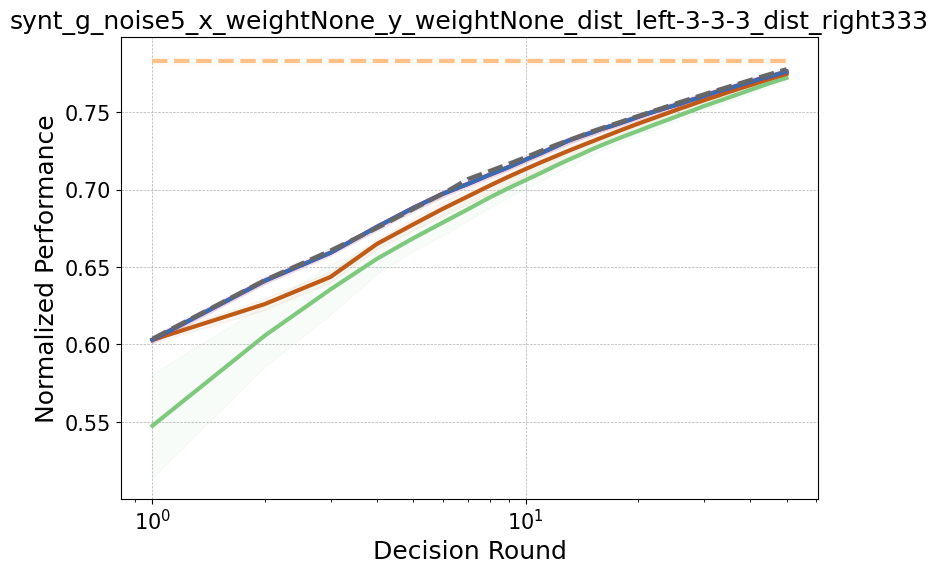

synt_g_noise5_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333


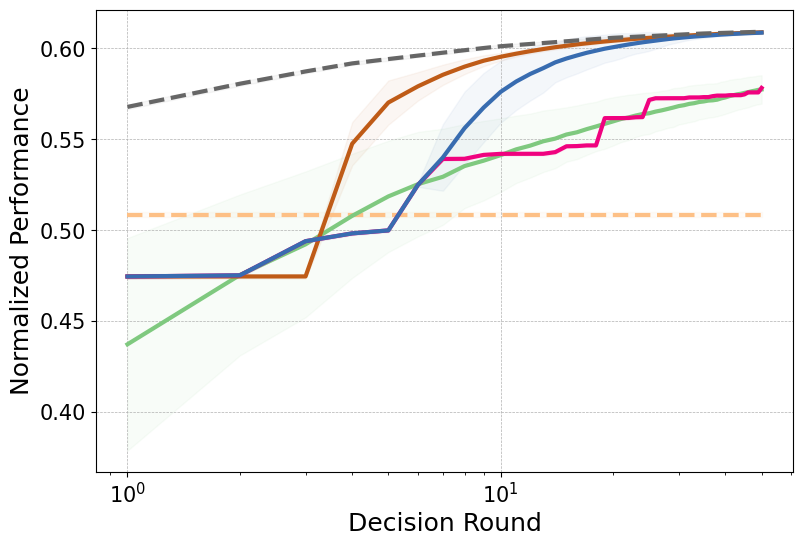

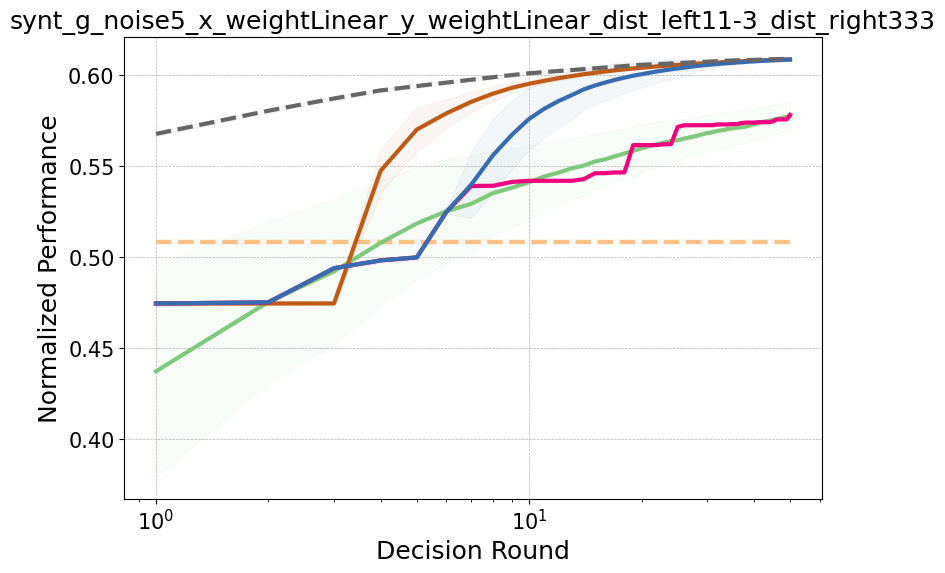

synt_g_noise5_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333


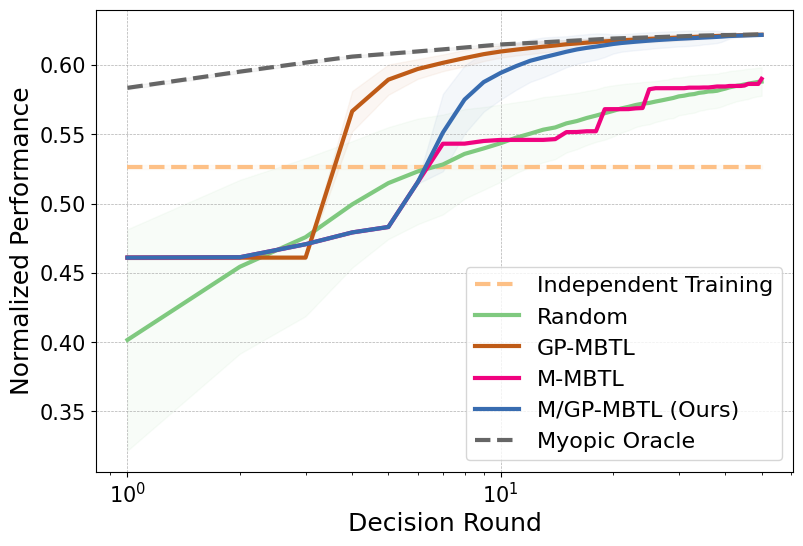

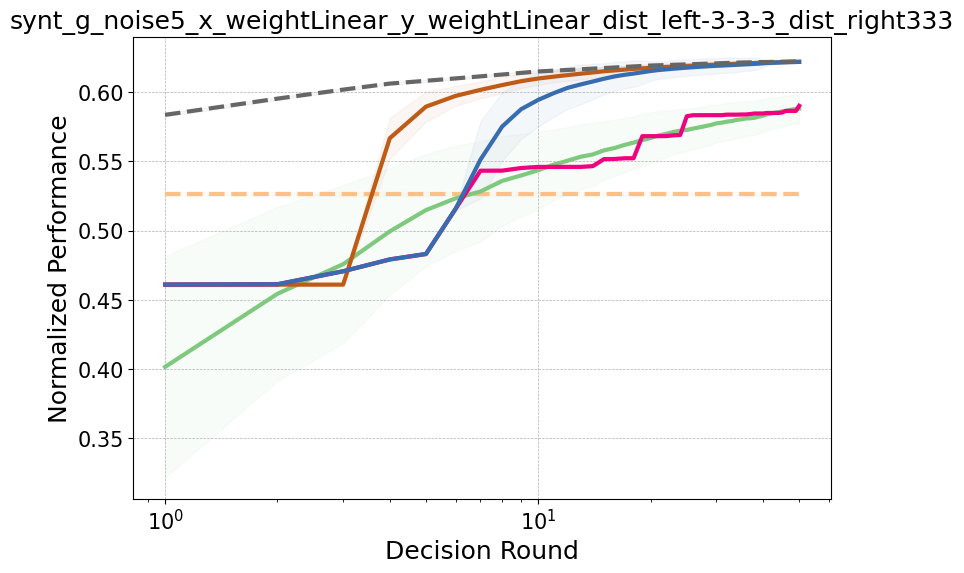

synt_g_noise5_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333


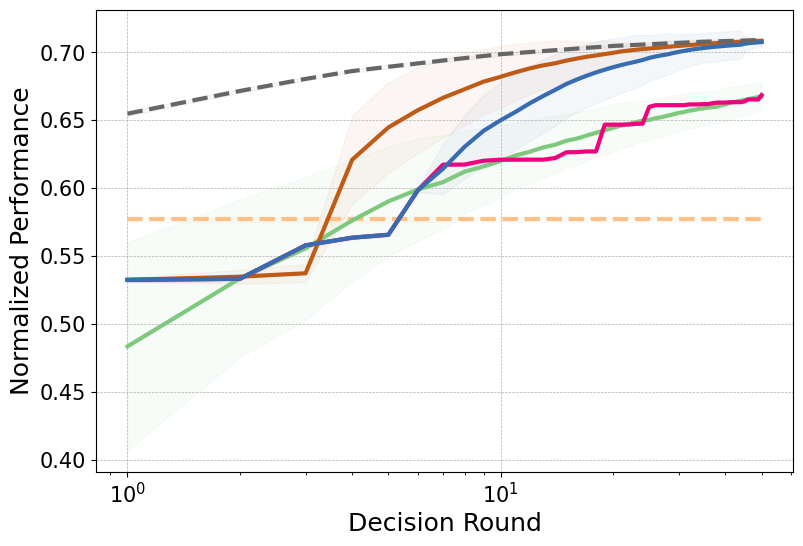

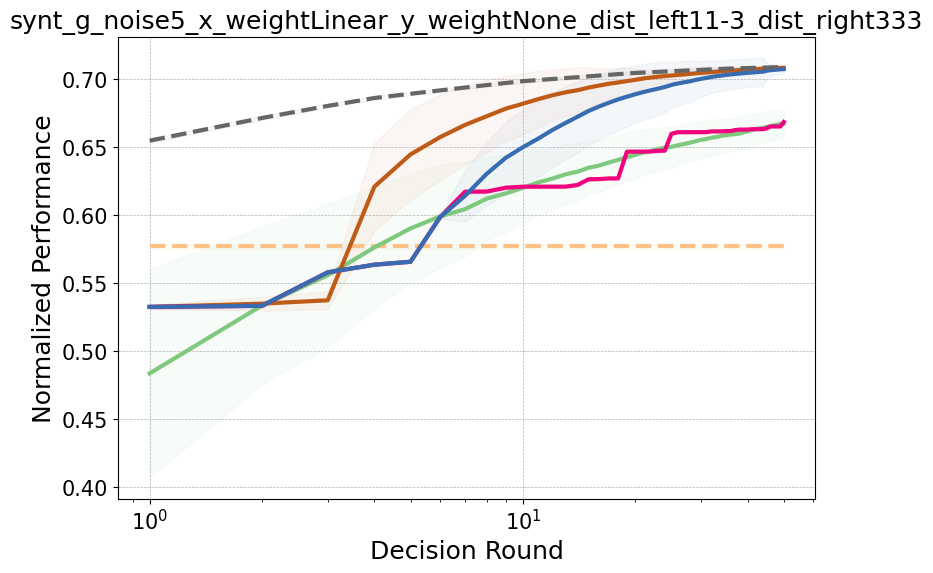

synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333


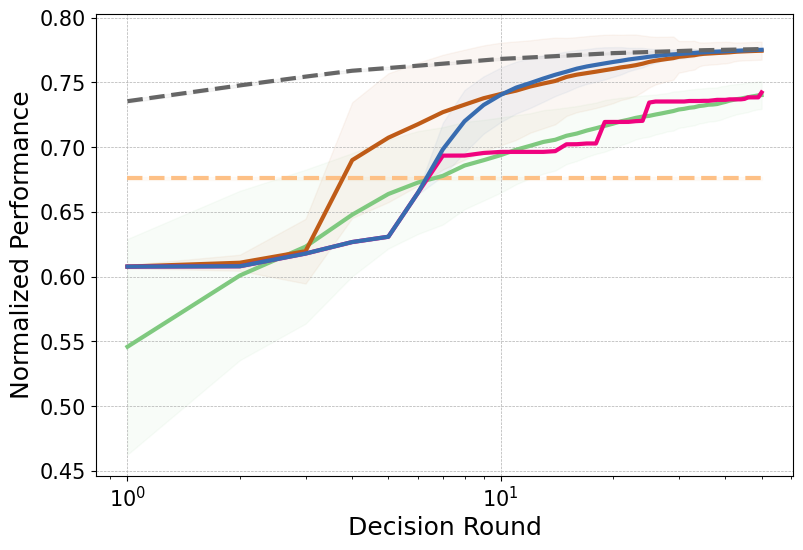

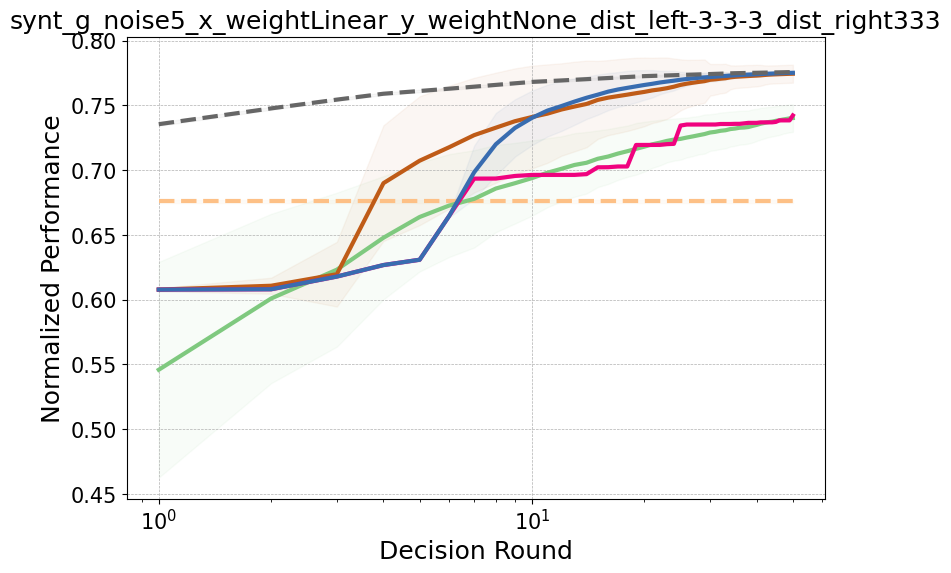

synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333


In [17]:
K=50
data_name = "synt_g"
# x_weight_list=[None, "333"]
# y_weight_list=[None, "333"]
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]

i = 0
for x_weight in x_weight_list:
    for y_weight in y_weight_list:
        for left_weight in dist_left_list:
            min_value = np.inf
            max_value = -np.inf
            name = f"synt_g_noise5_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
            # Assume that we already known the max and min value of the environment
            for trial in range(3):
                matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
                matrix = np.load(matrix_path)
                max_value_trial = np.max(matrix)
                min_value_trial = np.min(matrix)
                max_value = np.maximum(max_value, max_value_trial)
                min_value = np.minimum(min_value, min_value_trial)

            data_path=f"results/{name}_new_{K}_slope=0.01.npz"
            i+=1
            plot_true = True if i==6 else False
            plot_synthetic(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=None, save_name=f"{name}_K{K}", legend=plot_true)
            plot_synthetic(data_path, K, name_plot, y_lim, linestyle, color, log_scale, multi_task_performance=None, plot_title=f"{name}")
            print(name)

## IQM

In [ ]:
name_plot = {
    "SDMBTL": "M/GP-MBTL (Ours)",
    "MMBTL": "M-MBTL",
    "MBTL": "GP-MBTL",
    "random_select": "Random",
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
    # "random_mountain": "M-MBTL + Random",
    # "random_GP": "GP-MBTL + Random",
}
ablation_name_plot = {
    "SDMBTL": "M/GP-MBTL (Ours)",
    "MMBTL": "M-MBTL",
    "MBTL": "GP-MBTL",
    "random_select": "Random",
    "independent_training": "Independent Training", 
    "multi_task": "Multi-task Training",
    "myopic_oracle": "Myopic Oracle",
    # "oracle": "Oracle",
    "random_mountain": "M-MBTL + Random",
    "random_GP": "GP-MBTL + Random",
}
algorithms = ["Myopic Oracle", "M/GP-MBTL (Ours)", "GP-MBTL", "M-MBTL", "Random"]
ablation_algorithms = ["Myopic Oracle", "M/GP-MBTL (Ours)", "GP-MBTL", "M-MBTL", "GP-MBTL + Random", "M-MBTL + Random", "Random"]
# algorithms = ["Stochastic Oracle", "Hybrid-MBTL-mountain (Ours)", "Hybrid-MBTL-new (Ours)", "Hybrid-MBTL (Ours)", "GP-MBTL", "SC-MBTL", "Random"]

In [ ]:

cmap = plt.get_cmap('Accent').colors
color_real = {
    "M/GP-MBTL (Ours)": cmap[4],
    "Random":      cmap[0],
    "M-MBTL": cmap[5],
    "Stochastic Oracle":  cmap[3],
    "GP-MBTL":               cmap[6],
    "Myopic Oracle":      cmap[7],
    "M-MBTL + Random": cmap[5],
    "GP-MBTL + Random": cmap[6],
    "Independent Training": cmap[2],
}
hatches = {
    "M/GP-MBTL (Ours)": "*",
    "Random":      "/",
    "M-MBTL": "+",
    "Stochastic Oracle":  "/",
    "GP-MBTL":               "o",
    "Myopic Oracle":      "/",
    "M-MBTL + Random": "/",
    "GP-MBTL + Random": "/",
    "Independent Training": "/",
}

In [ ]:
aggregate_func = lambda x: np.array([
  metrics.aggregate_median(x),
  metrics.aggregate_iqm(x),
  metrics.aggregate_mean(x)])

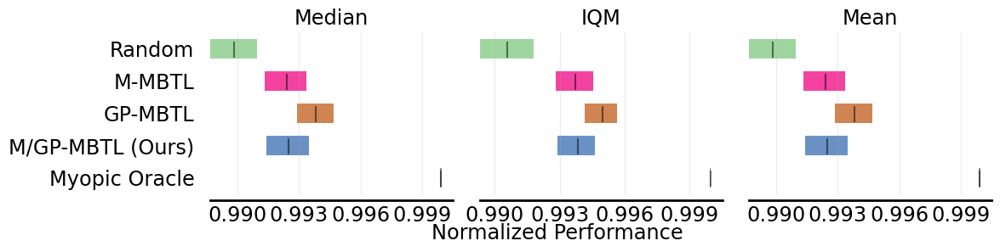

In [41]:
K=100
K=15 # temporal
# K=50 # original
data_path=f"results/cartpole_boot_new_{K}_slope=0.01.npz"
# data_path=f"results/cartpole_boot_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

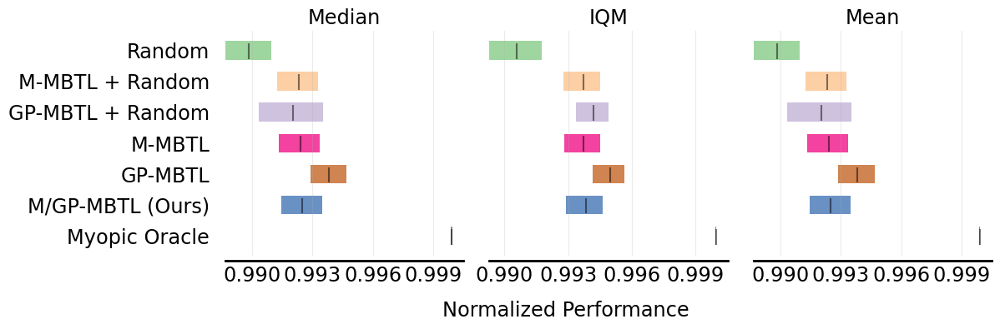

In [42]:
K=100
K=15 # temporal
# K=50 # original
data_path=f"results/cartpole_boot_new_{K}_slope=0.01.npz"
# data_path=f"results/cartpole_boot_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

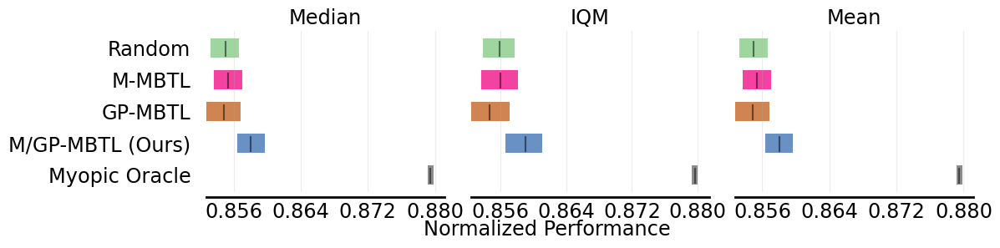

In [43]:
K=15
# K=256
K=50
data_path=f"results/walker_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

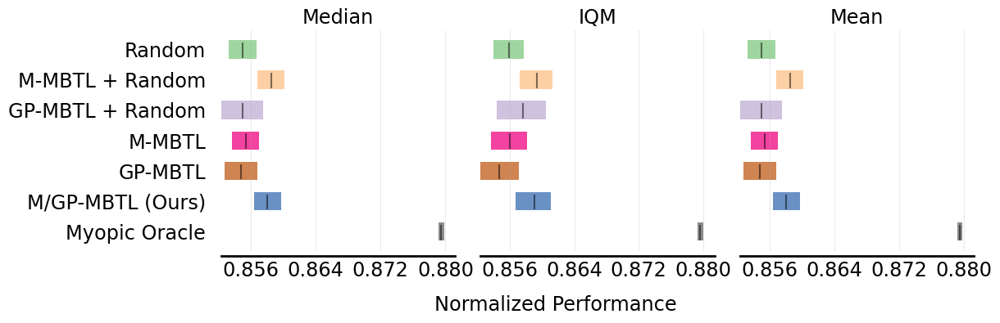

In [44]:
K=15
# K=256
K=50
data_path=f"results/walker_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

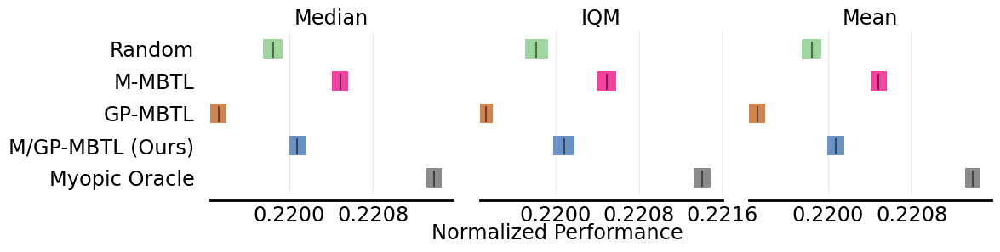

In [45]:
# K=216
K=50
# data_path=f"results/crop_boot_{K}_slope=0.01.npz"
data_path=f"results/crop_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
# alg_list = name_plot.keys() - ["independent_training", "multi_task", "stochastic_oracle"]
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data["stochastic_oracle"]).mean(axis=1)[:, np.newaxis] - np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  max_ticks=3,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

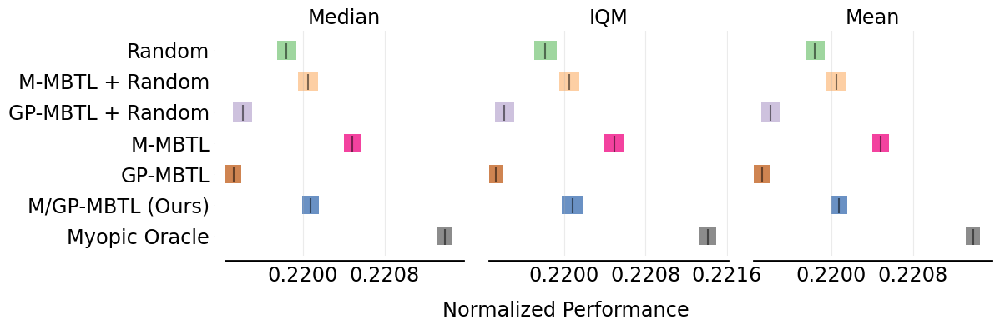

In [46]:
# K=216
K=50
# data_path=f"results/crop_boot_{K}_slope=0.01.npz"
data_path=f"results/crop_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
# alg_list = name_plot.keys() - ["independent_training", "multi_task", "stochastic_oracle"]
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data["stochastic_oracle"]).mean(axis=1)[:, np.newaxis] - np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  max_ticks=3,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

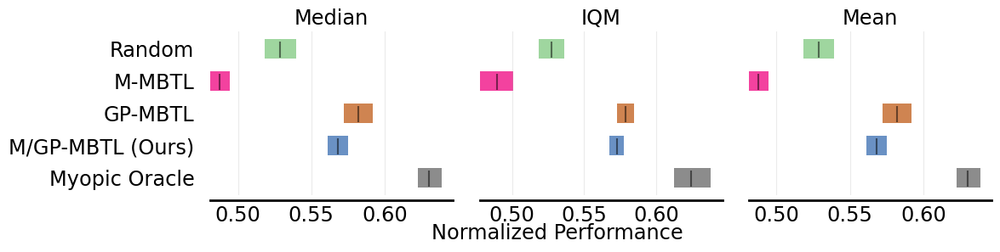

In [48]:
K=50
# K=216
data_path=f"results/intersectionZoo_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

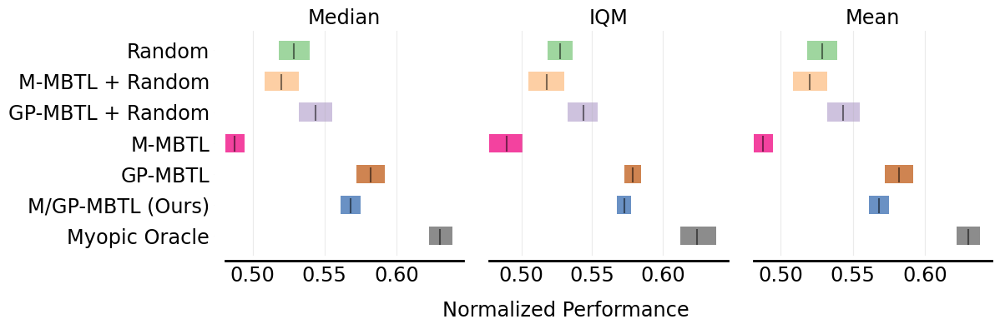

In [49]:
K=50
# K=216
data_path=f"results/intersectionZoo_boot_new_{K}_slope=0.01.npz"
perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
dict_result = {}
alg_list = ablation_name_plot.keys() - ["independent_training", "multi_task"]
for alg_name in alg_list:
    # dict_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)[:, np.newaxis]
    dict_result[ablation_name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1][:, np.newaxis]
aggregate_scores, aggregate_score_cis = rly.get_interval_estimates(
  dict_result, aggregate_func)

fig, axes = plot_utils.plot_interval_estimates(
  aggregate_scores, aggregate_score_cis,
  metric_names=['Median', 'IQM', 'Mean'],
  colors=color_real,
  algorithms=ablation_algorithms,
  row_height=0.5,
  xlabel='Normalized Performance')

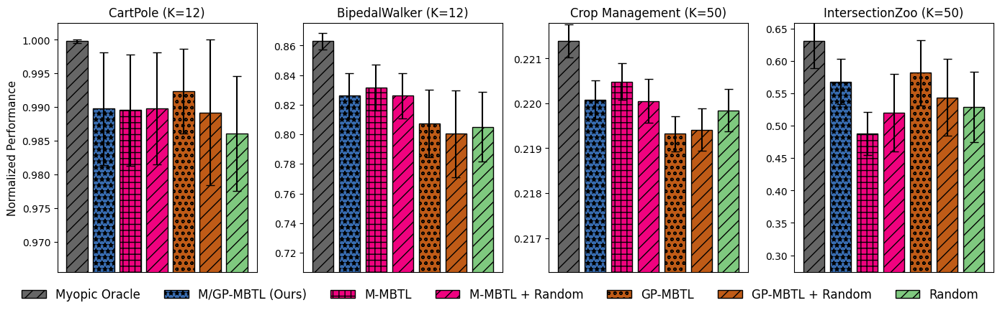

In [ ]:
K = 50
K_list = [15, 50, 50, 50]
real_K_list = [12, 12, 50, 50]
name_list = ["cartpole", "walker", "crop", "intersectionZoo"]
name_dict = {
    "cartpole": "CartPole",
    "walker": "BipedalWalker",
    "crop": "Crop Management",
    "intersectionZoo": "IntersectionZoo",
}

ablation_name_plot = {
    "myopic_oracle": "Myopic Oracle",
    "SDMBTL": "M/GP-MBTL (Ours)",
    "MMBTL": "M-MBTL",
    "random_mountain": "M-MBTL + Random",
    "MBTL": "GP-MBTL",
    "random_GP": "GP-MBTL + Random",
    "random_select": "Random",
}

alg_keys = [k for k in ablation_name_plot if k != "multi_task"]
alg_labels = [ablation_name_plot[k] for k in alg_keys]
n_datasets = len(name_list)
n_algs     = len(alg_labels)

# accumulate means & stds
means = {lab: [] for lab in alg_labels}
stds  = {lab: [] for lab in alg_labels}

for name in name_list:
    K = K_list[name_list.index(name)]
    perf = np.load(f"results/{name}_boot_new_{K}_slope=0.01.npz", allow_pickle=True)["arr_0"].item()
    for k, lab in zip(alg_keys, alg_labels):
        real_K = real_K_list[name_list.index(name)]
        arr = np.array(perf[k])[:, real_K-1]      # final-round accuracies
        means[lab].append(arr.mean())
        stds [lab].append(arr.std())

# plot
x     = np.arange(n_datasets)
width = 0.8 / n_algs   # total group width = 0.8


fig, axs = plt.subplots(1, 4, figsize=(14, 4), sharex=False, sharey=False)

x     = np.arange(n_algs)
width = 0.8

for idx, (name, K) in enumerate(zip(name_list, K_list)):
    real_K = real_K_list[name_list.index(name)]
    ax = axs[idx]
    # plot each algorithm as a single bar (we already have one mean per alg per dataset)
    for i, lab in enumerate(alg_labels):
        m = means[lab][idx]
        s = stds[lab][idx]
        ax.bar(
            i, m,
            yerr=s,
            capsize=4,
            color=color_real[lab],
            hatch=hatches[lab]*2,
            edgecolor='black',
            width=0.8
        )

    # auto‐set y‐limits to zoom around the data
    all_vals = [means[lab][idx] for lab in alg_labels]
    y_min, y_max = min(all_vals), max(all_vals)
    margin = (y_max - y_min) * 0.1
    ax.set_ylim(y_min - margin*15, y_max + margin*2)

    # ax.set_xticks(x)
    # ax.set_xticklabels(alg_labels, rotation=45, ha='right', fontsize=9)
    # remove x-ticks
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_title(f"{name_dict[name]} (K={real_K})", fontsize=12)
    if idx == 0:
        ax.set_ylabel("Normalized Performance", fontsize=11)

# one legend for all
fig.legend(
    alg_labels,
    loc='lower center',
    ncol=min(n_algs, 7),
    frameon=False,
    fontsize=12,
    bbox_to_anchor=(0.5, -0.10)
)

# plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.tight_layout()
plt.savefig("figures/ablation_study.png", dpi=300)
plt.show()



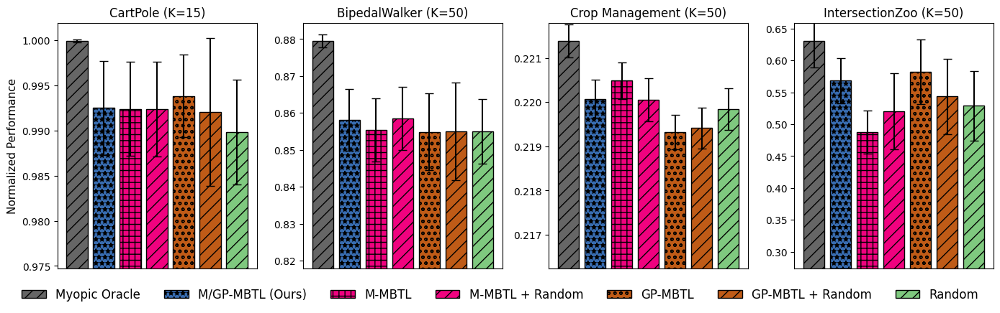

In [ ]:

fig, axs = plt.subplots(1, 4, figsize=(14, 4), sharex=False, sharey=False)

x     = np.arange(n_algs)
width = 0.8

for idx, (name, K) in enumerate(zip(name_list, K_list)):
    ax = axs[idx]
    # plot each algorithm as a single bar (we already have one mean per alg per dataset)
    for i, lab in enumerate(alg_labels):
        m = means[lab][idx]
        s = stds[lab][idx]
        ax.bar(
            i, m,
            yerr=s,
            capsize=4,
            color=color_real[lab],
            hatch=hatches[lab]*2,
            edgecolor='black',
            width=0.8
        )

    # auto‐set y‐limits to zoom around the data
    all_vals = [means[lab][idx] for lab in alg_labels]
    y_min, y_max = min(all_vals), max(all_vals)
    margin = (y_max - y_min) * 0.1
    ax.set_ylim(y_min - margin*15, y_max + margin*2)

    # ax.set_xticks(x)
    # ax.set_xticklabels(alg_labels, rotation=45, ha='right', fontsize=9)
    # remove x-ticks
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_title(f"{name_dict[name]} (K={K})", fontsize=12)
    if idx == 0:
        ax.set_ylabel("Normalized Performance", fontsize=11)

# one legend for all
fig.legend(
    alg_labels,
    loc='lower center',
    ncol=min(n_algs, 7),
    frameon=False,
    fontsize=12,
    bbox_to_anchor=(0.5, -0.10)
)

# plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.tight_layout()
plt.savefig("figures/ablation_separate_y.png", dpi=300)
plt.show()


## Find a good color palette

In [ ]:

# # Use Matplotlib's built-in 'tab10' color palette
# cmap = plt.get_cmap('Paired').colors

# # Map your algorithms to colors from the tab10 palette
# colors = {
#     "Combined_alg_new": cmap[1],
#     "Combined_alg":       cmap[0],
#     "multi_task":         cmap[2],
#     "random_select":      cmap[3],
#     "MMBTL": cmap[5],
#     "independent_training":    cmap[4],
#     "stochastic_oracle":  cmap[8],
#     "MBTL":               cmap[7],
# }

# # Sample data for demonstration
# x = np.linspace(0, 10, 100)
# plt.figure(figsize=(8, 5))
# k=0
# for label, col in colors.items():
#     k+=1
#     y = k * np.sin(x)  # Example data
#     plt.plot(x, y, label=label, color=col, linewidth=2)

# plt.xlabel('X-axis', fontsize=12)
# plt.ylabel('Y-axis', fontsize=12)
# plt.legend()
# plt.tight_layout()
# plt.show()


## Epsilon suboptimality

In [ ]:
# alg_list = ["stochastic_oracle", "random_select", "MBTL", "MMBTL", "Combined_alg", "Combined_alg_new", "SDMBTL"]
# alg_list = ["myopic_oracle", "stochastic_oracle", "random_select", "MBTL", "MMBTL", "SDMBTL", "random_GP", "random_mountain"]
alg_list = ["myopic_oracle", "random_select", "MBTL", "MMBTL", "SDMBTL"]
ablation_alg_list = ["myopic_oracle", "random_select", "MBTL", "MMBTL", "SDMBTL", "random_GP", "random_mountain"]
name_plot = {
    "SDMBTL": "M/GP-MBTL (Ours)",
    "MBTL": "GP-MBTL",
    "MMBTL": "M-MBTL",
    "random_select": "Random",
    # "stochastic_oracle": "Stochastic Oracle",
    "myopic_oracle": "Myopic Oracle",
    "random_mountain": "M-MBTL + Random",
    "random_GP": "GP-MBTL + Random",
}


# Use Matplotlib's built-in 'tab10' color palette
# cmap = plt.get_cmap('Paired').colors
cmap = plt.get_cmap('Accent').colors

# Map your algorithms to colors from the tab10 palette
color = {
    "SDMBTL": cmap[4],
    "multi_task":         cmap[1],
    "random_select":      cmap[0],
    "MMBTL": cmap[5],
    "independent_training":    cmap[2],
    "stochastic_oracle":  cmap[3],
    "MBTL":               cmap[6],
    "myopic_oracle":      cmap[7],
    "random_mountain":    cmap[2],
    "random_GP":         cmap[1],
}

markers = {
    "SDMBTL": "o",
    "random_select":      "s",
    "MMBTL": "D",
    "MBTL":               "^",
    "myopic_oracle":      "v",
    "random_mountain":    "<",
    "random_GP":         ">",
    
}

N_trials = 100

In [21]:
def interquartile_mean(k_list):
    sorted_k = np.sort(np.array(k_list))
    
    n = len(sorted_k)
    q25 = np.percentile(sorted_k, 25)
    q75 = np.percentile(sorted_k, 75)
    
    # Compute the interquartile mean (IQM) as the mean of the middle 50% of values.
    lower_idx = int(np.floor(0.25 * n))
    upper_idx = int(np.ceil(0.75 * n))
    iqm = np.mean(sorted_k[lower_idx:upper_idx])
    
    lower_error = iqm - q25
    upper_error = q75 - iqm
    return iqm, lower_error, upper_error

In [32]:
def plot_suboptimality(name, K, epsilon_list, legend=False, title=False, ylabel=True):
    if "synt" in name:
        data_path = f"results/{name}_new_{K}_slope=0.01.npz"
    else:
        data_path = f"results/{name}_boot_new_{K}_slope=0.01.npz"
    perf_data = np.load(data_path, allow_pickle=True)["arr_0"].item()

    min_value = np.inf
    max_value = -np.inf
    # Assume that we already know the max and min value of the environment
    if "synt" in name:
        N_trials_real = 0
        N_trials_boot = 100
        N_trials_tmp = 100
    else:
        N_trials_real = 3
        N_trials_boot = 100
        N_trials_tmp = 3
    for trial in range(N_trials_tmp):
        if name == "cartpole":
            matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
        elif name == "walker":
            matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
        elif name == "intersectionZoo":
            matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
        elif name == "crop":
            matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
        elif "syn" in name:
            matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
        matrix = np.load(matrix_path)
        max_value_trial = np.max(matrix)
        min_value_trial = np.min(matrix)
        max_value = np.maximum(max_value, max_value_trial)
        min_value = np.minimum(min_value, min_value_trial)

    oracle_transfer = []
    for trial in range(N_trials_real, N_trials_real+N_trials_boot):
        if name == "cartpole":
            matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
        elif name == "walker":
            matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
        elif name == "intersectionZoo":
            matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
        elif name == "crop":
            matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
        elif "syn" in name:
            matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
        matrix = np.load(matrix_path)
        matrix = (matrix - min_value) / (max_value - min_value)
        oracle_transfer.append(np.max(matrix, axis=0).mean())
    oracle_transfer = np.array(oracle_transfer)

    alg_data = {
        alg_name: {"y": [], "x_iqm": [], "x_low": [], "x_high": []}
        for alg_name in alg_list
    }

    plt.figure(figsize=(6, 6))
    for epsilon in epsilon_list:
        k_epsilon = {}

        for alg_name in alg_list:
            result_tmp = np.array(perf_data[alg_name])
            k_list = []
            for trial in range(N_trials):
                k_candidate = np.where(
                    result_tmp[trial] >= (1 - epsilon) * oracle_transfer[trial]
                )[0]
                k = k_candidate[0] if len(k_candidate) > 0 else K
                k_list.append(int(k))
            iqm, lower_error, upper_error = interquartile_mean(k_list)
            k_epsilon[alg_name] = [iqm, lower_error, upper_error]

        # Store the (epsilon, mean_k, std_k) in alg_data
        for i, alg_name in enumerate(alg_list):
            y_val = epsilon # -0.001*(i-len(alg_list)/2)
            x_iqm = k_epsilon[alg_name][0]
            x_low = k_epsilon[alg_name][1]
            x_high = k_epsilon[alg_name][2]

            alg_data[alg_name]["y"].append(y_val)
            alg_data[alg_name]["x_iqm"].append(x_iqm)
            alg_data[alg_name]["x_low"].append(x_low)
            alg_data[alg_name]["x_high"].append(x_high)

    for alg_name in alg_list:
        plt.errorbar(
            alg_data[alg_name]["x_iqm"],     # x-values = mean(K)
            alg_data[alg_name]["y"],         # y-values = epsilon
            xerr=[alg_data[alg_name]["x_low"], alg_data[alg_name]["x_high"]],  # horizontal error bars using low and high values
            fmt='--',
            marker=markers[alg_name],
            linewidth=3,
            alpha=0.8,
            label=name_plot[alg_name],
            color=color[alg_name],
        )

    plt.gca().invert_yaxis()

    plt.xlabel("Decision round", fontsize=18)         # K is now the horizontal axis
    if ylabel:
        plt.ylabel("Suboptimality gap", fontsize=18)   # epsilon is now the vertical axis
    if legend:
        plt.legend(fontsize=18, loc='lower right')
    # axis font size
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    # plt.xscale("log")
    plt.grid(True, linestyle='--', linewidth=0.5)
    # plt.title("BipedalWalker")
    if title:
        plt.title(name)
    plt.savefig(f"figures/epsilon_suboptimal_{name}_K{K}.png", format="png", dpi=300, bbox_inches='tight')

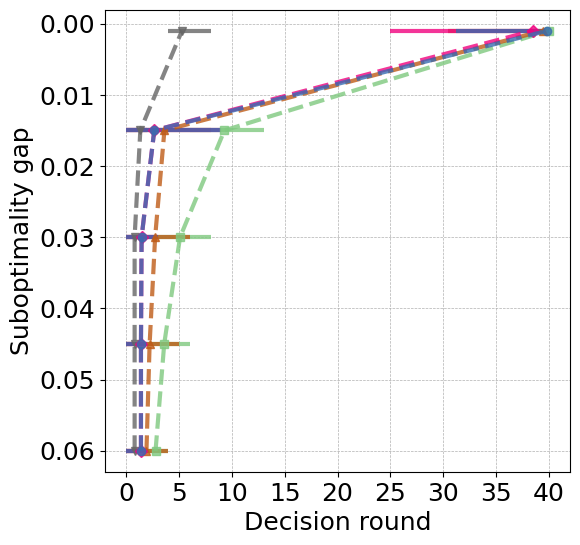

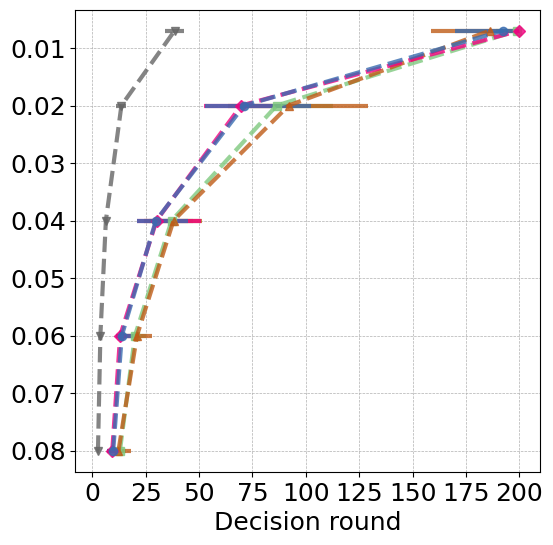

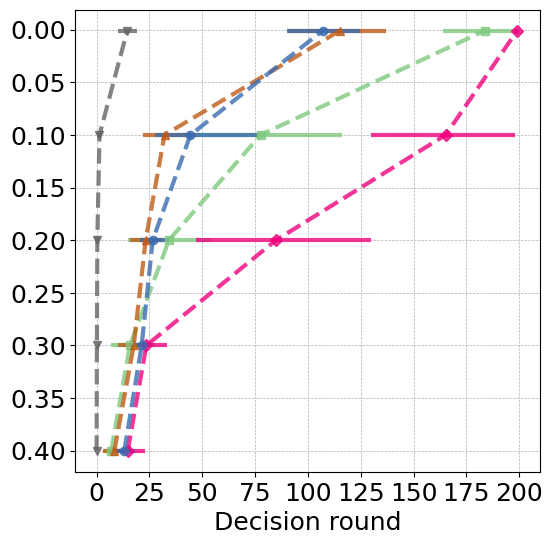

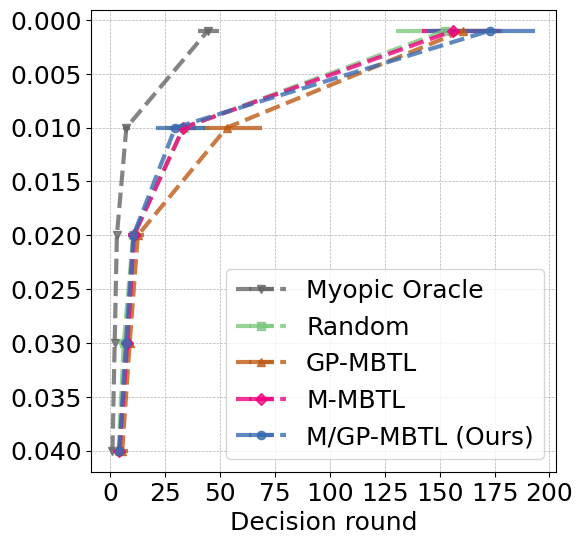

In [33]:
name = "cartpole"
K = 40
epsilon_list = [0.06, 0.045, 0.03, 0.015, 0.001]
plot_suboptimality(name, K, epsilon_list)
name = "walker"
K = 200
epsilon_list = [0.08, 0.06, 0.04, 0.02, 0.007]
plot_suboptimality(name, K, epsilon_list, ylabel=False)
name = "intersectionZoo"
K = 200
epsilon_list = [0.4, 0.3, 0.2, 0.1, 0.001]
plot_suboptimality(name, K, epsilon_list, ylabel=False)
name = "crop"
K = 200
epsilon_list = [0.04, 0.03, 0.02, 0.01, 0.001]
plot_suboptimality(name, K, epsilon_list, legend=True, ylabel=False)

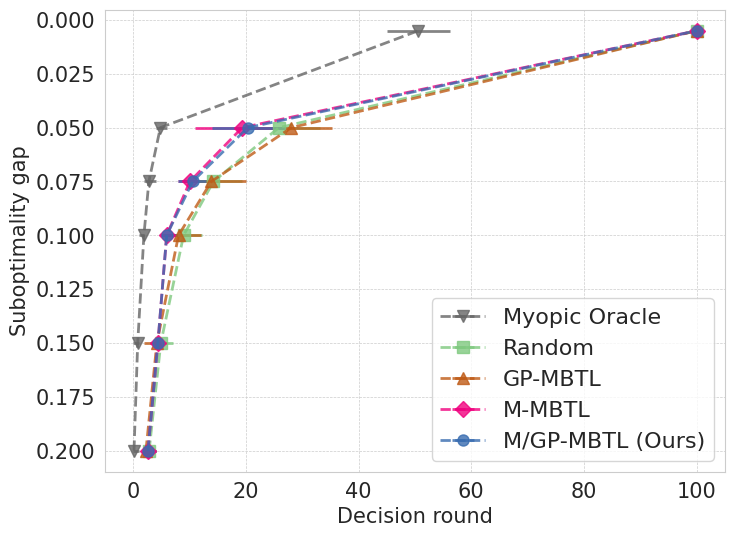

In [ ]:
name = "walker"
K = 100
epsilon_list = [0.2, 0.15, 0.1, 0.075, 0.05, 0.005]

plot_suboptimality(name, K, epsilon_list, legend=True)

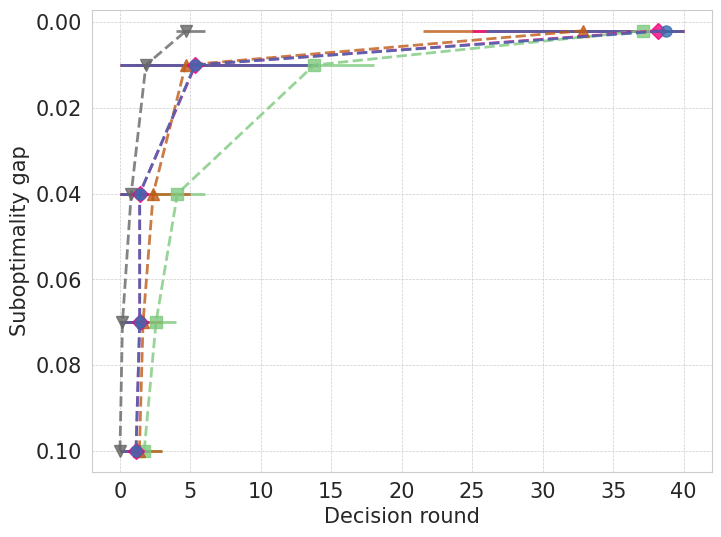

In [ ]:
name = "cartpole"
K = 40
epsilon_list = [0.1, 0.07, 0.04, 0.01, 0.002]

plot_suboptimality(name, K, epsilon_list)

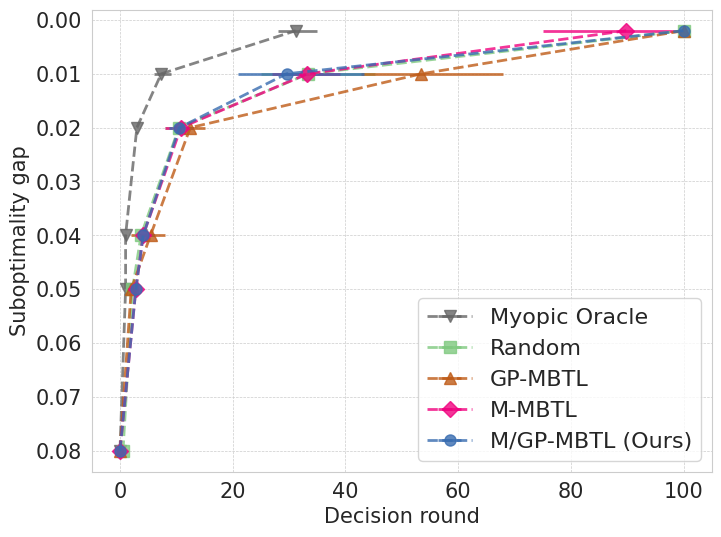

In [ ]:
name = "crop"
K = 100
epsilon_list = [0.08, 0.05, 0.04, 0.02, 0.01, 0.002]
plot_suboptimality(name, K, epsilon_list, legend=True)

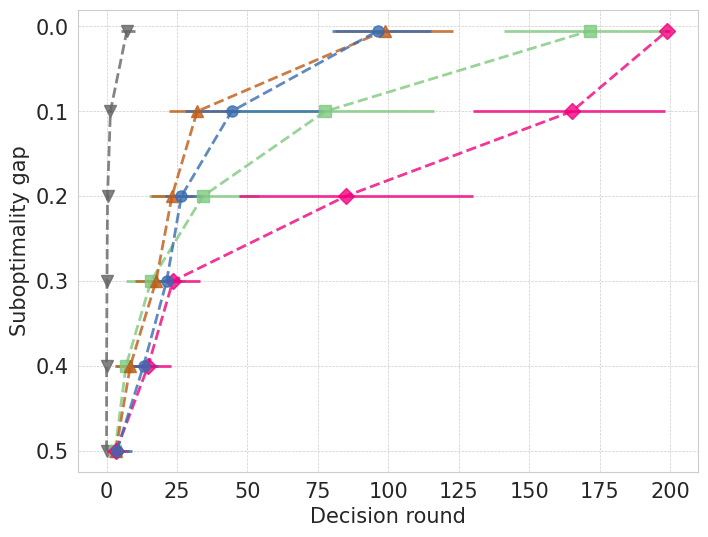

In [ ]:
name = "intersectionZoo"
K = 200
# epsilon_list = [0.5, 0.4, 0.3, 0.25, 0.2, 0.15, 0.1, 0.05, 0.01]
epsilon_list = [0.5, 0.4, 0.3, 0.2, 0.1, 0.005]

plot_suboptimality(name, K, epsilon_list)


In [ ]:
# data_name = "synt_g"
# # x_weight_list=[None, "333"]
# # y_weight_list=[None, "333"]
# x_weight_list=["None", "Linear", "Quadratic"]
# y_weight_list=["Random", "Quadratic", "Linear", "None"]
# dist_left_list=["11-3", "1-3-3", "-3-3-3"]
# for x_weight in x_weight_list:
#     for y_weight in y_weight_list:
#         for left_weight in dist_left_list:
#             name = f"synt_g_noise3_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
#             # if x_weight is None:
#             #     K = 15
#             #     epsilon_list = [0.4, 0.3, 0.2, 0.15, 0.1, 0.05, 0.01]
#             # else:
#             #     K = 30
#             #     epsilon_list = [0.2, 0.15, 0.1, 0.05, 0.01]
#             K = 30
#             epsilon_list = [0.2, 0.15, 0.1, 0.05, 0.01]

#             # data_path = f"results/{name}_boot_{K}_slope=0.01.npz"
#             data_path = f"results/{name}_new_{K}_slope=0.01.npz"
#             try:
#                 perf_data = np.load(data_path, allow_pickle=True)["arr_0"].item()

#                 min_value = np.inf
#                 max_value = -np.inf
#                 # Assume that we already know the max and min value of the environment
#                 for trial in range(3):
#                     if name == "cartpole":
#                         matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
#                     elif name == "walker":
#                         matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
#                     elif name == "intersectionZoo":
#                         matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
#                     elif name == "crop":
#                         matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
#                     elif "syn" in name:
#                         matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
#                     matrix = np.load(matrix_path)
#                     max_value_trial = np.max(matrix)
#                     min_value_trial = np.min(matrix)
#                     max_value = np.maximum(max_value, max_value_trial)
#                     min_value = np.minimum(min_value, min_value_trial)

#                 oracle_transfer = []
#                 for trial in range(100):
#                     if name == "cartpole":
#                         matrix_path = f"data/transfer_reward_matrix_trial{trial}.npy"
#                     elif name == "walker":
#                         matrix_path = f"data/transfer_reward_bipedalwalker_matrix_8_trial{trial}.npy"
#                     elif name == "intersectionZoo":
#                         matrix_path = f"data/transfer_reward_array_intersectionzoo_trial{trial}.npy"
#                     elif name == "crop":
#                         matrix_path = f"data/transfer_reward_matrix_crop_new_trial{trial}.npy"
#                     elif "syn" in name:
#                         matrix_path = f"data/transfer_reward_matrix_{name}_trial{trial}.npy"
#                     matrix = np.load(matrix_path)
#                     matrix = (matrix - min_value) / (max_value - min_value)
#                     oracle_transfer.append(np.max(matrix, axis=0).mean())
#                 oracle_transfer = np.array(oracle_transfer)

#                 alg_data = {
#                     alg_name: {"y": [], "x_iqm": [], "x_low": [], "x_high": []}
#                     for alg_name in alg_list
#                 }

#                 plt.clf()
#                 plt.figure(figsize=(8, 6))
#                 for epsilon in epsilon_list:
#                     k_epsilon = {}

#                     for alg_name in alg_list:
#                         result_tmp = np.array(perf_data[alg_name])
#                         k_list = []
#                         for trial in range(N_trials):
#                             k_candidate = np.where(
#                                 result_tmp[trial] >= (1 - epsilon) * oracle_transfer[trial]
#                             )[0]
#                             k = k_candidate[0] if len(k_candidate) > 0 else K
#                             k_list.append(int(k))
#                         iqm, lower_error, upper_error = interquartile_mean(k_list)
#                         k_epsilon[alg_name] = [iqm, lower_error, upper_error]

#                     # Store the (epsilon, mean_k, std_k) in alg_data
#                     for i, alg_name in enumerate(alg_list):
#                         y_val = epsilon -0.001*(i-len(alg_list)/2)
#                         x_iqm = k_epsilon[alg_name][0]
#                         x_low = k_epsilon[alg_name][1]
#                         x_high = k_epsilon[alg_name][2]

#                         alg_data[alg_name]["y"].append(y_val)
#                         alg_data[alg_name]["x_iqm"].append(x_iqm)
#                         alg_data[alg_name]["x_low"].append(x_low)
#                         alg_data[alg_name]["x_high"].append(x_high)

#                 for alg_name in alg_list:
#                     plt.errorbar(
#                         alg_data[alg_name]["x_iqm"],     # x-values = mean(K)
#                         alg_data[alg_name]["y"],         # y-values = epsilon
#                         xerr=[alg_data[alg_name]["x_low"], alg_data[alg_name]["x_high"]],  # horizontal error bars using low and high values
#                         fmt='o--',
#                         alpha=0.8,
#                         label=name_plot[alg_name],
#                         color=color[alg_name],
#                     )

#                 plt.gca().invert_yaxis()

#                 plt.xlabel("K", fontsize=16)         # K is now the horizontal axis
#                 plt.ylabel("epsilon", fontsize=16)   # epsilon is now the vertical axis
#                 plt.legend()
#                 plt.grid(True, linestyle='--', linewidth=0.5)
#                 plt.title(f"{name}")
#                 plt.savefig(f"figures/epsilon_suboptimal_{name}_K{K}.png", format="png", dpi=300, bbox_inches='tight')
#                 plt.show()
#                 # plt.savefig(f"figures/epsilon_suboptimal_{name}.png", format="png", dpi=300, bbox_inches='tight')
#             except:
#                 print(f"File not found: {data_path}")
#                 continue


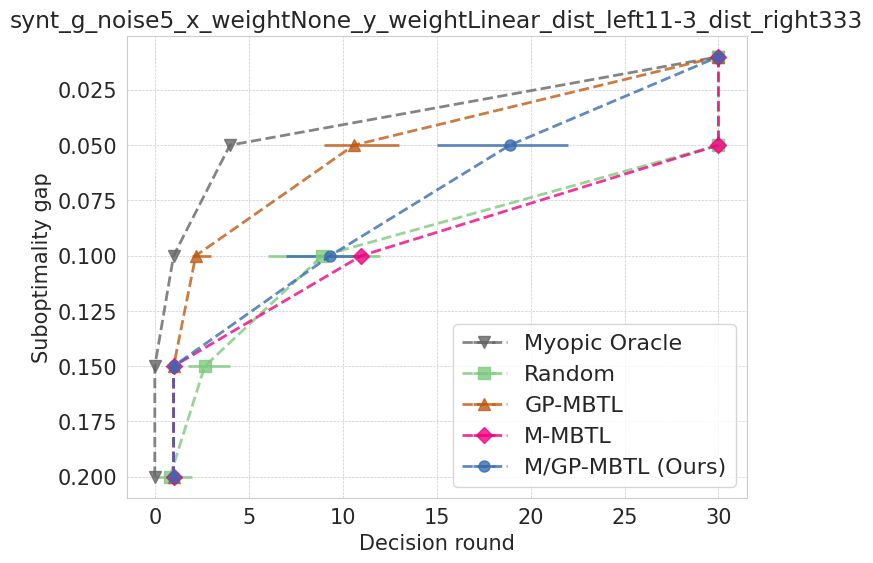

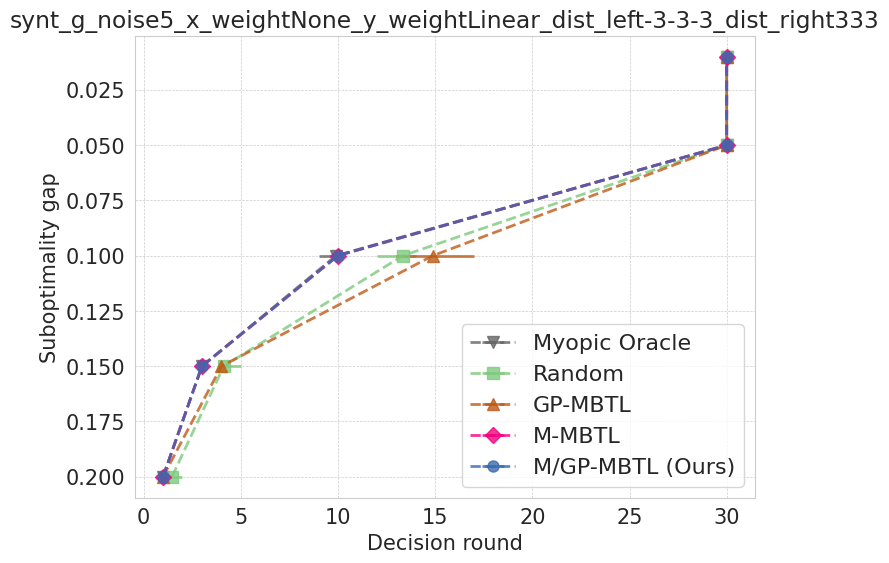

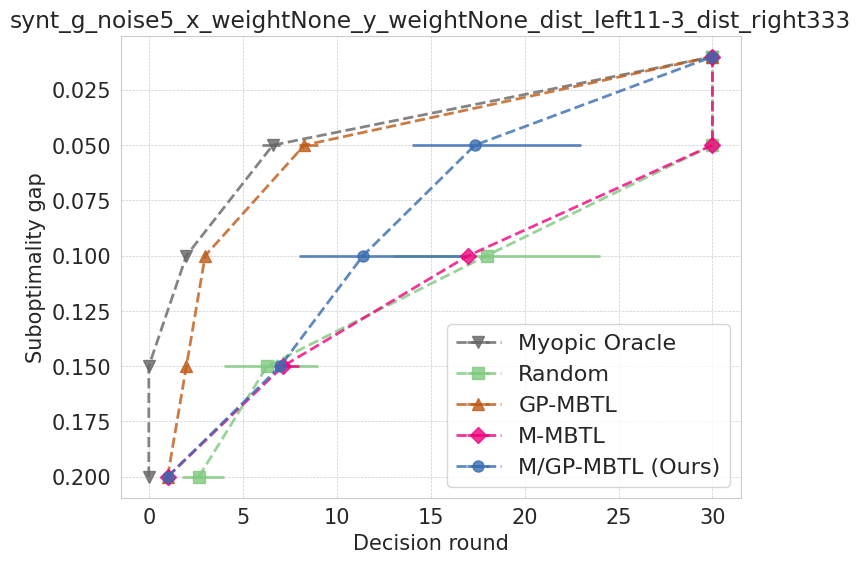

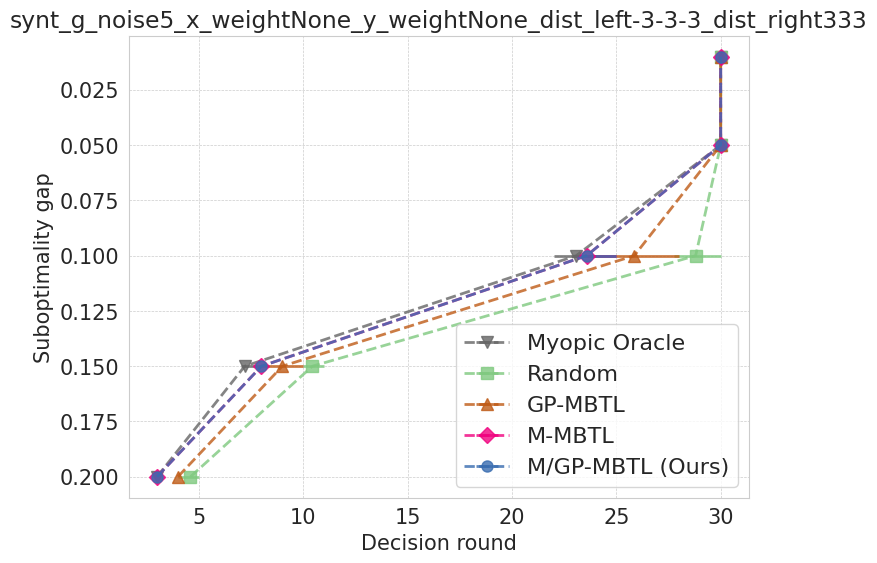

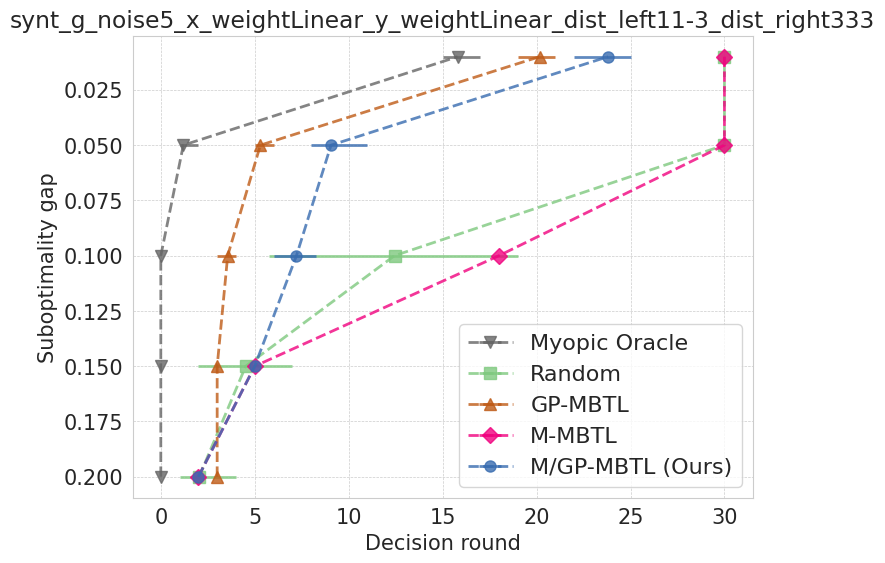

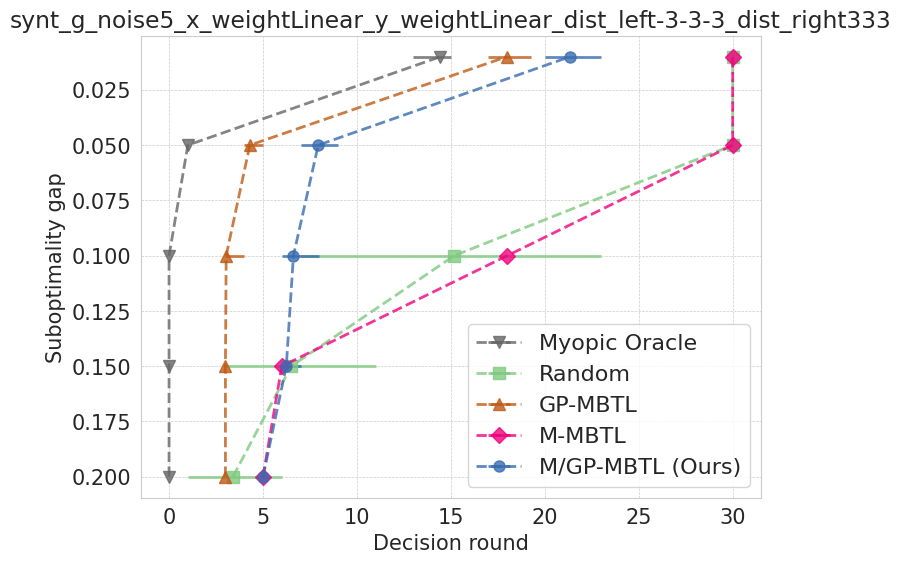

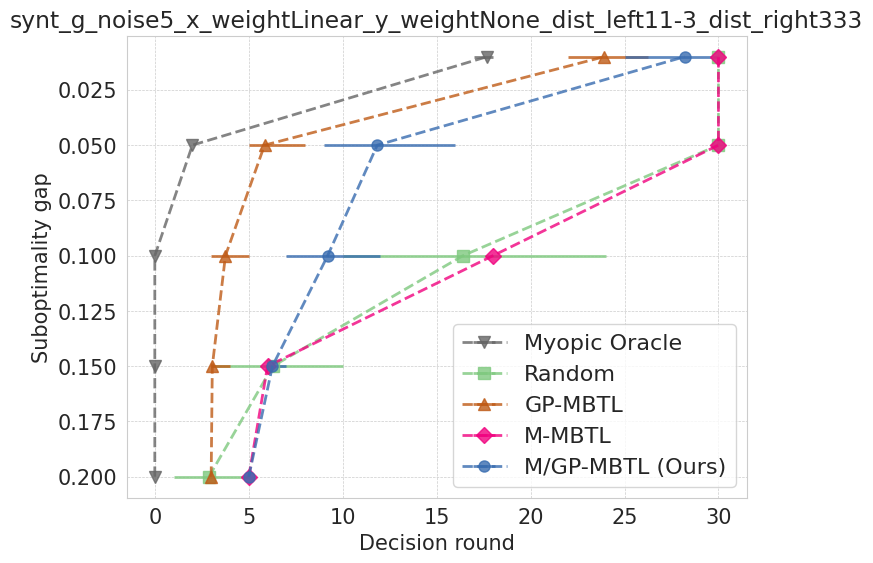

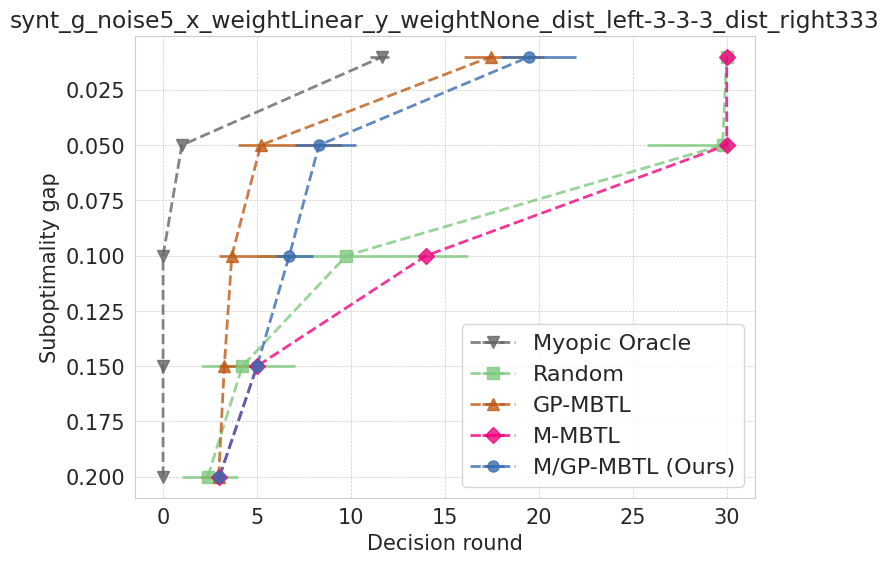

In [ ]:
data_name = "synt_g"
# x_weight_list=[None, "333"]
# y_weight_list=[None, "333"]
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
for x_weight in x_weight_list:
    for y_weight in y_weight_list:
        for left_weight in dist_left_list:
            try:
                name = f"synt_g_noise5_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
                # if x_weight is None:
                #     K = 15
                #     epsilon_list = [0.4, 0.3, 0.2, 0.15, 0.1, 0.05, 0.01]
                # else:
                #     K = 30
                #     epsilon_list = [0.2, 0.15, 0.1, 0.05, 0.01]
                K = 30
                epsilon_list = [0.2, 0.15, 0.1, 0.05, 0.01]

                plot_suboptimality(name, K, epsilon_list, legend=True, title=True)
            except:
                print(f"File not found: {name}")
                continue

## Algorithm Switch

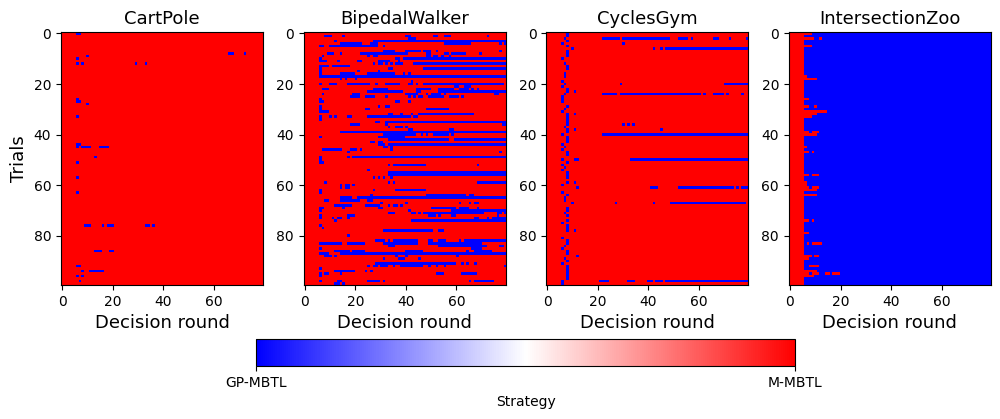

In [34]:
K = 80
name_list = ["cartpole", "walker", "crop", "intersectionZoo"]
name_dict = {
    "cartpole": "CartPole",
    "walker": "BipedalWalker",
    "crop": "CyclesGym",
    "intersectionZoo": "IntersectionZoo",
}
# four subplots
fig, axs = plt.subplots(1, 4, figsize=(12, 7))
for name_idx, name in enumerate(name_list):
    try:
        im = axs[name_idx].imshow(np.load(f"results/{name}_boot_new_algswitch_{K}_slope=0.01.npy").astype(int), cmap='bwr', interpolation='nearest')
        # color bar label 0 to be "No switch", 1 to be "Switch"
        axs[name_idx].set_xlabel('Decision round', fontsize=13)
        if name_idx==0:
            axs[name_idx].set_ylabel('Trials', fontsize=13)
        axs[name_idx].set_title(f"{name_dict[name]}", fontsize=13)
    except:
        print(f"File not found: {name}")
        continue
cbar = fig.colorbar(
    im,                # the mappable we saved
    ax=axs,                 # apply to all subplots
    orientation='horizontal',
    fraction=0.05,          # height of the colorbar as fraction of the figure
    pad=0.1,                # space between the subplots and the colorbar
    ticks=[0, 1],
    label='Strategy'
)
cbar.set_ticklabels(['GP-MBTL', 'M-MBTL'])
# plt.tight_layout()
plt.savefig(f"figures/algswitch_benchmarks_K{K}.png", format="png", dpi=300, bbox_inches='tight')
plt.show()

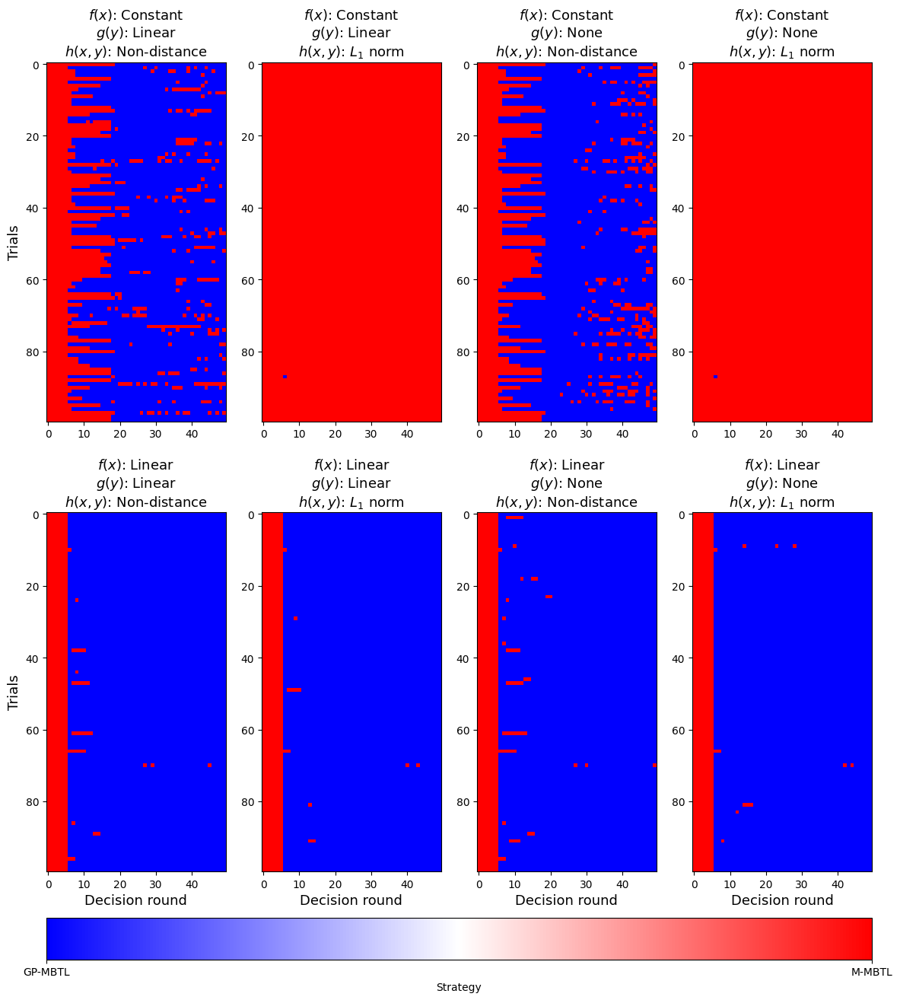

In [130]:
data_name = "synt_g"
# x_weight_list=[None, "333"]
# y_weight_list=[None, "333"]
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
K = 50
name_list = []
realname_list = []
for x_weight in x_weight_list:
    for y_weight in y_weight_list:
        for left_weight in dist_left_list:
            name = f"synt_g_noise5_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333"
            x_val_str = "Constant" if x_weight == "None" else "Linear"
            y_val_str = y_weight
            left_val_str = "Non-distance" if left_weight == "11-3" else "$L_1$ norm"
            name_list.append(name)
            realname_list.append(f"$f(x)$: {x_val_str}\n$g(y)$: {y_val_str}\n$h(x,y)$: {left_val_str}")
fig, axs = plt.subplots(2, 4, figsize=(14, 16))
for name_idx, name in enumerate(name_list):
    try:
        im = axs[name_idx // 4, name_idx % 4].imshow(np.load(f"results/{name}_new_algswitch_{K}_slope=0.01.npy").astype(int), cmap='bwr', interpolation='nearest')
        # color bar label 0 to be "No switch", 1 to be "Switch"
        if name_idx // 4 != 0:
            axs[name_idx // 4, name_idx % 4].set_xlabel('Decision round', fontsize=13)
        if name_idx % 4 == 0:
            axs[name_idx // 4, name_idx % 4].set_ylabel('Trials', fontsize=13)
        axs[name_idx // 4, name_idx % 4].set_title(f"{realname_list[name_idx]}", fontsize=13)
    except:
        print(f"File not found: {name}")
        continue
cbar = fig.colorbar(
    im,                # the mappable we saved
    ax=axs,                 # apply to all subplots
    orientation='horizontal',
    fraction=0.07,          # height of the colorbar as fraction of the figure
    pad=0.05,                # space between the subplots and the colorbar
    ticks=[0, 1],
    label='Strategy'
)
cbar.set_ticklabels(['GP-MBTL', 'M-MBTL'])
# supertitle
# plt.suptitle(f"Switching strategy for synthetic data with K={K}", fontsize=20)
plt.savefig(f"figures/algswitch_synthetic_K{K}.png", format="png", dpi=300, bbox_inches='tight')
# plt.tight_layout()
plt.show()

## Plotting the impact of bootstrapped data

In [ ]:
K = 50
name_list = ["cartpole", "walker", "crop", "intersectionZoo"]
name_dict = {
    "cartpole": "CartPole",
    "walker": "BipedalWalker",
    "crop": "CyclesGym",
    "intersectionZoo": "IntersectionZoo",
}

In [ ]:
# four subplots
fig, axs = plt.subplots(1, 4, figsize=(12, 5))
for name_idx, name in enumerate(name_list):
    data_path = f"results/{name}_boot_new_{K}_slope=0.01.npz"
    perf_data = np.load(data_path, allow_pickle=True)["arr_0"].item()

    real_data = [perf_data["Combined_alg_mountain"][idx][-1] for idx in range(3)]
    boot_data = [perf_data["Combined_alg_mountain"][idx][-1] for idx in range(3, 100)]

    min_value = min(np.min(real_data), np.min(boot_data))
    max_value = max(np.max(real_data), np.max(boot_data))
    bins = np.linspace(min_value, max_value, 20)
    
    axs[name_idx].hist(boot_data, bins=bins, alpha=0.5, color='red', label='Bootstrapped data')
    axs[name_idx].hist(real_data, bins=bins, alpha=0.5, color='blue', label='Real data')
    if name_idx == 0:
        axs[name_idx].set_ylabel('Frequency')
        axs[name_idx].legend(loc='upper left')
    axs[name_idx].set_title(f"{name_dict[name]}", fontsize=13)
fig.supxlabel("M/GP-MBTL performance", fontsize=14)
plt.show()


## Tables

In [ ]:
aggregate_results = pd.DataFrame()
name_plot["independent_training"]="Independent Training"
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    if name in ["cartpole", "walker"]:
        K=15
    elif name in ["intersectionZoo"]:
        K=50
    elif name in ["crop"]:
        K=30
    data_path=f"results/{name}_boot_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task']:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
Random,0.989833,0.005813,0.815900,0.021342,0.219141,0.000562,0.528751,0.054688
GP-MBTL,0.993828,0.004619,0.816357,0.020128,0.218627,0.000489,0.581931,0.050812
M-MBTL + Random,0.992329,0.005279,0.831128,0.014563,0.219168,0.000777,0.520154,0.059979
Independent Training,0.934571,0.001630,0.779415,0.005477,0.213313,0.000786,0.204492,0.003988
M/GP-MBTL (Ours),0.992503,0.005216,0.832280,0.014204,0.219318,0.000540,0.568208,0.035309
GP-MBTL + Random,0.992038,0.008218,0.811532,0.028137,0.218634,0.000850,0.543526,0.059625
Myopic Oracle,0.999908,0.000139,0.866876,0.004002,0.221067,0.000382,0.630541,0.041931
M-MBTL,0.992396,0.005209,0.833270,0.015020,0.219150,0.000574,0.487768,0.033782


In [ ]:
# add multitask performance row to the bottom of the table
aggregate_results.loc['Multi-task', 'cartpole_mean'] = np.mean(multi_task_performance_cartpole[-1])
aggregate_results.loc['Multi-task', 'walker_mean'] = np.mean(multi_task_performance_walker[-1])
aggregate_results.loc['Multi-task', 'crop_mean'] = np.mean(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'intersectionZoo_mean'] = np.mean(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'cartpole_std'] = np.std(multi_task_performance_cartpole[-1])
aggregate_results.loc['Multi-task', 'walker_std'] = np.std(multi_task_performance_walker[-1])
aggregate_results.loc['Multi-task', 'crop_std'] = np.std(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'intersectionZoo_std'] = np.std(multi_task_performance_intersectionzoo)
aggregate_results


,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
Random,0.989833,0.005813,0.815900,0.021342,0.219141,0.000562,0.528751,0.054688
GP-MBTL,0.993828,0.004619,0.816357,0.020128,0.218627,0.000489,0.581931,0.050812
M-MBTL + Random,0.992329,0.005279,0.831128,0.014563,0.219168,0.000777,0.520154,0.059979
Independent Training,0.934571,0.001630,0.779415,0.005477,0.213313,0.000786,0.204492,0.003988
M/GP-MBTL (Ours),0.992503,0.005216,0.832280,0.014204,0.219318,0.000540,0.568208,0.035309
GP-MBTL + Random,0.992038,0.008218,0.811532,0.028137,0.218634,0.000850,0.543526,0.059625
Myopic Oracle,0.999908,0.000139,0.866876,0.004002,0.221067,0.000382,0.630541,0.041931
M-MBTL,0.992396,0.005209,0.833270,0.015020,0.219150,0.000574,0.487768,0.033782
Multi-task,0.999232,0.001077,0.652606,0.022776,0.208063,0.000202,0.378822,0.087337


In [ ]:
#------------------------------------------------------------------------------
# STEP 1. LOAD THE DATAFRAME
#------------------------------------------------------------------------------
df = aggregate_results.copy()

domain_context_columns = {
    "Continuous Control": {"CartPole", "BipedalWalker"},
    "Real-World CMDP": {"Crop Management", "IntersectionZoo"}
}

# Map the context names in domain_context_columns to the actual
# mean/std columns in your dataframe
context_to_columns = {
    "CartPole": ("cartpole_mean", "cartpole_std"),
    "BipedalWalker": ("walker_mean", "walker_std"),
    "Crop Management": ("crop_mean", "crop_std"),
    "IntersectionZoo": ("intersectionZoo_mean", "intersectionZoo_std")
}

context_to_k = {
    "CartPole": 15,
    "BipedalWalker": 15,
    "Crop Management": 30,
    "IntersectionZoo": 50}

#------------------------------------------------------------------------------
# STEP 2. MAP THE DATAFRAME’S ROW LABELS TO SHORTER METHOD NAMES
#------------------------------------------------------------------------------

method_name_map = {
    # Actual row label in df : Desired short name in LaTeX table
    "Independent Training": "Independent",
    "Multi-task":           "Multi-task",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL":              "M-MBTL",
    "M/GP-MBTL (Ours)":   "M/GP-MBTL (Ours)",  # updated to reflect method name change
    # "Stochastic Oracle":     "Stochastic Oracle"   # 'Stochastic Oracle' not used in the table
    "Myopic Oracle":     "Myopic Oracle",
}
# The order in which we want the columns (methods) in the final LaTeX table:
latex_method_order = [
    "Independent",
    "Multi-task",
    "Random",
    "GP-MBTL",
    "M-MBTL",  # updated from SC-MBTL to M-MBTL
    "M/GP-MBTL (Ours)",  # added M/GP-MBTL to the method order
    "Myopic Oracle"
]

def get_mean_std(row_label, context_name):
    """Return (mean, std) for the given row and context."""
    mean_col, std_col = context_to_columns[context_name]
    return df.loc[row_label, mean_col], df.loc[row_label, std_col]


#------------------------------------------------------------------------------
# STEP 4. BUILD THE LATEX TABLE ROWS WITH BOLDING
#------------------------------------------------------------------------------

latex_lines = []

table_header = r"""\begin{table}[!ht]
  \caption{Performance comparison of different methods on CMDP benchmarks}
  \label{tab:performance}
  \Large
  \resizebox{0.999\textwidth}{!}{
  \begin{tabular}{ccccccccc}
    \toprule
    \multicolumn{1}{c}{\textbf{Benchmark (CMDP)}} & \multicolumn{1}{c}{\textbf{Independent}} & \multicolumn{1}{c}{\textbf{Multi-task}} & \multicolumn{1}{c}{\textbf{Random}} & \multicolumn{1}{c}{\textbf{GP-MBTL}} & \multicolumn{1}{c}{\textbf{M-MBTL}} & \multicolumn{1}{c}{\textbf{M/GP-MBTL}} & \multicolumn{1}{c}{\textbf{Myopic Oracle}}\\
    \midrule
"""

table_footer = r"""    \end{tabular}}
    \scriptsize{* \textit{Note}: Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle. Standard deviation across multiple runs in the parenthesis.\\}
\end{table}
"""

latex_lines.append(table_header)

def is_not_significantly_lower(mean1, std1, mean_best, std_best, alpha=1.0):
    """
    Returns True if `mean1` is NOT significantly lower than `mean_best`
    by a naive overlap check:
       (mean_best - mean1) <= alpha*(std_best + std1).
    """
    diff = mean_best - mean1
    margin = alpha * (std_best + std1)
    return (diff <= margin)

# Iterate over domains/contexts
for domain_name, context_set in domain_context_columns.items():
    for context_variation in context_set:
        # Collect (method, mean, std) for all methods in this row
        row_data = {}
        for meth in latex_method_order:
            # Find which row-label in df corresponds to this short method name
            row_label = None
            for df_label, short_name in method_name_map.items():
                if short_name == meth:
                    row_label = df_label
                    break

            if row_label is not None and row_label in df.index:
                mean_val, std_val = get_mean_std(row_label, context_variation)
                row_data[meth] = (mean_val, std_val)
            else:
                # If not found in the df, put None
                row_data[meth] = (None, None)

        # Identify best method (exclude "Stochastic Oracle" if you want to skip oracle in bolding)
        best_method = None
        best_mean = float("-inf")
        best_std = 0.0

        for m in row_data:
            if m == "Myopic Oracle":  # skip oracle
                continue
            mean_val, std_val = row_data[m]
            if mean_val is not None and mean_val > best_mean:
                best_mean = mean_val
                best_std = std_val
                best_method = m

        # Decide which means to bold
        bold_flags = {}
        for m in row_data:
            mean_val, std_val = row_data[m]
            if mean_val is None:
                bold_flags[m] = False
            else:
                # If no numeric best_mean, no bold
                if best_mean == float("-inf"):
                    bold_flags[m] = False
                else:
                    if m == best_method:
                        bold_flags[m] = True
                    elif m == "Myopic Oracle":
                        bold_flags[m] = False
                    else:
                        bold_flags[m] = is_not_significantly_lower(
                            mean_val, std_val, best_mean, best_std, alpha=0.5
                        )

        # Construct the LaTeX row
        # row_prefix = f"    \\textbf{{{domain_name}}} & {context_variation}"
        # row_prefix = f"    \\textbf{{{context_variation}}}"
        row_prefix = (r"\begin{tabular}[c]{@{}c@{}}"
                        r"\textbf{{" + context_variation + r"}}\\"
                        "($K=" + str(context_to_k[context_variation]) + "$)" + r"\end{tabular}")
        row_cells = []
        for meth in latex_method_order:
            mean_val, std_val = row_data[meth]
            if mean_val is None:
                cell_str = r"\texttt{-}"
            else:
                mean_str = f"{mean_val:.4f}"
                std_str  = f"{std_val:.4f}"
                if bold_flags[meth]:
                    cell_str = (r"\begin{tabular}[c]{@{}c@{}}"
                                r"\textbf{" + mean_str + "}" + r"\\"
                                "(" + std_str + ")" + r"\end{tabular}")
                else:
                    cell_str = (r"\begin{tabular}[c]{@{}c@{}}"
                                + mean_str + r"\\"
                                "(" + std_str + ")" + r"\end{tabular}")
            row_cells.append(cell_str)

        row_str = row_prefix + " & " + " & ".join(row_cells) + r" \\"
        latex_lines.append(row_str)

    # after finishing each domain, place a midrule
    latex_lines.append(r"    \bottomrule")

latex_lines.append(table_footer)


#------------------------------------------------------------------------------
# STEP 4. WRITE TO A .TEX FILE (OR PRINT OUT)
#------------------------------------------------------------------------------
output_tex = "performance_table_with_bolding.tex"
with open(output_tex, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex}")

LaTeX table written to performance_table_with_bolding.tex


### Aggregated Performance

In [ ]:
df = aggregate_results
random_means = df.loc['Random']
oracle_means = df.loc['Myopic Oracle']
normalized_df = (df - random_means) / (oracle_means - random_means)

algs = ["M-MBTL (Ours)",
        "Independent Training",
        "M/GP-MBTL (Ours)",
        "GP-MBTL",
        "Multi-task"]

benchmarks = ["cartpole", "walker", "crop", "intersectionZoo"]

data = {
    alg: np.mean([normalized_df[f"{bm}_mean"][alg] for bm in benchmarks])
    for alg in algs
}

aggregated_metric = pd.DataFrame([data], index=["Aggregated Performance"])
aggregated_metric

### AUC Performance

In [253]:
aggregate_results = pd.DataFrame()
name_plot["independent_training"]="Independent Training"
for name in ["cartpole", "walker", "crop", "intersectionZoo"]:
    if name in ["cartpole", "walker"]:
        K=15
    elif name in ["intersectionZoo"]:
        K=50
    elif name in ["crop"]:
        K=50
    data_path=f"results/{name}_boot_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task']:
        # df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name]).mean(axis=1)
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
Random,0.950243,0.024020,0.748188,0.031250,0.217004,0.001526,0.457991,0.054794
GP-MBTL,0.954321,0.034947,0.773471,0.022810,0.217178,0.000472,0.482399,0.048290
M-MBTL + Random,0.961256,0.028397,0.778805,0.009905,0.217661,0.000611,0.441300,0.046616
Independent Training,0.934571,0.001630,0.779415,0.005477,0.213313,0.000786,0.204492,0.003988
M/GP-MBTL (Ours),0.961238,0.028383,0.778792,0.009742,0.217827,0.000441,0.462576,0.034306
GP-MBTL + Random,0.951361,0.039265,0.765523,0.027327,0.217362,0.000735,0.455817,0.046528
Myopic Oracle,0.993924,0.002798,0.838313,0.007805,0.220185,0.000382,0.623752,0.043856
M-MBTL,0.961179,0.028369,0.779984,0.010113,0.217727,0.000521,0.418337,0.020797


In [255]:
# add multitask performance row to the bottom of the table
aggregate_results.loc['Multi-task', 'cartpole_mean'] = np.mean(multi_task_performance_cartpole.mean(axis=0))
aggregate_results.loc['Multi-task', 'walker_mean'] = np.mean(multi_task_performance_walker.mean(axis=0))
# aggregate_results.loc['Multi-task', 'cartpole_mean'] = np.mean(multi_task_performance_cartpole[-1])
# aggregate_results.loc['Multi-task', 'walker_mean'] = np.mean(multi_task_performance_walker[-1])
aggregate_results.loc['Multi-task', 'crop_mean'] = np.mean(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'intersectionZoo_mean'] = np.mean(multi_task_performance_intersectionzoo)
aggregate_results.loc['Multi-task', 'cartpole_std'] = np.std(multi_task_performance_cartpole.mean(axis=0))
aggregate_results.loc['Multi-task', 'walker_std'] = np.std(multi_task_performance_walker.mean(axis=0))
# aggregate_results.loc['Multi-task', 'cartpole_std'] = np.std(multi_task_performance_cartpole[-1])
# aggregate_results.loc['Multi-task', 'walker_std'] = np.std(multi_task_performance_walker[-1])
aggregate_results.loc['Multi-task', 'crop_std'] = np.std(multi_task_performance_crop)
aggregate_results.loc['Multi-task', 'intersectionZoo_std'] = np.std(multi_task_performance_intersectionzoo)
aggregate_results


,cartpole_mean,cartpole_std,walker_mean,walker_std,crop_mean,crop_std,intersectionZoo_mean,intersectionZoo_std
Random,0.950243,0.024020,0.748188,0.031250,0.217004,0.001526,0.457991,0.054794
GP-MBTL,0.954321,0.034947,0.773471,0.022810,0.217178,0.000472,0.482399,0.048290
M-MBTL + Random,0.961256,0.028397,0.778805,0.009905,0.217661,0.000611,0.441300,0.046616
Independent Training,0.934571,0.001630,0.779415,0.005477,0.213313,0.000786,0.204492,0.003988
M/GP-MBTL (Ours),0.961238,0.028383,0.778792,0.009742,0.217827,0.000441,0.462576,0.034306
GP-MBTL + Random,0.951361,0.039265,0.765523,0.027327,0.217362,0.000735,0.455817,0.046528
Myopic Oracle,0.993924,0.002798,0.838313,0.007805,0.220185,0.000382,0.623752,0.043856
M-MBTL,0.961179,0.028369,0.779984,0.010113,0.217727,0.000521,0.418337,0.020797
Multi-task,0.983753,0.012166,0.649320,0.022338,0.208063,0.000202,0.378822,0.087337


In [256]:
#------------------------------------------------------------------------------
# STEP 1. LOAD THE DATAFRAME
#------------------------------------------------------------------------------
df = aggregate_results.copy()

domain_context_columns = {
    "Continuous Control": {"CartPole", "BipedalWalker"},
    "Real-World CMDP": {"Crop Management", "IntersectionZoo"}
}

# Map the context names in domain_context_columns to the actual
# mean/std columns in your dataframe
context_to_columns = {
    "CartPole": ("cartpole_mean", "cartpole_std"),
    "BipedalWalker": ("walker_mean", "walker_std"),
    "Crop Management": ("crop_mean", "crop_std"),
    "IntersectionZoo": ("intersectionZoo_mean", "intersectionZoo_std")
}

context_to_k = {
    "CartPole": 15,
    "BipedalWalker": 15,
    "Crop Management": 50,
    "IntersectionZoo": 50}

#------------------------------------------------------------------------------
# STEP 2. MAP THE DATAFRAME’S ROW LABELS TO SHORTER METHOD NAMES
#------------------------------------------------------------------------------

method_name_map = {
    # Actual row label in df : Desired short name in LaTeX table
    "Independent Training": "Independent",
    "Multi-task":           "Multi-task",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL":              "M-MBTL",
    "M/GP-MBTL (Ours)":   "M/GP-MBTL (Ours)",  # updated to reflect method name change
    "Myopic Oracle":     "Myopic Oracle"   # 'Oracle' column in the table
}
# The order in which we want the columns (methods) in the final LaTeX table:
latex_method_order = [
    "Independent",
    "Multi-task",
    "Random",
    "GP-MBTL",
    "M-MBTL",  # updated from SC-MBTL to M-MBTL
    "M/GP-MBTL (Ours)",  # added M/GP-MBTL to the method order
    "Myopic Oracle"
]

def get_mean_std(row_label, context_name):
    """Return (mean, std) for the given row and context."""
    mean_col, std_col = context_to_columns[context_name]
    return df.loc[row_label, mean_col], df.loc[row_label, std_col]


#------------------------------------------------------------------------------
# STEP 4. BUILD THE LATEX TABLE ROWS WITH BOLDING
#------------------------------------------------------------------------------

latex_lines = []

table_header = r"""\begin{table}[!ht]
  \caption{Performance (AUC) comparison of different methods on CMDP benchmarks}
  \label{tab:performance-auc}
  \Large
  \resizebox{0.999\textwidth}{!}{
  \begin{tabular}{ccccccccc}
    \toprule
    \multicolumn{1}{c}{\textbf{Benchmark (CMDP)}} & \multicolumn{1}{c}{\textbf{Independent}} & \multicolumn{1}{c}{\textbf{Multi-task}} & \multicolumn{1}{c}{\textbf{Random}} & \multicolumn{1}{c}{\textbf{GP-MBTL}} & \multicolumn{1}{c}{\textbf{M-MBTL}} & \multicolumn{1}{c}{\textbf{M/GP-MBTL}} & \multicolumn{1}{c}{\textbf{Myopic Oracle}}\\
    \midrule
"""

table_footer = r"""    \end{tabular}}
    \scriptsize{* \textit{Note}: Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle. Standard deviation across multiple runs in the parenthesis.\\}
\end{table}
"""

latex_lines.append(table_header)

def is_not_significantly_lower(mean1, std1, mean_best, std_best, alpha=1.0):
    """
    Returns True if `mean1` is NOT significantly lower than `mean_best`
    by a naive overlap check:
       (mean_best - mean1) <= alpha*(std_best + std1).
    """
    diff = mean_best - mean1
    margin = alpha * (std_best + std1)
    return (diff <= margin)

# Iterate over domains/contexts
for domain_name, context_set in domain_context_columns.items():
    for context_variation in context_set:
        # Collect (method, mean, std) for all methods in this row
        row_data = {}
        for meth in latex_method_order:
            # Find which row-label in df corresponds to this short method name
            row_label = None
            for df_label, short_name in method_name_map.items():
                if short_name == meth:
                    row_label = df_label
                    break

            if row_label is not None and row_label in df.index:
                mean_val, std_val = get_mean_std(row_label, context_variation)
                row_data[meth] = (mean_val, std_val)
            else:
                # If not found in the df, put None
                row_data[meth] = (None, None)

        # Identify best method (exclude "Stochastic Oracle" if you want to skip oracle in bolding)
        best_method = None
        best_mean = float("-inf")
        best_std = 0.0

        for m in row_data:
            if m == "Myopic Oracle":  # skip oracle
                continue
            mean_val, std_val = row_data[m]
            if mean_val is not None and mean_val > best_mean:
                best_mean = mean_val
                best_std = std_val
                best_method = m

        # Decide which means to bold
        bold_flags = {}
        for m in row_data:
            mean_val, std_val = row_data[m]
            if mean_val is None:
                bold_flags[m] = False
            else:
                # If no numeric best_mean, no bold
                if best_mean == float("-inf"):
                    bold_flags[m] = False
                else:
                    if m == best_method:
                        bold_flags[m] = True
                    elif m == "Myopic Oracle":
                        bold_flags[m] = False
                    else:
                        bold_flags[m] = is_not_significantly_lower(
                            mean_val, std_val, best_mean, best_std, alpha=0.5
                        )

        # Construct the LaTeX row
        # row_prefix = f"    \\textbf{{{domain_name}}} & {context_variation}"
        # row_prefix = f"    \\textbf{{{context_variation}}}"
        row_prefix = (r"\begin{tabular}[c]{@{}c@{}}"
                        r"\textbf{{" + context_variation + r"}}\\"
                        "($K=" + str(context_to_k[context_variation]) + "$)" + r"\end{tabular}")
        row_cells = []
        for meth in latex_method_order:
            mean_val, std_val = row_data[meth]
            if mean_val is None:
                cell_str = r"\texttt{-}"
            else:
                mean_str = f"{mean_val:.4f}"
                std_str  = f"{std_val:.4f}"
                if bold_flags[meth]:
                    cell_str = (r"\begin{tabular}[c]{@{}c@{}}"
                                r"\textbf{" + mean_str + "}" + r"\\"
                                "(" + std_str + ")" + r"\end{tabular}")
                else:
                    cell_str = (r"\begin{tabular}[c]{@{}c@{}}"
                                + mean_str + r"\\"
                                "(" + std_str + ")" + r"\end{tabular}")
            row_cells.append(cell_str)

        row_str = row_prefix + " & " + " & ".join(row_cells) + r" \\"
        latex_lines.append(row_str)

    # after finishing each domain, place a midrule
    latex_lines.append(r"    \bottomrule")

latex_lines.append(table_footer)


#------------------------------------------------------------------------------
# STEP 4. WRITE TO A .TEX FILE (OR PRINT OUT)
#------------------------------------------------------------------------------
output_tex = "performance_table_auc_with_bolding.tex"
with open(output_tex, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex}")

LaTeX table written to performance_table_auc_with_bolding.tex


### Synthetic data

In [230]:
aggregate_results = pd.DataFrame()
data_name = "synt_g"
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_g_noise30_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=15
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task']:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

,synt_g_noise30_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise30_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise30_x_weightNone_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise30_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise30_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333_std,synt_g_noise30_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise30_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise30_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise30_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise30_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise30_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise30_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_std
Random,0.666405,0.004691,0.645246,0.002528,0.657701,0.005145,0.665427,0.002788,0.640786,0.006724,0.642956,0.009296,0.680090,0.007263,0.680432,0.010003
GP-MBTL,0.686964,0.004923,0.640146,0.005307,0.682792,0.005405,0.671813,0.003955,0.632947,0.019125,0.639698,0.025096,0.675697,0.015813,0.697644,0.016594
M-MBTL + Random,0.667034,0.002956,0.648699,0.002199,0.658391,0.003242,0.669237,0.002425,0.642348,0.004206,0.644543,0.005567,0.681777,0.004542,0.682141,0.005990
Independent Training,0.558737,0.003843,0.563642,0.003877,0.539616,0.004215,0.575404,0.004277,0.534089,0.003630,0.556034,0.003459,0.564848,0.003921,0.586903,0.003722
M/GP-MBTL (Ours),0.674947,0.006611,0.648301,0.002355,0.668455,0.008465,0.670632,0.002753,0.643605,0.007389,0.644186,0.009348,0.680969,0.006604,0.690124,0.008666
GP-MBTL + Random,0.680028,0.007088,0.639424,0.003749,0.672351,0.009106,0.668343,0.004357,0.637971,0.010578,0.641505,0.020825,0.678970,0.010985,0.705461,0.012892
Myopic Oracle,0.695451,0.001802,0.654583,0.001763,0.689557,0.001977,0.675727,0.001945,0.682136,0.002059,0.695317,0.001799,0.724751,0.002224,0.736774,0.001935
M-MBTL,0.667641,0.001938,0.649138,0.001959,0.659057,0.002126,0.669721,0.002161,0.642230,0.001750,0.644689,0.001726,0.681649,0.001890,0.682298,0.001858


In [231]:
import re

#------------------------------------------------------------------------------
# STEP 1. DEFINE YOUR SYNTHETIC COMBINATIONS
#------------------------------------------------------------------------------
noise = 30
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

#------------------------------------------------------------------------------
# STEP 2. HELPER TO PARSE x_weight, y_weight, dist_left FROM A COMBO NAME
#------------------------------------------------------------------------------
def parse_synth_name(name):
    """
    Extract x_weight, y_weight, dist_left from a string like:
      'synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333'
    by matching up to the next underscore (rather than using \w+).
    """
    x_match = re.search(r"x_weight([^_]+)", name)
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    
    x_val = x_match.group(1) if x_match else "?"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    
    return x_val, y_val, left_val

#------------------------------------------------------------------------------
# STEP 3. METHOD NAME MAPPING AND ORDER
#------------------------------------------------------------------------------
method_name_map = {
    # "Independent Training": "Independent",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL":               "M-MBTL",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL",
    "Myopic Oracle":    "Myopic Oracle"
}

latex_method_order = [
    # "Independent",
    "Random",
    "GP-MBTL",
    "M-MBTL",
    "M/GP-MBTL",
    "Myopic Oracle"
]

#------------------------------------------------------------------------------
# STEP 4. HELPER TO GET (MEAN, STD) FROM AGGREGATE_RESULTS
#------------------------------------------------------------------------------
def get_mean_std_synth(row_label, combo_name, df):
    """
    row_label: e.g. "Independent Training" (the original row in df)
    combo_name: e.g. "synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333"
    df: the aggregate_results DataFrame
    
    Returns the (mean, std) for that method and that synthetic setting.
    """
    mean_col = f"{combo_name}_mean"
    std_col  = f"{combo_name}_std"
    if mean_col not in df.columns or std_col not in df.columns:
        return (None, None)
    return df.loc[row_label, mean_col], df.loc[row_label, std_col]

#------------------------------------------------------------------------------
# STEP 5. BUILD THE LATEX TABLE
#------------------------------------------------------------------------------
table_header = r"""
\begin{table}[!ht]
  \caption{Performance comparison on Synthetic Data}
  \label{tab:synthetic-performance}
  \Large
  \resizebox{0.999\textwidth}{!}{
  \begin{tabular}{lll
"""

# We have 3 columns for x_weight, y_weight, dist_left, plus 1 column per method
for _ in latex_method_order:
    table_header += "c"
table_header += "}\n"

# Now write the top row of the table
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""

table_footer = r"""    \bottomrule
  \end{tabular}}
  \scriptsize{* \textit{Note}: Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle. Standard deviation across multiple runs in the parenthesis.}
\end{table}
"""

latex_lines = []
latex_lines.append(table_header)

def is_not_significantly_lower(mean1, std1, mean_best, std_best, alpha=1.0):
    """
    Returns True if `mean1` is NOT significantly lower than `mean_best`
    by a naive overlap check:
       (mean_best - mean1) <= alpha*(std_best + std1).
    """
    if mean1 is None or std1 is None:
        return False
    diff = mean_best - mean1
    margin = alpha * (std_best + std1)
    return (diff <= margin)

#------------------------------------------------------------------------------
# MAIN LOOP: ONE ROW PER SYNTHETIC COMBINATION
#------------------------------------------------------------------------------
for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    
    # Gather (method -> (mean, std)) for all methods
    row_data = {}
    for short_meth in latex_method_order:
        # Find which row label in df (aggregate_results) this corresponds to
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break
        
        if df_row_label is not None and df_row_label in aggregate_results.index:
            mean_val, std_val = get_mean_std_synth(df_row_label, combo_name, aggregate_results)
            row_data[short_meth] = (mean_val, std_val)
        else:
            # If we don't have that method in the DataFrame, store None
            row_data[short_meth] = (None, None)
    
    # Identify best method among non-oracle
    best_method = None
    best_mean = float("-inf")
    best_std = 0.0
    
    for m in row_data:
        if m == "Myopic Oracle":  # skip oracle from "best" competition
            continue
        mean_val, std_val = row_data[m]
        if mean_val is not None and mean_val > best_mean:
            best_mean = mean_val
            best_std  = std_val
            best_method = m
    
    # Decide which means to bold
    bold_flags = {}
    for m in row_data:
        mean_val, std_val = row_data[m]
        if (mean_val is None) or (best_mean == float("-inf")):
            bold_flags[m] = False
        else:
            if m == best_method:
                bold_flags[m] = True
            elif m == "Myopic Oracle":
                bold_flags[m] = False
            else:
                bold_flags[m] = is_not_significantly_lower(
                    mean_val, std_val, best_mean, best_std, alpha=0.5
                )
    
    #------------------------------------------------------------------------------
    # BUILD THE ROW STRING
    #------------------------------------------------------------------------------
    # First three columns: x_weight, y_weight, dist_left
    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm"
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"
    
    # Then the method columns
    for m in latex_method_order:
        mean_val, std_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            std_str  = f"{std_val:.4f}"
            if bold_flags[m]:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"\textbf{{{mean_str}}}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
            else:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"{mean_str}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
        row_str += " & " + cell_str
    
    row_str += r"\\"
    latex_lines.append(row_str)

#------------------------------------------------------------------------------
# FINISH TABLE
#------------------------------------------------------------------------------
latex_lines.append(table_footer)

#------------------------------------------------------------------------------
# STEP 6. WRITE OUT OR PRINT
#------------------------------------------------------------------------------
output_tex = f"synthetic_performance_table_noise{noise}.tex"
with open(output_tex, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex}")


LaTeX table written to synthetic_performance_table_noise30.tex


In [232]:
aggregate_results.to_csv("results/synt_g_noise30.csv")

In [233]:
aggregate_results = pd.DataFrame()
data_name = "synt_g"
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_g_noise5_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=15
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task']:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

,synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise5_x_weightNone_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise5_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise5_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333_std,synt_g_noise5_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise5_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise5_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise5_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise5_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_std
Random,0.670755,0.010499,0.671116,0.002286,0.752207,0.016210,0.725875,0.003527,0.552526,0.015015,0.557838,0.021068,0.634752,0.019683,0.708702,0.021961
GP-MBTL,0.700281,0.006304,0.667692,0.005080,0.816028,0.002591,0.730805,0.004367,0.601336,0.001194,0.614906,0.002980,0.693714,0.014628,0.754130,0.030261
M-MBTL + Random,0.668946,0.005248,0.678195,0.001297,0.749413,0.008103,0.736795,0.002000,0.548392,0.012474,0.550416,0.018613,0.629333,0.016353,0.700966,0.019402
Independent Training,0.648144,0.001451,0.708070,0.001585,0.717297,0.002240,0.782876,0.002445,0.508439,0.001382,0.526343,0.001331,0.576958,0.001811,0.675873,0.001388
M/GP-MBTL (Ours),0.683021,0.011867,0.678195,0.001296,0.781778,0.025816,0.736792,0.001998,0.594323,0.010392,0.609523,0.011222,0.676499,0.025019,0.758189,0.015586
GP-MBTL + Random,0.694835,0.008889,0.656432,0.004749,0.793298,0.013889,0.720510,0.004767,0.568460,0.015517,0.607971,0.007580,0.661545,0.019362,0.756484,0.021436
Myopic Oracle,0.714214,0.000825,0.678644,0.001093,0.819303,0.001274,0.737487,0.001686,0.603815,0.000791,0.617237,0.000749,0.701987,0.001036,0.770618,0.000781
M-MBTL,0.670017,0.000958,0.678193,0.001296,0.751067,0.001478,0.736792,0.001998,0.546055,0.000892,0.551525,0.000920,0.626269,0.001170,0.702122,0.000959


In [234]:
aggregate_results.to_csv("results/synt_g_noise5.csv")

In [235]:
import re

#------------------------------------------------------------------------------
# STEP 1. DEFINE YOUR SYNTHETIC COMBINATIONS
#------------------------------------------------------------------------------
noise = 5
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

#------------------------------------------------------------------------------
# STEP 2. HELPER TO PARSE x_weight, y_weight, dist_left FROM A COMBO NAME
#------------------------------------------------------------------------------
def parse_synth_name(name):
    """
    Extract x_weight, y_weight, dist_left from a string like:
      'synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333'
    by matching up to the next underscore (rather than using \w+).
    """
    x_match = re.search(r"x_weight([^_]+)", name)
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    
    x_val = x_match.group(1) if x_match else "?"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    
    return x_val, y_val, left_val

#------------------------------------------------------------------------------
# STEP 3. METHOD NAME MAPPING AND ORDER
#------------------------------------------------------------------------------
method_name_map = {
    # "Independent Training": "Independent",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL":               "M-MBTL",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL",
    "Myopic Oracle":    "Myopic Oracle"
}

latex_method_order = [
    # "Independent",
    "Random",
    "GP-MBTL",
    "M-MBTL",
    "M/GP-MBTL",
    "Myopic Oracle"
]

#------------------------------------------------------------------------------
# STEP 4. HELPER TO GET (MEAN, STD) FROM AGGREGATE_RESULTS
#------------------------------------------------------------------------------
def get_mean_std_synth(row_label, combo_name, df):
    """
    row_label: e.g. "Independent Training" (the original row in df)
    combo_name: e.g. "synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333"
    df: the aggregate_results DataFrame
    
    Returns the (mean, std) for that method and that synthetic setting.
    """
    mean_col = f"{combo_name}_mean"
    std_col  = f"{combo_name}_std"
    if mean_col not in df.columns or std_col not in df.columns:
        return (None, None)
    return df.loc[row_label, mean_col], df.loc[row_label, std_col]

#------------------------------------------------------------------------------
# STEP 5. BUILD THE LATEX TABLE
#------------------------------------------------------------------------------
table_header = r"""
\begin{table}[!ht]
  \caption{Performance comparison on Synthetic Data}
  \label{tab:synthetic-performance}
  \Large
  \resizebox{0.999\textwidth}{!}{
  \begin{tabular}{lll
"""

# We have 3 columns for x_weight, y_weight, dist_left, plus 1 column per method
for _ in latex_method_order:
    table_header += "c"
table_header += "}\n"

# Now write the top row of the table
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""

table_footer = r"""    \bottomrule
  \end{tabular}}
  \scriptsize{* \textit{Note}: Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle. Standard deviation across multiple runs in the parenthesis.}
\end{table}
"""

latex_lines = []
latex_lines.append(table_header)

def is_not_significantly_lower(mean1, std1, mean_best, std_best, alpha=1.0):
    """
    Returns True if `mean1` is NOT significantly lower than `mean_best`
    by a naive overlap check:
       (mean_best - mean1) <= alpha*(std_best + std1).
    """
    if mean1 is None or std1 is None:
        return False
    diff = mean_best - mean1
    margin = alpha * (std_best + std1)
    return (diff <= margin)

#------------------------------------------------------------------------------
# MAIN LOOP: ONE ROW PER SYNTHETIC COMBINATION
#------------------------------------------------------------------------------
for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    
    # Gather (method -> (mean, std)) for all methods
    row_data = {}
    for short_meth in latex_method_order:
        # Find which row label in df (aggregate_results) this corresponds to
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break
        
        if df_row_label is not None and df_row_label in aggregate_results.index:
            mean_val, std_val = get_mean_std_synth(df_row_label, combo_name, aggregate_results)
            row_data[short_meth] = (mean_val, std_val)
        else:
            # If we don't have that method in the DataFrame, store None
            row_data[short_meth] = (None, None)
    
    # Identify best method among non-oracle
    best_method = None
    best_mean = float("-inf")
    best_std = 0.0
    
    for m in row_data:
        if m == "Myopic Oracle":  # skip oracle from "best" competition
            continue
        mean_val, std_val = row_data[m]
        if mean_val is not None and mean_val > best_mean:
            best_mean = mean_val
            best_std  = std_val
            best_method = m
    
    # Decide which means to bold
    bold_flags = {}
    for m in row_data:
        mean_val, std_val = row_data[m]
        if (mean_val is None) or (best_mean == float("-inf")):
            bold_flags[m] = False
        else:
            if m == best_method:
                bold_flags[m] = True
            elif m == "Myopic Oracle":
                bold_flags[m] = False
            else:
                bold_flags[m] = is_not_significantly_lower(
                    mean_val, std_val, best_mean, best_std, alpha=0.5
                )
    
    #------------------------------------------------------------------------------
    # BUILD THE ROW STRING
    #------------------------------------------------------------------------------
    # First three columns: x_weight, y_weight, dist_left
    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm"
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"
    
    # Then the method columns
    for m in latex_method_order:
        mean_val, std_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            std_str  = f"{std_val:.4f}"
            if bold_flags[m]:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"\textbf{{{mean_str}}}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
            else:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"{mean_str}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
        row_str += " & " + cell_str
    
    row_str += r"\\"
    latex_lines.append(row_str)

#------------------------------------------------------------------------------
# FINISH TABLE
#------------------------------------------------------------------------------
latex_lines.append(table_footer)

#------------------------------------------------------------------------------
# STEP 6. WRITE OUT OR PRINT
#------------------------------------------------------------------------------
output_tex = f"synthetic_performance_table_noise{noise}.tex"
with open(output_tex, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex}")


LaTeX table written to synthetic_performance_table_noise5.tex


In [237]:
name_plot.keys()

dict_keys(['Combined_alg_mountain', 'MBTL', 'without_learning_weight', 'random_select', 'myopic_oracle', 'random_mountain', 'random_GP', 'independent_training'])

In [238]:
aggregate_results = pd.DataFrame()
data_name = "synt_g"
x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["11-3", "-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_g_noise0_x_weight{x_weight}_y_weight{y_weight}_dist_left{left_weight}_dist_right333" for x_weight in x_weight_list for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=15
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['random_mountain', 'random_GP', 'multi_task']:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

,synt_g_noise0_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise0_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise0_x_weightNone_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise0_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise0_x_weightNone_y_weightNone_dist_left-3-3-3_dist_right333_std,synt_g_noise0_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightLinear_y_weightLinear_dist_left11-3_dist_right333_std,synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_mean,synt_g_noise0_x_weightLinear_y_weightLinear_dist_left-3-3-3_dist_right333_std,synt_g_noise0_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_mean,synt_g_noise0_x_weightLinear_y_weightNone_dist_left11-3_dist_right333_std,synt_g_noise0_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_mean,synt_g_noise0_x_weightLinear_y_weightNone_dist_left-3-3-3_dist_right333_std
Random,0.682894,1.287943e-02,0.684861,3.135081e-03,0.832534,2.341714e-02,0.869723,6.270162e-03,0.535460,1.958558e-02,0.525219,2.664325e-02,0.649643,2.741981e-02,0.739504,2.664325e-02
GP-MBTL,0.725000,4.463264e-16,0.687733,2.231632e-16,0.909091,3.347448e-16,0.890904,2.231632e-16,0.571429,2.231632e-16,0.571429,2.231632e-16,0.700000,2.231632e-16,0.785714,2.231632e-16
Independent Training,0.675000,2.231632e-16,0.750000,0.000000e+00,0.818182,2.231632e-16,1.000000,0.000000e+00,0.500000,0.000000e+00,0.500000,0.000000e+00,0.600000,1.115816e-16,0.714286,3.347448e-16
M/GP-MBTL (Ours),0.718080,2.231632e-16,0.695592,3.347448e-16,0.909091,3.347448e-16,0.891183,3.347448e-16,0.571429,2.231632e-16,0.571429,2.231632e-16,0.700000,2.231632e-16,0.785714,2.231632e-16
Myopic Oracle,0.725000,4.463264e-16,0.696243,0.000000e+00,0.909091,3.347448e-16,0.892764,0.000000e+00,0.571429,2.231632e-16,0.571429,2.231632e-16,0.700000,2.231632e-16,0.785714,2.231632e-16
M-MBTL,0.680748,2.231632e-16,0.695592,3.347448e-16,0.828632,1.115816e-16,0.891183,3.347448e-16,0.522693,0.000000e+00,0.513446,2.231632e-16,0.631771,0.000000e+00,0.727732,1.115816e-16


In [239]:
aggregate_results.to_csv("results/synt_g_noise0.csv")

In [240]:
import re

#------------------------------------------------------------------------------
# STEP 1. DEFINE YOUR SYNTHETIC COMBINATIONS
#------------------------------------------------------------------------------
noise = 0
x_weight_list = ["None", "Linear"]
y_weight_list = ["Linear", "None"]
dist_left_list = ["11-3", "-3-3-3"]

synthetic_combinations = [
    f"synt_g_noise{noise}_x_weight{xw}_y_weight{yw}_dist_left{dl}_dist_right333"
    for xw in x_weight_list
    for yw in y_weight_list
    for dl in dist_left_list
]

#------------------------------------------------------------------------------
# STEP 2. HELPER TO PARSE x_weight, y_weight, dist_left FROM A COMBO NAME
#------------------------------------------------------------------------------
def parse_synth_name(name):
    """
    Extract x_weight, y_weight, dist_left from a string like:
      'synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333'
    by matching up to the next underscore (rather than using \w+).
    """
    x_match = re.search(r"x_weight([^_]+)", name)
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    
    x_val = x_match.group(1) if x_match else "?"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    
    return x_val, y_val, left_val

#------------------------------------------------------------------------------
# STEP 3. METHOD NAME MAPPING AND ORDER
#------------------------------------------------------------------------------
method_name_map = {
    # "Independent Training": "Independent",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL":               "M-MBTL",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL",
    "Myopic Oracle":    "Myopic Oracle"
}

latex_method_order = [
    # "Independent",
    "Random",
    "GP-MBTL",
    "M-MBTL",
    "M/GP-MBTL",
    "Myopic Oracle"
]

#------------------------------------------------------------------------------
# STEP 4. HELPER TO GET (MEAN, STD) FROM AGGREGATE_RESULTS
#------------------------------------------------------------------------------
def get_mean_std_synth(row_label, combo_name, df):
    """
    row_label: e.g. "Independent Training" (the original row in df)
    combo_name: e.g. "synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333"
    df: the aggregate_results DataFrame
    
    Returns the (mean, std) for that method and that synthetic setting.
    """
    mean_col = f"{combo_name}_mean"
    std_col  = f"{combo_name}_std"
    if mean_col not in df.columns or std_col not in df.columns:
        return (None, None)
    return df.loc[row_label, mean_col], df.loc[row_label, std_col]

#------------------------------------------------------------------------------
# STEP 5. BUILD THE LATEX TABLE
#------------------------------------------------------------------------------
table_header = r"""
\begin{table}[!ht]
  \caption{Performance comparison on Synthetic Data}
  \label{tab:synthetic-performance}
  \Large
  \resizebox{0.999\textwidth}{!}{
  \begin{tabular}{lll
"""

# We have 3 columns for x_weight, y_weight, dist_left, plus 1 column per method
for _ in latex_method_order:
    table_header += "c"
table_header += "}\n"

# Now write the top row of the table
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""

table_footer = r"""    \bottomrule
  \end{tabular}}
  \scriptsize{* \textit{Note}: Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle. Standard deviation across multiple runs in the parenthesis.}
\end{table}
"""

latex_lines = []
latex_lines.append(table_header)

def is_not_significantly_lower(mean1, std1, mean_best, std_best, alpha=1.0):
    """
    Returns True if `mean1` is NOT significantly lower than `mean_best`
    by a naive overlap check:
       (mean_best - mean1) <= alpha*(std_best + std1).
    """
    if mean1 is None or std1 is None:
        return False
    diff = mean_best - mean1
    margin = alpha * (std_best + std1)
    return (diff <= margin)

#------------------------------------------------------------------------------
# MAIN LOOP: ONE ROW PER SYNTHETIC COMBINATION
#------------------------------------------------------------------------------
for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    
    # Gather (method -> (mean, std)) for all methods
    row_data = {}
    for short_meth in latex_method_order:
        # Find which row label in df (aggregate_results) this corresponds to
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break
        
        if df_row_label is not None and df_row_label in aggregate_results.index:
            mean_val, std_val = get_mean_std_synth(df_row_label, combo_name, aggregate_results)
            row_data[short_meth] = (mean_val, std_val)
        else:
            # If we don't have that method in the DataFrame, store None
            row_data[short_meth] = (None, None)
    
    # Identify best method among non-oracle
    best_method = None
    best_mean = float("-inf")
    best_std = 0.0
    
    for m in row_data:
        if m == "Myopic Oracle":  # skip oracle from "best" competition
            continue
        mean_val, std_val = row_data[m]
        if mean_val is not None and mean_val > best_mean:
            best_mean = mean_val
            best_std  = std_val
            best_method = m
    
    # Decide which means to bold
    bold_flags = {}
    for m in row_data:
        mean_val, std_val = row_data[m]
        if (mean_val is None) or (best_mean == float("-inf")):
            bold_flags[m] = False
        else:
            if m == best_method:
                bold_flags[m] = True
            elif m == "Myopic Oracle":
                bold_flags[m] = False
            else:
                bold_flags[m] = is_not_significantly_lower(
                    mean_val, std_val, best_mean, best_std, alpha=0.5
                )
    
    #------------------------------------------------------------------------------
    # BUILD THE ROW STRING
    #------------------------------------------------------------------------------
    # First three columns: x_weight, y_weight, dist_left
    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm"
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"
    
    # Then the method columns
    for m in latex_method_order:
        mean_val, std_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            std_str  = f"{std_val:.4f}"
            if bold_flags[m]:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"\textbf{{{mean_str}}}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
            else:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"{mean_str}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
        row_str += " & " + cell_str
    
    row_str += r"\\"
    latex_lines.append(row_str)

#------------------------------------------------------------------------------
# FINISH TABLE
#------------------------------------------------------------------------------
latex_lines.append(table_footer)

#------------------------------------------------------------------------------
# STEP 6. WRITE OUT OR PRINT
#------------------------------------------------------------------------------
output_tex = f"synthetic_performance_table_noise{noise}.tex"
with open(output_tex, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex}")


LaTeX table written to synthetic_performance_table_noise0.tex


## Synthetic data with 5 dimensional context space

In [ ]:
aggregate_results = pd.DataFrame()
data_name = "synt_5dim"
# x_weight_list=["None", "Linear"]
y_weight_list=["Linear", "None"]
dist_left_list=["1-3-3-3-3", "11-3-3-3", "111-3-3", "-3-3-3-3-3"]
name_plot["independent_training"]="Independent Training"
for name in [f"synt_5dim_y_weight{y_weight}_dist_left{left_weight}" for y_weight in y_weight_list for left_weight in dist_left_list]:
    K=15
    data_path=f"results/{name}_new_{K}_slope=0.01.npz"
    perf_data=np.load(data_path, allow_pickle=True)["arr_0"].item()
    df_result = pd.DataFrame()
    for alg_name in name_plot.keys() - ['multi_task']:
        df_result[name_plot[alg_name]] = np.array(perf_data[alg_name])[:,-1]
    df_result_mean = df_result.mean()
    df_result_std = df_result.std()
    df_result.loc['mean'] = df_result_mean
    df_result.loc['std'] = df_result_std
    aggregate_results[f"{name}_mean"] = df_result.loc['mean']
    aggregate_results[f"{name}_std"] = df_result.loc['std']
aggregate_results

In [ ]:
import re

#------------------------------------------------------------------------------
# STEP 1. DEFINE YOUR SYNTHETIC COMBINATIONS
#------------------------------------------------------------------------------
noise = 15
y_weight_list = ["Linear", "None"]
dist_left_list=["1-3-3-3-3", "11-3-3-3", "111-3-3", "-3-3-3-3-3"]

synthetic_combinations = [
    f"synt_5dim_y_weight{y_weight}_dist_left{left_weight}"
    for y_weight in y_weight_list
    for left_weight in dist_left_list
]

#------------------------------------------------------------------------------
# STEP 2. HELPER TO PARSE x_weight, y_weight, dist_left FROM A COMBO NAME
#------------------------------------------------------------------------------
def parse_synth_name(name):
    """
    Extract x_weight, y_weight, dist_left from a string like:
      'synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333'
    by matching up to the next underscore (rather than using \w+).
    """
    y_match = re.search(r"y_weight([^_]+)", name)
    l_match = re.search(r"dist_left([^_]+)", name)
    
    x_val = "None"
    y_val = y_match.group(1) if y_match else "?"
    left_val = l_match.group(1) if l_match else "?"
    
    return x_val, y_val, left_val

#------------------------------------------------------------------------------
# STEP 3. METHOD NAME MAPPING AND ORDER
#------------------------------------------------------------------------------
method_name_map = {
    # "Independent Training": "Independent",
    "Random":               "Random",
    "GP-MBTL":              "GP-MBTL",
    "M-MBTL":               "M-MBTL",
    "M/GP-MBTL (Ours)":     "M/GP-MBTL",
    "Myopic Oracle":    "Myopic Oracle"
}

latex_method_order = [
    # "Independent",
    "Random",
    "GP-MBTL",
    "M-MBTL",
    "M/GP-MBTL",
    "Myopic Oracle"
]

#------------------------------------------------------------------------------
# STEP 4. HELPER TO GET (MEAN, STD) FROM AGGREGATE_RESULTS
#------------------------------------------------------------------------------
def get_mean_std_synth(row_label, combo_name, df):
    """
    row_label: e.g. "Independent Training" (the original row in df)
    combo_name: e.g. "synt_g_noise3_x_weightNone_y_weightLinear_dist_left11-3_dist_right333"
    df: the aggregate_results DataFrame
    
    Returns the (mean, std) for that method and that synthetic setting.
    """
    mean_col = f"{combo_name}_mean"
    std_col  = f"{combo_name}_std"
    if mean_col not in df.columns or std_col not in df.columns:
        return (None, None)
    return df.loc[row_label, mean_col], df.loc[row_label, std_col]

#------------------------------------------------------------------------------
# STEP 5. BUILD THE LATEX TABLE
#------------------------------------------------------------------------------
table_header = r"""
\begin{table}[!ht]
  \caption{Performance comparison on Synthetic Data}
  \label{tab:synthetic-performance}
  \Large
  \resizebox{0.999\textwidth}{!}{
  \begin{tabular}{lll
"""

# We have 3 columns for x_weight, y_weight, dist_left, plus 1 column per method
for _ in latex_method_order:
    table_header += "c"
table_header += "}\n"

# Now write the top row of the table
table_header += r"""    \toprule
    \textbf{$f(x)$} & \textbf{$g(y)$} & \textbf{$h(x,y)$} """
for m in latex_method_order:
    table_header += f" & \\textbf{{{m}}}"
table_header += r"""\\
    \midrule"""

table_footer = r"""    \bottomrule
  \end{tabular}}
  \scriptsize{* \textit{Note}: Bold values represent the highest value(s) within the statistically significant range for each task, excluding the oracle. Standard deviation across multiple runs in the parenthesis.}
\end{table}
"""

latex_lines = []
latex_lines.append(table_header)

def is_not_significantly_lower(mean1, std1, mean_best, std_best, alpha=1.0):
    """
    Returns True if `mean1` is NOT significantly lower than `mean_best`
    by a naive overlap check:
       (mean_best - mean1) <= alpha*(std_best + std1).
    """
    if mean1 is None or std1 is None:
        return False
    diff = mean_best - mean1
    margin = alpha * (std_best + std1)
    return (diff <= margin)

#------------------------------------------------------------------------------
# MAIN LOOP: ONE ROW PER SYNTHETIC COMBINATION
#------------------------------------------------------------------------------
for combo_name in synthetic_combinations:
    x_val, y_val, left_val = parse_synth_name(combo_name)
    
    # Gather (method -> (mean, std)) for all methods
    row_data = {}
    for short_meth in latex_method_order:
        # Find which row label in df (aggregate_results) this corresponds to
        df_row_label = None
        for actual_label, short_label in method_name_map.items():
            if short_label == short_meth:
                df_row_label = actual_label
                break
        
        if df_row_label is not None and df_row_label in aggregate_results.index:
            mean_val, std_val = get_mean_std_synth(df_row_label, combo_name, aggregate_results)
            row_data[short_meth] = (mean_val, std_val)
        else:
            # If we don't have that method in the DataFrame, store None
            row_data[short_meth] = (None, None)
    
    # Identify best method among non-oracle
    best_method = None
    best_mean = float("-inf")
    best_std = 0.0
    
    for m in row_data:
        if m == "Myopic Oracle":  # skip oracle from "best" competition
            continue
        mean_val, std_val = row_data[m]
        if mean_val is not None and mean_val > best_mean:
            best_mean = mean_val
            best_std  = std_val
            best_method = m
    
    # Decide which means to bold
    bold_flags = {}
    for m in row_data:
        mean_val, std_val = row_data[m]
        if (mean_val is None) or (best_mean == float("-inf")):
            bold_flags[m] = False
        else:
            if m == best_method:
                bold_flags[m] = True
            elif m == "Myopic Oracle":
                bold_flags[m] = False
            else:
                bold_flags[m] = is_not_significantly_lower(
                    mean_val, std_val, best_mean, best_std, alpha=0.5
                )
    
    #------------------------------------------------------------------------------
    # BUILD THE ROW STRING
    #------------------------------------------------------------------------------
    # First three columns: x_weight, y_weight, dist_left
    x_val_str = "Constant" if x_val == "None" else "Linear"
    y_val_str = y_val
    # left_val_str = "Non-distance" if left_val == "11-3" else "$L_1$ norm"
    left_val_str = left_val
    row_str = f"    {x_val_str} & {y_val_str} & {left_val_str}"
    
    # Then the method columns
    for m in latex_method_order:
        mean_val, std_val = row_data[m]
        if mean_val is None:
            cell_str = r"\texttt{-}"
        else:
            mean_str = f"{mean_val:.4f}"
            std_str  = f"{std_val:.4f}"
            if bold_flags[m]:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"\textbf{{{mean_str}}}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
            else:
                cell_str = (
                    r"\begin{tabular}[c]{@{}c@{}}"
                    + rf"{mean_str}\\"
                    + rf"({std_str})"
                    + r"\end{tabular}"
                )
        row_str += " & " + cell_str
    
    row_str += r"\\"
    latex_lines.append(row_str)

#------------------------------------------------------------------------------
# FINISH TABLE
#------------------------------------------------------------------------------
latex_lines.append(table_footer)

#------------------------------------------------------------------------------
# STEP 6. WRITE OUT OR PRINT
#------------------------------------------------------------------------------
output_tex = f"synthetic_performance_table_5dim_noise{noise}.tex"
with open(output_tex, "w") as f:
    for line in latex_lines:
        f.write(line + "\n")

print(f"LaTeX table written to {output_tex}")


## 3D plot for 2D Gaussian distribution (For Figure 1)

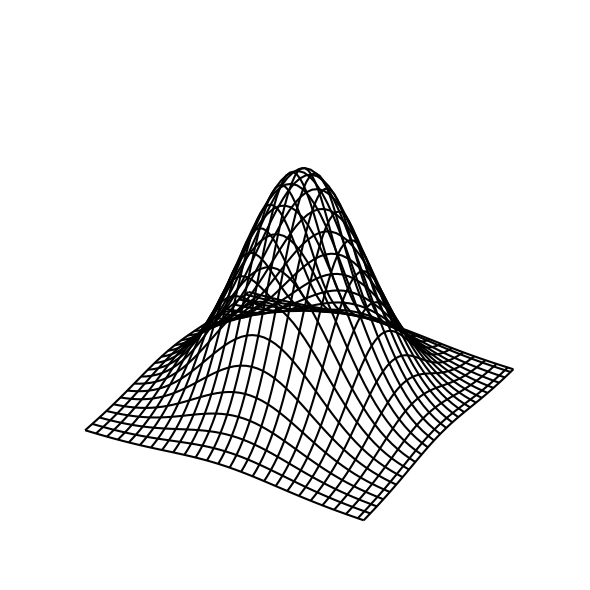

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define parameters
mu_x, mu_y = 0, 0
sigma = 2.0

# Create grid
x = np.linspace(-5, 5, 50)
y = np.linspace(-5, 5, 50)
X, Y = np.meshgrid(x, y)
Z = 1 / (2 * np.pi * sigma**2) * np.exp(-((X - mu_x)**2 + (Y - mu_y)**2) / (2 * sigma**2))

# Plot mesh without axes, grids, or colors
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_wireframe(X, Y, Z, rstride=2, cstride=2, color='black')

ax.set_axis_off()
ax.grid(False)

plt.tight_layout()

# Save with transparent background
output_path = './gaussian3d.png'
fig.savefig(output_path, transparent=True)
plt.show()


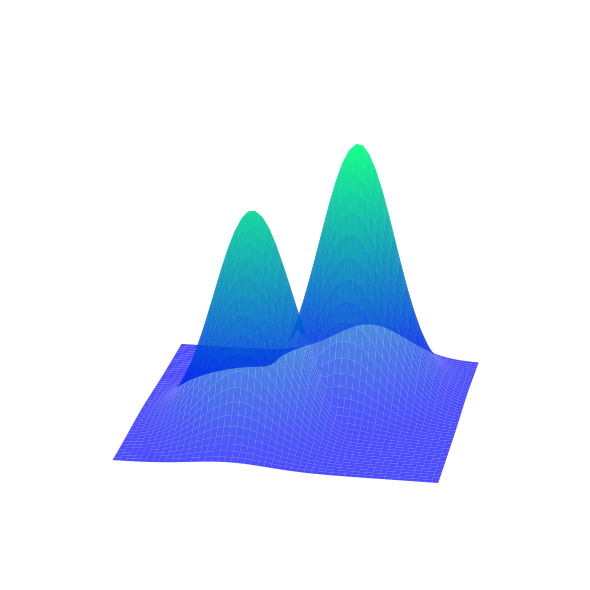

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define parameters
mu_x, mu_y   = 1, -7     # means
sigma_x      = 1.5      # std-dev in X
sigma_y      = 6      # std-dev in Y (for example)

mu_x_2, mu_y_2 = -2, 7
sigma_x_2      = 1.5      # std-dev in X
sigma_y_2      = 6      # std-dev in Y (for example)

# Create grid
x = np.linspace(-5, 5, 50)
y = np.linspace(-25, 25, 50)
X, Y = np.meshgrid(x, y)

# Compute anisotropic 2D Gaussian
norm = 1 / (2 * np.pi * sigma_x * sigma_y)
exponent = -(((X - mu_x)**2) / (2 * sigma_x**2)
             + ((Y - mu_y)**2) / (2 * sigma_y**2))
Z_1 = norm * np.exp(exponent) *0.5

norm_2 = 1 / (2 * np.pi * sigma_x_2 * sigma_y_2)
exponent_2 = -(((X - mu_x_2)**2) / (2 * sigma_x_2**2)
             + ((Y - mu_y_2)**2) / (2 * sigma_y_2**2))
Z_2 = norm_2 * np.exp(exponent_2) *0.6

Z = np.maximum(Z_1, Z_2)

# Plot surface without axes or grid, with a transparent background
fig = plt.figure(figsize=(8, 6))
ax  = fig.add_subplot(111, projection='3d')
ax.plot_surface(
    X, Y, Z,
    alpha=0.7,
    cmap='winter',
    linewidth=1
)

# adjust view, remove axes/grids
ax.view_init(elev=20, azim=10)
ax.set_axis_off()
ax.grid(False)

plt.tight_layout()
fig.savefig('./gaussian3d_first.png', transparent=True)
plt.show()
